In [3]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
from matplotlib import colormaps
import pandas as pd
import numpy as np
import fastf1 as ff1

from fastf1 import utils
from matplotlib import pyplot as plt

# FORMULA 1 GULF AIR BAHRAIN GRAND PRIX 2024
The Bahrain Grand Prix (Arabic: جائزة البحرين الكبرى), officially known as the Gulf Air Bahrain Grand Prix for sponsorship reasons, is a Formula One motor racing event in Bahrain.[1] The first race took place at the Bahrain International Circuit on 4 April 2004. It made history as the first Formula One Grand Prix to be held in the Middle East, and was given the award for the "Best Organised Grand Prix" by the FIA.[2] The race has in the past been the second, third, or fourth race of the Formula One calendar. However, in the 2006 season, Bahrain swapped places with the traditional opener, the Australian Grand Prix, which was pushed back to avoid a clash with the Commonwealth Games. In 2010, Bahrain staged the opening race of the 2010 season and the cars drove the full 6.299 km (3.914 mi) "Endurance Circuit" to celebrate F1's 'diamond jubilee'. In 2021, the Bahrain Grand Prix was the season opener again because the 2021 Australian Grand Prix was cancelled due to the COVID-19 pandemic.

The 2011 edition, due to be held on 13 March, was cancelled on 21 February due to the 2011 Bahraini protests[3] after drivers including Damon Hill and Mark Webber had protested.[4] Human rights activists called for a cancellation of the 2012 race due to reports of human rights abuses committed by the Bahraini authorities.[5] Team personnel also voiced concerns about safety,[6] but the race, nonetheless, was held as planned on 22 April 2012.

In 2014, to commemorate the tenth anniversary of the first staging of the Bahrain Grand Prix, the race was held as a night event under floodlights.[7] In so doing it became the second Formula One night race after the Singapore Grand Prix in 2008. Bahrain's inaugural night event was won by Lewis Hamilton. Subsequent races have also been night races. Source: Wikipedia

## Obtain session information

In [4]:
libraryDataF1.obtain_information('sessions',year=2024,country_acronym='BRN')

,session_key,session_name,date_start,date_end,gmt_offset,session_type,meeting_key,location,country_key,country_code,country_name,circuit_key,circuit_short_name,year
0,9465,Practice 1,2024-02-29T11:30:00+00:00,2024-02-29T12:30:00+00:00,03:00:00,Practice,1229,Sakhir,36,BRN,Bahrain,63,Sakhir,2024
1,9466,Practice 2,2024-02-29T15:00:00+00:00,2024-02-29T16:00:00+00:00,03:00:00,Practice,1229,Sakhir,36,BRN,Bahrain,63,Sakhir,2024
2,9467,Practice 3,2024-03-01T12:30:00+00:00,2024-03-01T13:30:00+00:00,03:00:00,Practice,1229,Sakhir,36,BRN,Bahrain,63,Sakhir,2024
3,9468,Qualifying,2024-03-01T16:00:00+00:00,2024-03-01T17:00:00+00:00,03:00:00,Qualifying,1229,Sakhir,36,BRN,Bahrain,63,Sakhir,2024
4,9472,Race,2024-03-02T15:00:00+00:00,2024-03-02T17:00:00+00:00,03:00:00,Race,1229,Sakhir,36,BRN,Bahrain,63,Sakhir,2024


## Free Practice 1
### Obtain setup

In [5]:
practice = libraryDataF1.obtain_information('laps',session_key=9465)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9465)
drivers = libraryDataF1.obtain_information('drivers',session_key=9465)

In [6]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

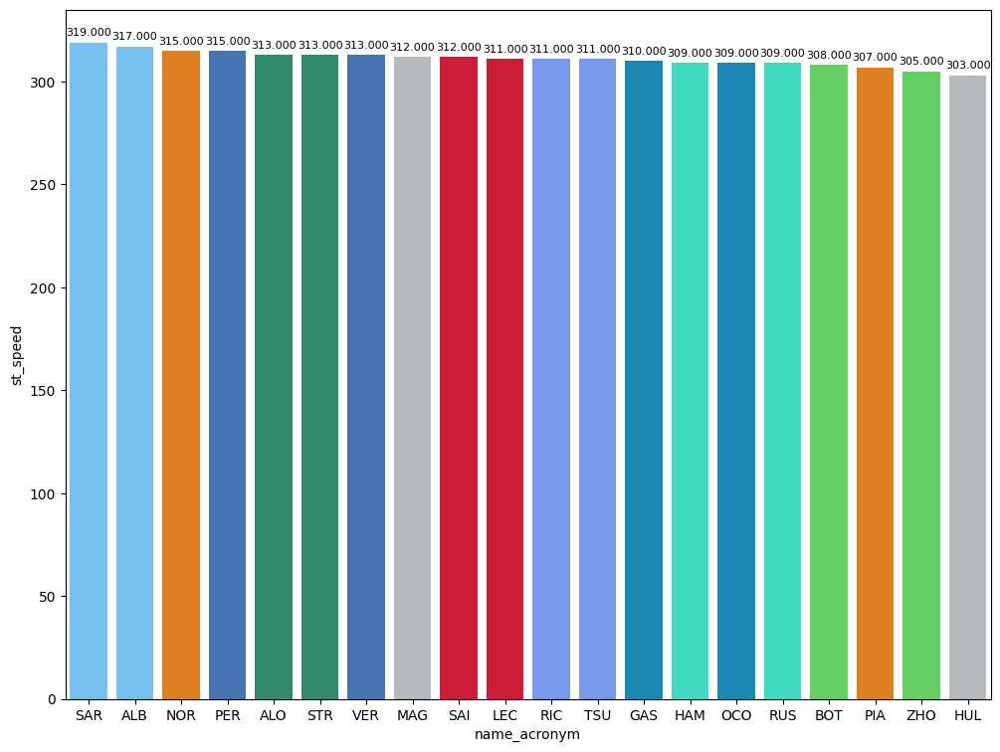

In [7]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

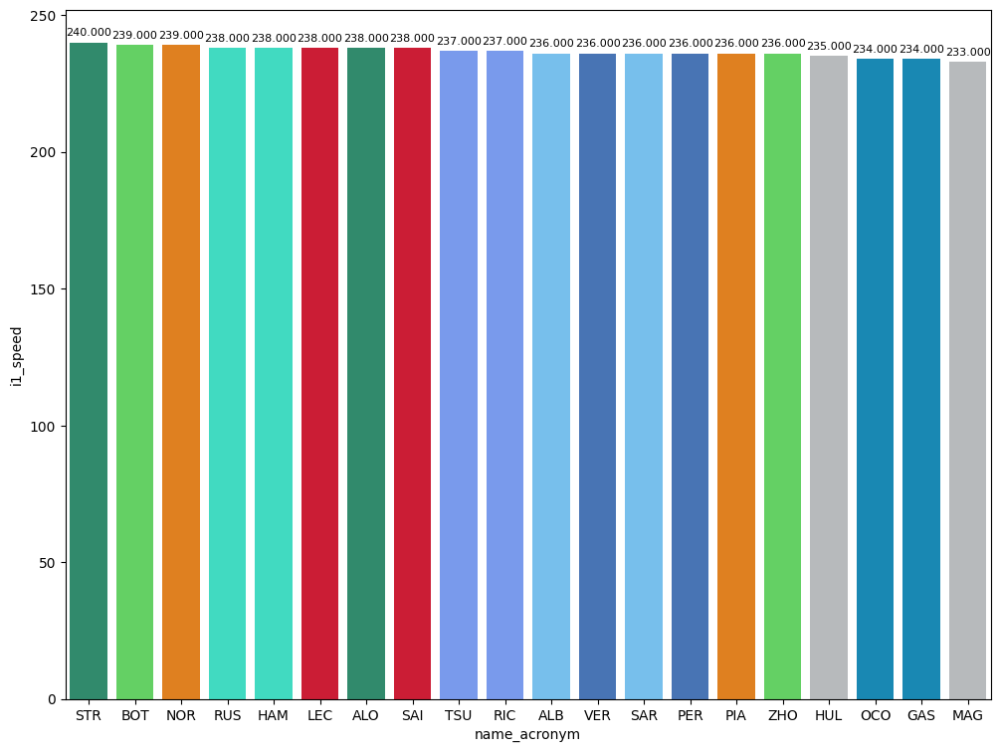

In [8]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

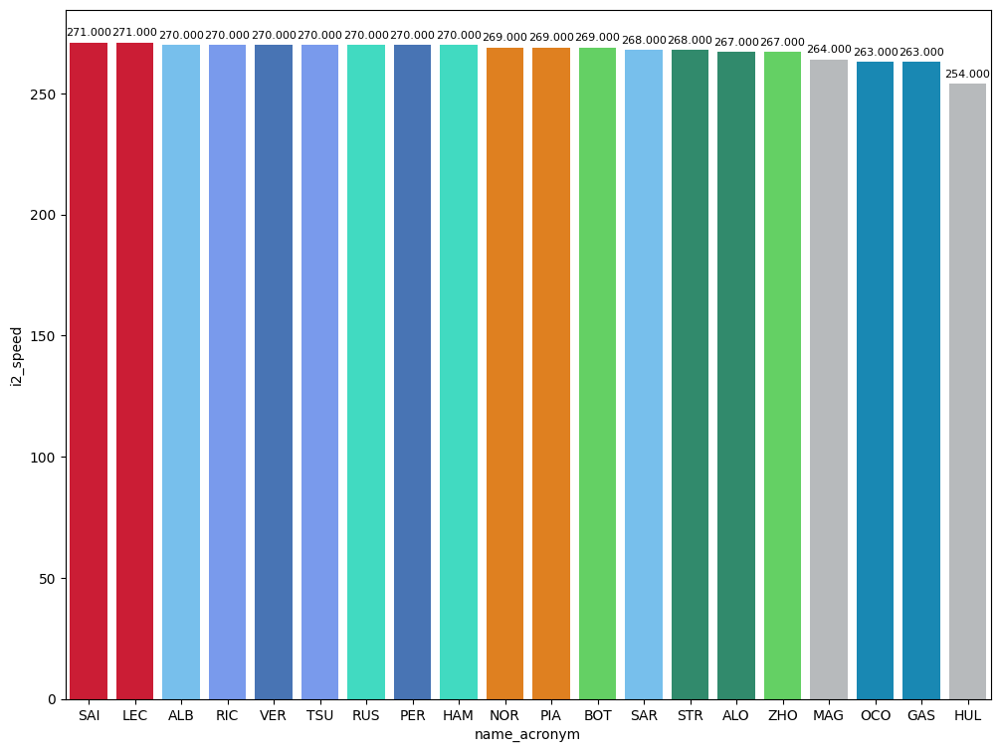

In [9]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [10]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
297,Fernando ALONSO,MEDIUM,29.892,39.920,23.381,93.193
205,Daniel RICCIARDO,SOFT,29.787,39.866,23.216,92.869


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [11]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


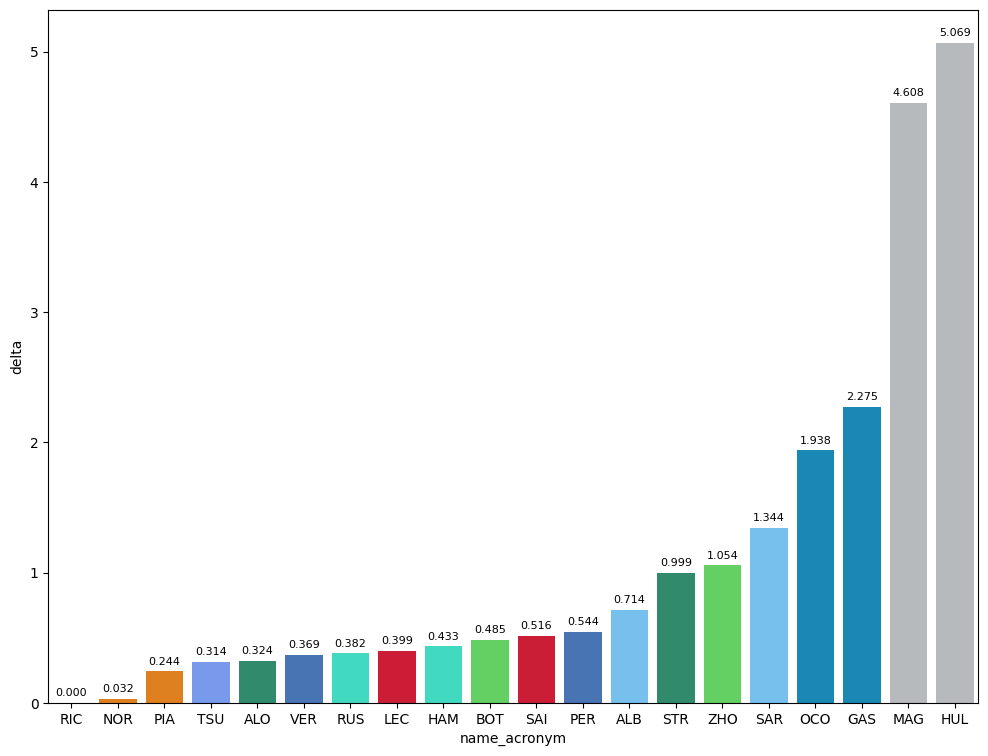

In [12]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

In [13]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
sectorPace[['duration_sector_1','full_name','compound','lap_duration','lap_number']]

,duration_sector_1,full_name,compound,lap_duration,lap_number
198,29.715,Yuki TSUNODA,SOFT,93.183,11
205,29.787,Daniel RICCIARDO,SOFT,92.869,12
129,29.835,Fernando ALONSO,MEDIUM,93.929,6
166,29.925,Oscar PIASTRI,SOFT,93.113,8
195,29.930,Lewis HAMILTON,MEDIUM,93.302,9
185,29.939,Max VERSTAPPEN,MEDIUM,110.215,8
235,29.946,Sergio PEREZ,MEDIUM,93.460,14
250,29.957,Alexander ALBON,MEDIUM,93.583,11
178,30.005,Lando NORRIS,SOFT,92.901,11
203,30.014,Charles LECLERC,MEDIUM,93.268,11


In [14]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
sectorPace[['duration_sector_2','full_name','compound','lap_duration','lap_number']]

,duration_sector_2,full_name,compound,lap_duration,lap_number
178,39.663,Lando NORRIS,SOFT,92.901,11
203,39.844,Charles LECLERC,MEDIUM,93.268,11
166,39.852,Oscar PIASTRI,SOFT,93.113,8
205,39.866,Daniel RICCIARDO,SOFT,92.869,12
207,39.914,George RUSSELL,MEDIUM,93.251,12
297,39.920,Fernando ALONSO,MEDIUM,93.193,13
236,39.953,Max VERSTAPPEN,MEDIUM,93.238,11
213,39.965,Valtteri BOTTAS,SOFT,93.354,11
220,40.041,Carlos SAINZ,MEDIUM,93.385,14
198,40.048,Yuki TSUNODA,SOFT,93.183,11


In [15]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
sectorPace[['duration_sector_3','full_name','compound','lap_duration','lap_number']]

,duration_sector_3,full_name,compound,lap_duration,lap_number
220,23.147,Carlos SAINZ,MEDIUM,93.385,14
207,23.175,George RUSSELL,MEDIUM,93.251,12
96,23.202,Lewis HAMILTON,MEDIUM,93.925,6
184,23.214,Sergio PEREZ,MEDIUM,93.413,11
205,23.216,Daniel RICCIARDO,SOFT,92.869,12
178,23.233,Lando NORRIS,SOFT,92.901,11
272,23.235,Alexander ALBON,MEDIUM,95.267,13
213,23.261,Valtteri BOTTAS,SOFT,93.354,11
236,23.262,Max VERSTAPPEN,MEDIUM,93.238,11
166,23.336,Oscar PIASTRI,SOFT,93.113,8


### Mean pace with the different compound used on the session

In [16]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 95").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,93.414000
MEDIUM,94.184213


## Free Practice 2
### Obtain setup

In [17]:
practice = libraryDataF1.obtain_information('laps',session_key=9466)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9466)
drivers = libraryDataF1.obtain_information('drivers',session_key=9466)

In [18]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

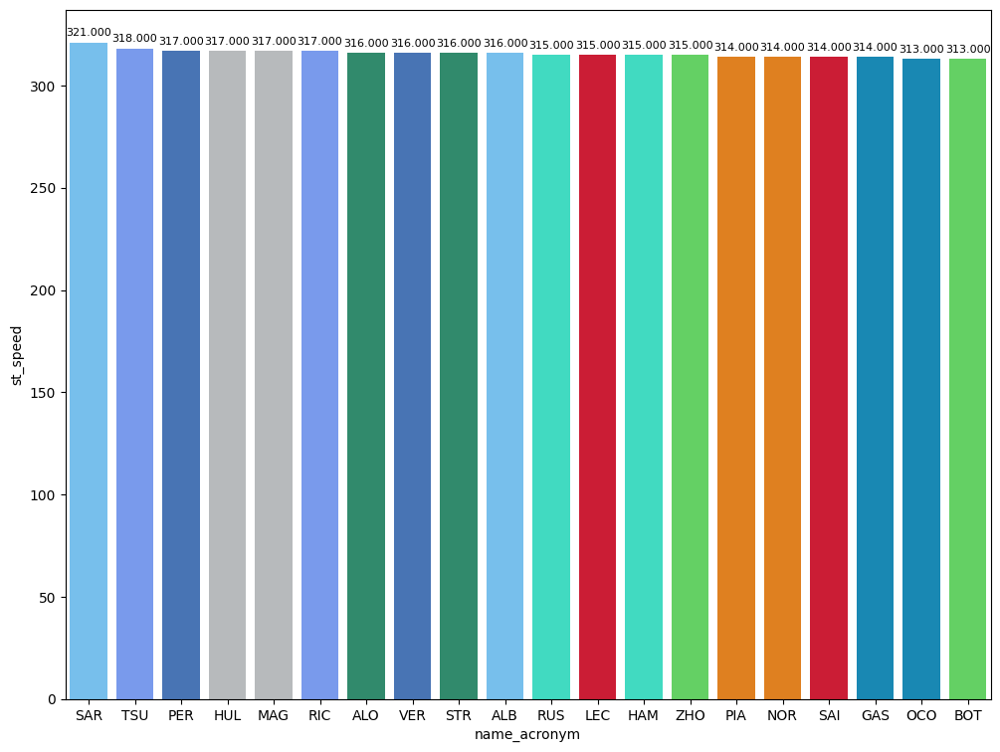

In [19]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

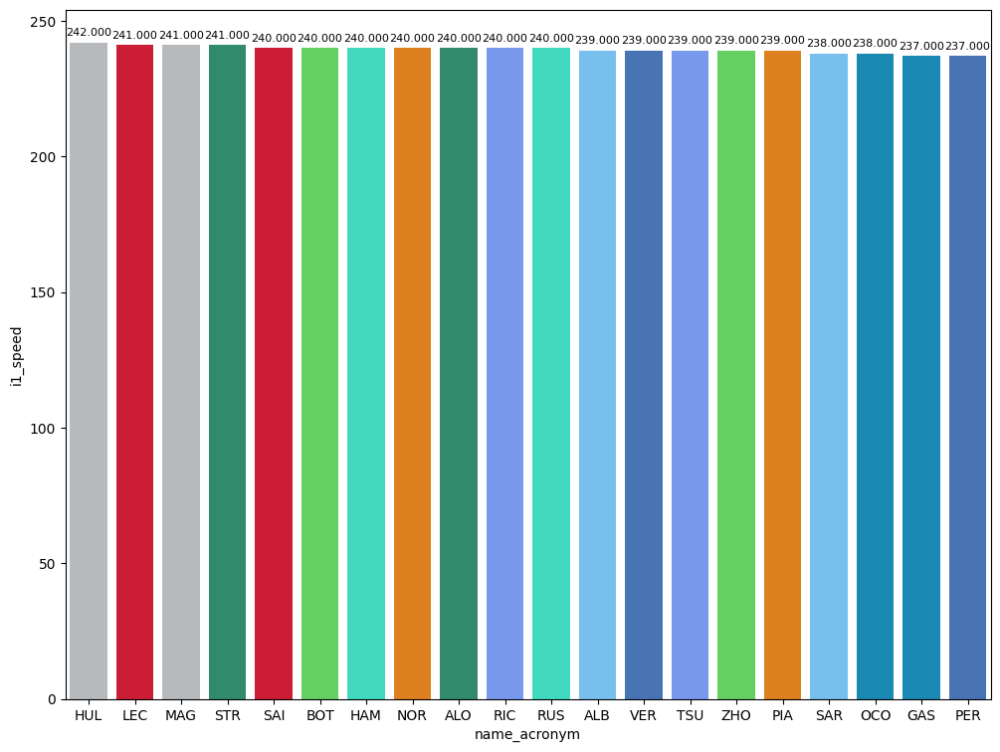

In [20]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

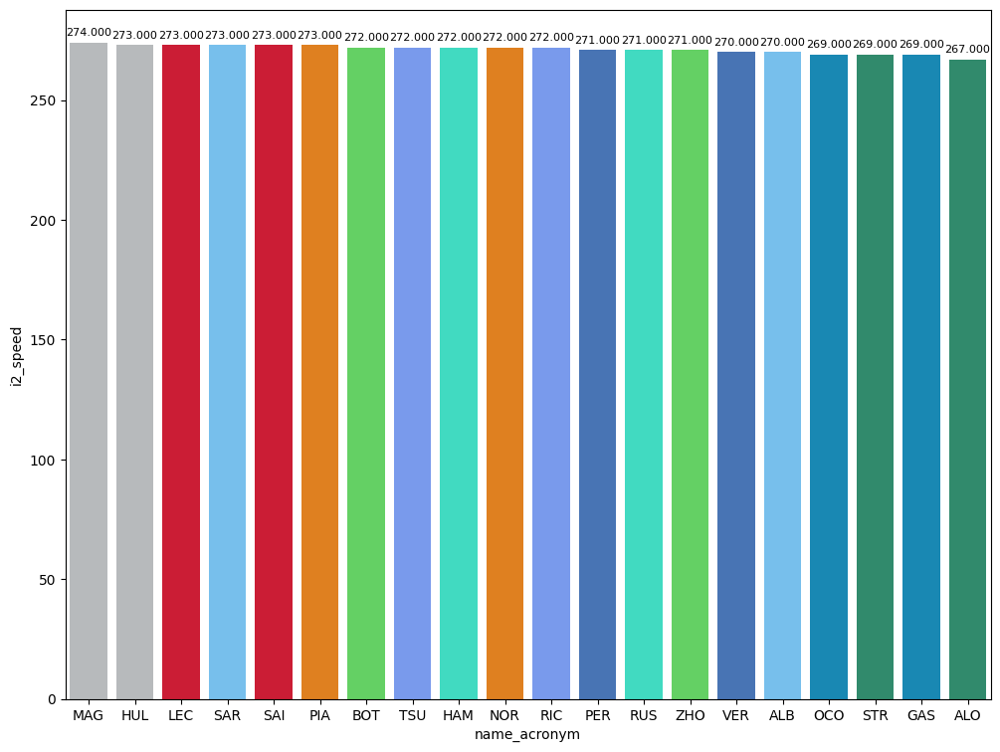

In [21]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [22]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
19,Alexander ALBON,MEDIUM,29.741,39.646,23.027,92.414
165,Lewis HAMILTON,SOFT,29.037,38.734,22.603,90.374


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [23]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


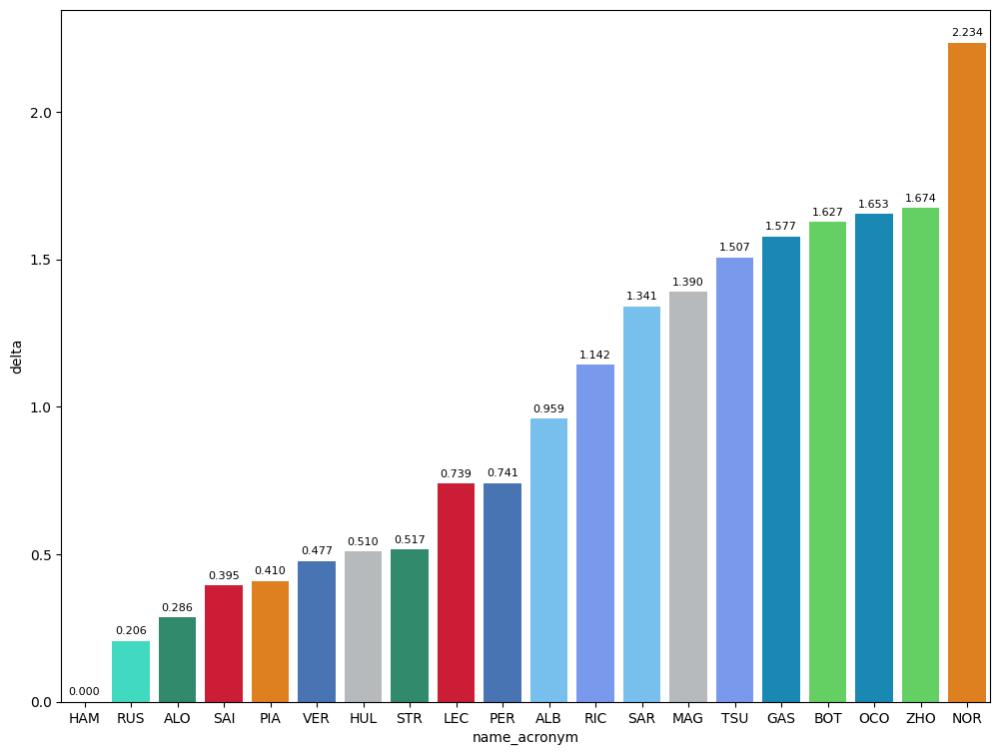

In [24]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

In [25]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
sectorPace[['duration_sector_1','full_name','compound','lap_duration','lap_number']]

,duration_sector_1,full_name,compound,lap_duration,lap_number
165,29.037,Lewis HAMILTON,SOFT,90.374,8
197,29.081,George RUSSELL,SOFT,90.580,8
139,29.105,Nico HULKENBERG,SOFT,90.884,8
186,29.131,Max VERSTAPPEN,SOFT,90.851,8
194,29.135,Lance STROLL,SOFT,90.891,11
170,29.192,Sergio PEREZ,SOFT,91.115,8
213,29.252,Fernando ALONSO,SOFT,90.660,9
144,29.266,Oscar PIASTRI,SOFT,90.784,8
89,29.331,Charles LECLERC,SOFT,91.171,5
198,29.341,Alexander ALBON,SOFT,91.333,11


In [26]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
sectorPace[['duration_sector_2','full_name','compound','lap_duration','lap_number']]

,duration_sector_2,full_name,compound,lap_duration,lap_number
144,38.665,Oscar PIASTRI,SOFT,90.784,8
213,38.692,Fernando ALONSO,SOFT,90.660,9
143,38.705,Carlos SAINZ,SOFT,90.769,8
165,38.734,Lewis HAMILTON,SOFT,90.374,8
186,38.834,Max VERSTAPPEN,SOFT,90.851,8
89,38.920,Charles LECLERC,SOFT,91.171,5
197,38.923,George RUSSELL,SOFT,90.580,8
194,38.939,Lance STROLL,SOFT,90.891,11
170,39.047,Sergio PEREZ,SOFT,91.115,8
139,39.074,Nico HULKENBERG,SOFT,90.884,8


In [27]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
sectorPace[['duration_sector_3','full_name','compound','lap_duration','lap_number']]

,duration_sector_3,full_name,compound,lap_duration,lap_number
197,22.576,George RUSSELL,SOFT,90.580,8
165,22.603,Lewis HAMILTON,SOFT,90.374,8
193,22.700,Charles LECLERC,SOFT,91.113,11
139,22.705,Nico HULKENBERG,SOFT,90.884,8
52,22.706,Fernando ALONSO,SOFT,91.035,2
143,22.711,Carlos SAINZ,SOFT,90.769,8
195,22.779,Daniel RICCIARDO,SOFT,91.516,10
194,22.817,Lance STROLL,SOFT,90.891,11
113,22.843,Max VERSTAPPEN,SOFT,91.161,5
144,22.853,Oscar PIASTRI,SOFT,90.784,8


### Mean pace with the different compound used on the session

In [28]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 95").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,91.701582
MEDIUM,93.083267


### Long runs

In [29]:
MINIMUN_SECONDS = 96
MAXIMUM_SECONDS = 99

#### Red Bull Racing

In [30]:
stintInformation.query('driver_number == 1 or driver_number == 11')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1229,9466,1,11,1,4,SOFT,0
11,1229,9466,1,1,1,7,SOFT,0
20,1229,9466,2,11,5,7,SOFT,3
31,1229,9466,2,1,8,10,SOFT,0
32,1229,9466,3,11,8,10,SOFT,0
55,1229,9466,3,1,11,26,SOFT,3
57,1229,9466,4,11,11,27,SOFT,3


In [31]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
235,Max VERSTAPPEN,SOFT,2024-02-29T15:39:51.886000+00:00,11,31.246,41.938,23.823,97.007
249,Max VERSTAPPEN,SOFT,2024-02-29T15:41:28.880000+00:00,12,31.071,41.783,23.860,96.714
267,Max VERSTAPPEN,SOFT,2024-02-29T15:43:05.628000+00:00,13,30.981,41.560,23.986,96.527
286,Max VERSTAPPEN,SOFT,2024-02-29T15:44:42.618000+00:00,14,31.053,41.590,23.856,96.499
304,Max VERSTAPPEN,SOFT,2024-02-29T15:46:18.646000+00:00,15,31.162,41.598,23.872,96.632
324,Max VERSTAPPEN,SOFT,2024-02-29T15:47:55.170000+00:00,16,31.118,41.613,23.815,96.546
364,Max VERSTAPPEN,SOFT,2024-02-29T15:51:12.475000+00:00,18,31.067,41.454,24.107,96.628
384,Max VERSTAPPEN,SOFT,2024-02-29T15:52:48.829000+00:00,19,31.159,41.641,23.932,96.732
404,Max VERSTAPPEN,SOFT,2024-02-29T15:54:25.495000+00:00,20,31.316,41.676,23.910,96.902
444,Max VERSTAPPEN,SOFT,2024-02-29T15:57:44.600000+00:00,22,31.110,41.527,24.008,96.645


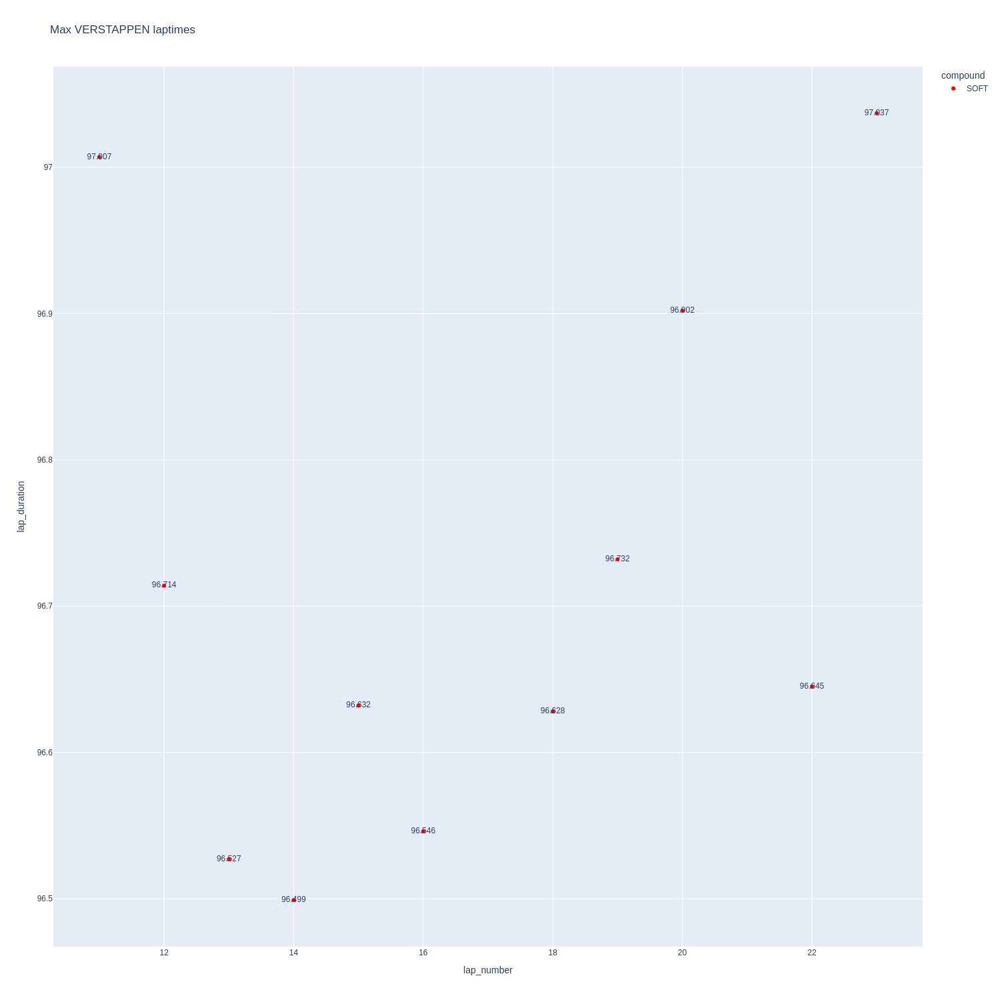

In [32]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

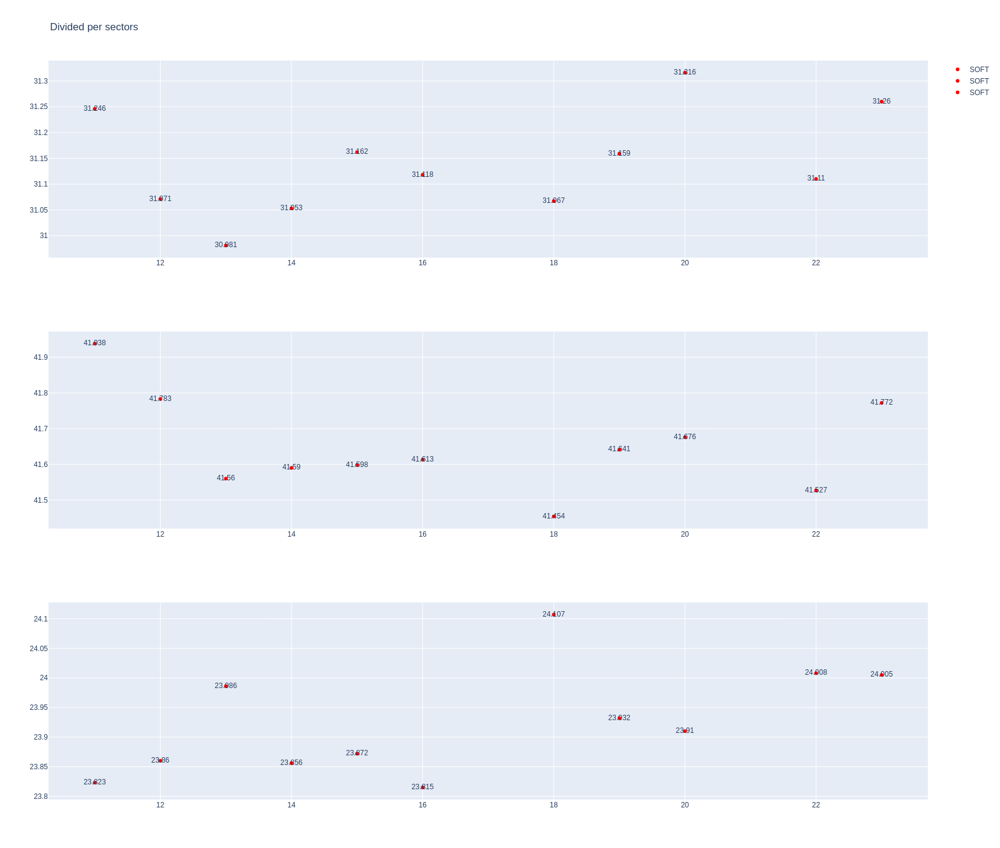

In [33]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [34]:
data = libraryDataF1.getinfolongruns(jointables2,11,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
232,Sergio PEREZ,SOFT,2024-02-29T15:39:28.027000+00:00,12,30.875,41.315,23.822,96.012
247,Sergio PEREZ,SOFT,2024-02-29T15:41:03.947000+00:00,13,30.955,41.593,23.863,96.411
262,Sergio PEREZ,SOFT,2024-02-29T15:42:40.386000+00:00,14,31.335,41.579,24.052,96.966
280,Sergio PEREZ,SOFT,2024-02-29T15:44:17.411000+00:00,15,31.156,41.741,23.990,96.887
300,Sergio PEREZ,SOFT,2024-02-29T15:45:54.279000+00:00,16,31.179,41.915,24.063,97.157
340,Sergio PEREZ,SOFT,2024-02-29T15:49:11.349000+00:00,18,31.218,41.957,24.043,97.218
360,Sergio PEREZ,SOFT,2024-02-29T15:50:48.476000+00:00,19,31.282,41.840,24.174,97.296
380,Sergio PEREZ,SOFT,2024-02-29T15:52:25.856000+00:00,20,31.256,41.729,24.128,97.113
420,Sergio PEREZ,SOFT,2024-02-29T15:55:44.044000+00:00,22,31.153,41.840,23.961,96.954
459,Sergio PEREZ,SOFT,2024-02-29T15:59:01.413000+00:00,24,31.198,41.798,24.052,97.048


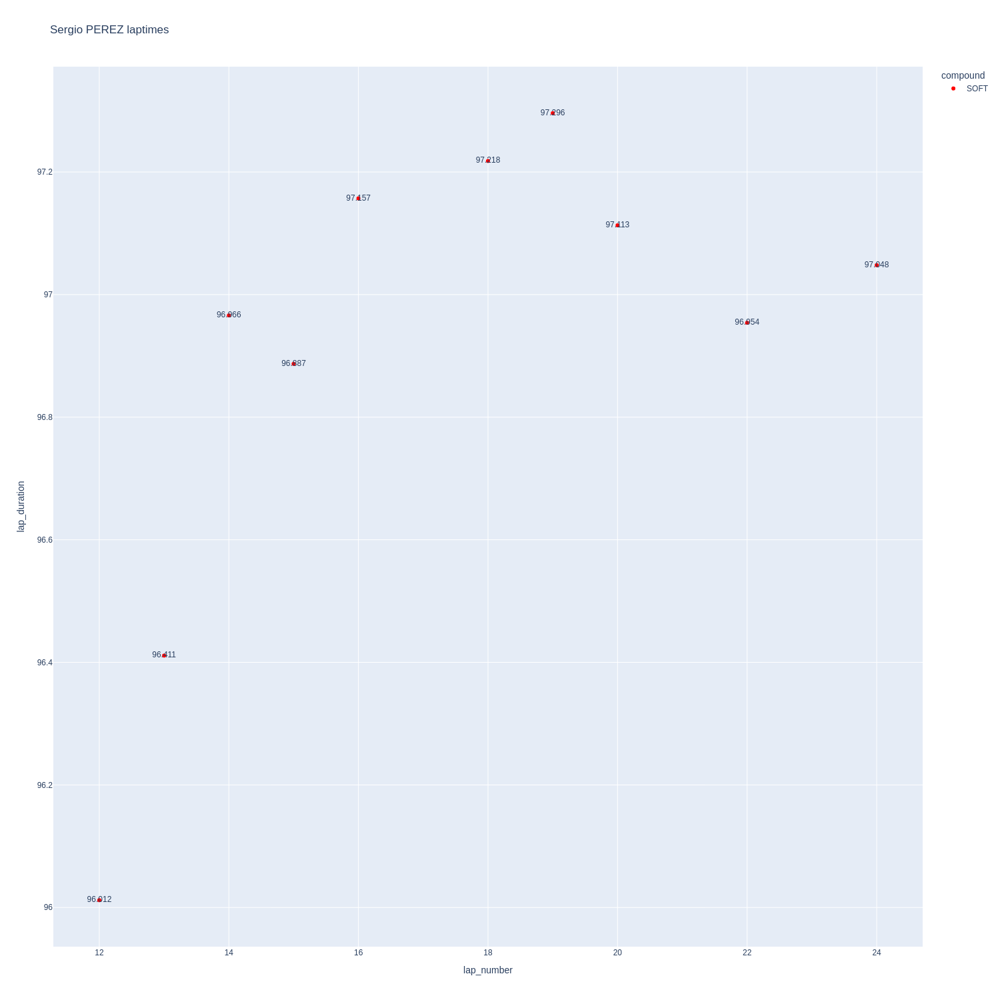

In [35]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

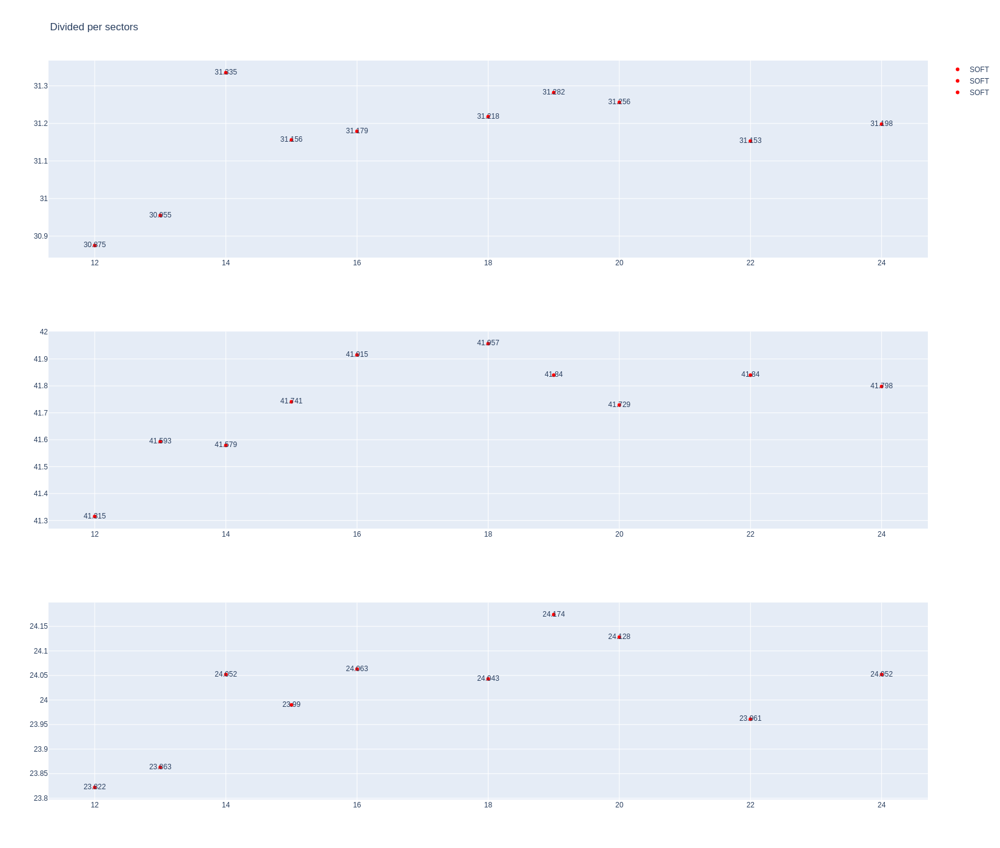

In [36]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [37]:
stintInformation.query('driver_number == 55 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1229,9466,1,16,1,4,SOFT,0
4,1229,9466,1,55,1,4,SOFT,0
21,1229,9466,2,16,5,7,SOFT,3
23,1229,9466,2,55,5,7,SOFT,3
36,1229,9466,3,55,8,10,SOFT,0
40,1229,9466,3,16,8,13,SOFT,0
49,1229,9466,4,55,11,12,SOFT,3
62,1229,9466,5,55,13,26,SOFT,0
68,1229,9466,4,16,14,27,SOFT,0


In [38]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
264,Charles LECLERC,SOFT,2024-02-29T15:42:47.676000+00:00,14,31.259,42.189,23.849,97.297
282,Charles LECLERC,SOFT,2024-02-29T15:44:25.092000+00:00,15,31.317,42.001,23.939,97.257
301,Charles LECLERC,SOFT,2024-02-29T15:46:02.352000+00:00,16,31.066,41.707,23.863,96.636
321,Charles LECLERC,SOFT,2024-02-29T15:47:38.911000+00:00,17,31.153,41.586,23.890,96.629
361,Charles LECLERC,SOFT,2024-02-29T15:50:56.498000+00:00,19,31.216,41.850,23.996,97.062
381,Charles LECLERC,SOFT,2024-02-29T15:52:33.445000+00:00,20,31.303,41.585,24.155,97.043
401,Charles LECLERC,SOFT,2024-02-29T15:54:10.602000+00:00,21,31.362,41.825,24.108,97.295
421,Charles LECLERC,SOFT,2024-02-29T15:55:47.911000+00:00,22,31.322,41.821,24.124,97.267
441,Charles LECLERC,SOFT,2024-02-29T15:57:25.187000+00:00,23,31.312,42.014,24.047,97.373
460,Charles LECLERC,SOFT,2024-02-29T15:59:02.524000+00:00,24,31.124,42.014,24.251,97.389


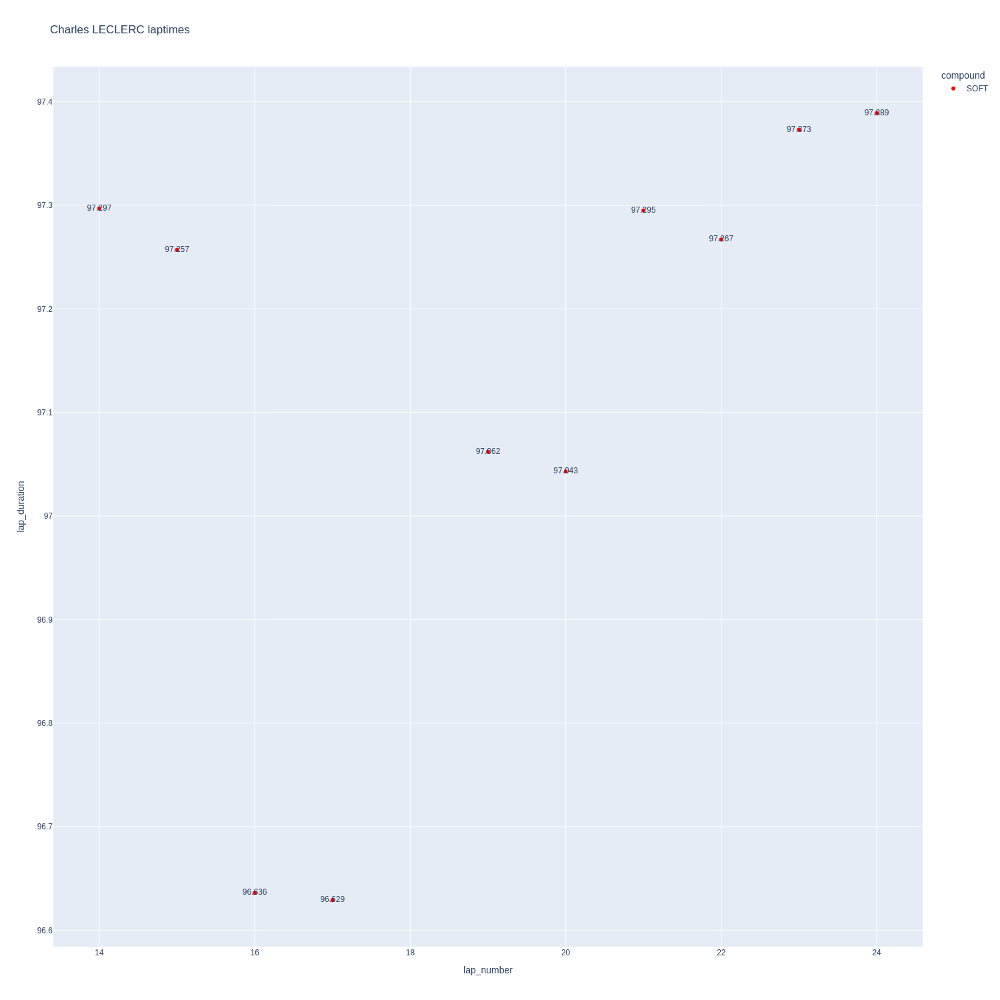

In [39]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

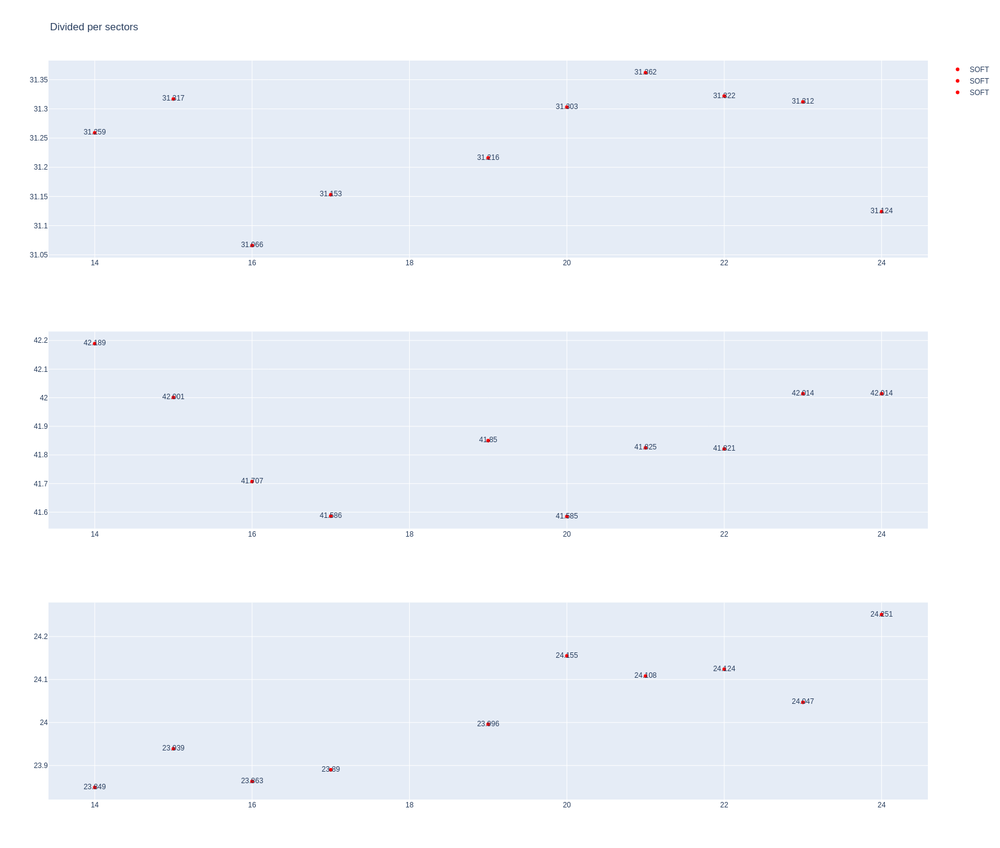

In [40]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [41]:
data = libraryDataF1.getinfolongruns(jointables2,55,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
259,Carlos SAINZ,SOFT,2024-02-29T15:42:28.030000+00:00,13,31.517,41.995,23.842,97.354
277,Carlos SAINZ,SOFT,2024-02-29T15:44:05.250000+00:00,14,31.244,41.733,23.772,96.749
297,Carlos SAINZ,SOFT,2024-02-29T15:45:42.055000+00:00,15,31.364,41.734,23.851,96.949
317,Carlos SAINZ,SOFT,2024-02-29T15:47:19.165000+00:00,16,31.391,41.922,23.861,97.174
357,Carlos SAINZ,SOFT,2024-02-29T15:50:38.120000+00:00,18,31.416,41.845,24.022,97.283
377,Carlos SAINZ,SOFT,2024-02-29T15:52:15.285000+00:00,19,31.505,41.912,23.968,97.385
397,Carlos SAINZ,SOFT,2024-02-29T15:53:52.666000+00:00,20,31.596,41.980,23.947,97.523
417,Carlos SAINZ,SOFT,2024-02-29T15:55:30.148000+00:00,21,31.666,42.084,24.058,97.808
461,Carlos SAINZ,SOFT,2024-02-29T15:59:08.818000+00:00,23,31.273,41.894,24.031,97.198


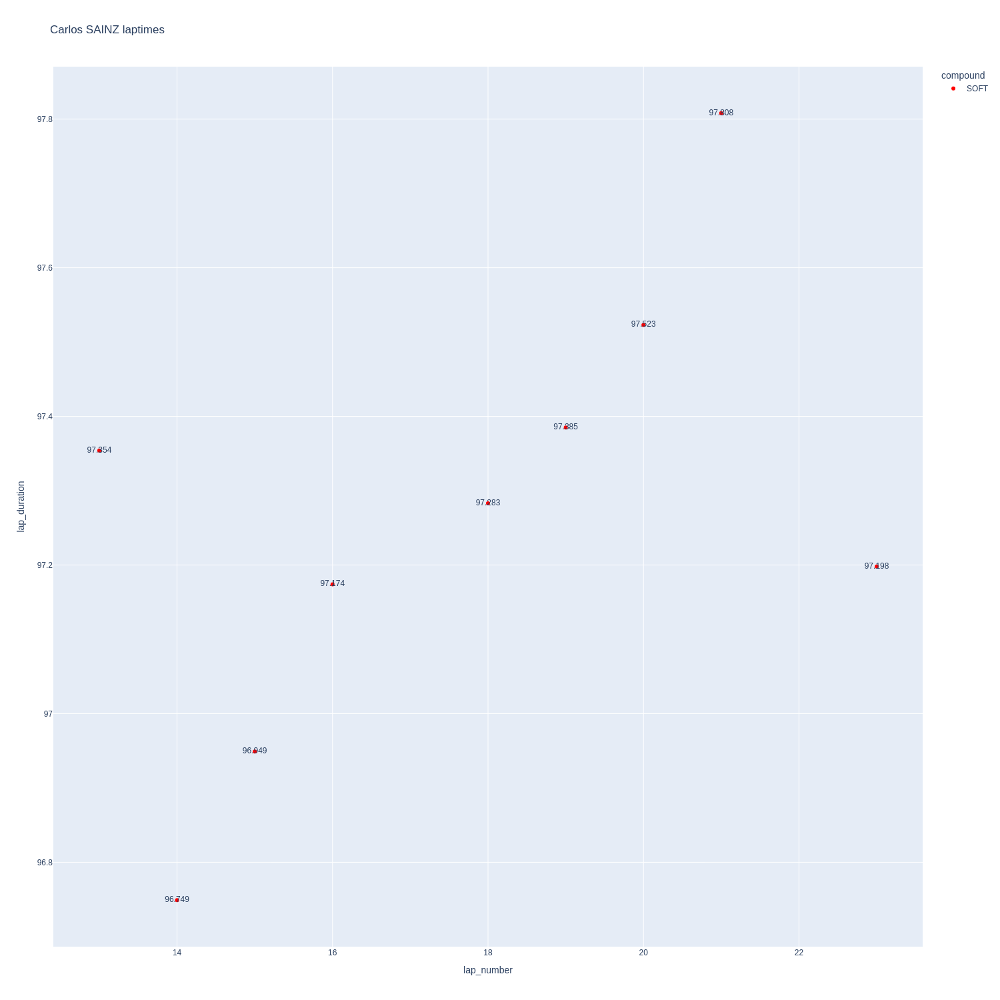

In [42]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

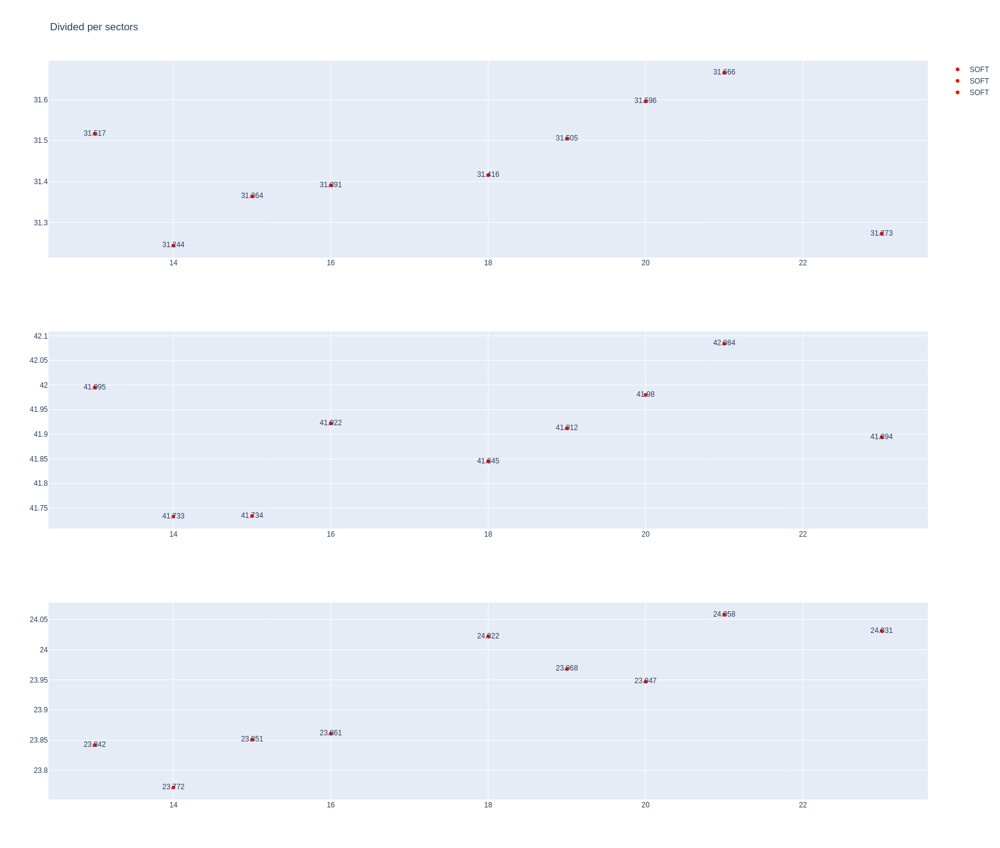

In [43]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [44]:
stintInformation.query('driver_number == 63 or driver_number == 44')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1229,9466,1,44,1,4,SOFT,0
10,1229,9466,1,63,1,6,SOFT,0
22,1229,9466,2,44,5,7,SOFT,3
27,1229,9466,2,63,7,7,SOFT,0
35,1229,9466,3,44,8,10,SOFT,0
37,1229,9466,3,63,8,10,SOFT,0
54,1229,9466,4,63,11,24,SOFT,3
56,1229,9466,4,44,11,26,SOFT,0


In [45]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
237,Lewis HAMILTON,SOFT,2024-02-29T15:40:05.708000+00:00,11,31.261,42.288,23.870,97.419
253,Lewis HAMILTON,SOFT,2024-02-29T15:41:43.175000+00:00,12,31.200,41.973,23.843,97.016
271,Lewis HAMILTON,SOFT,2024-02-29T15:43:20.124000+00:00,13,31.092,41.766,23.811,96.669
290,Lewis HAMILTON,SOFT,2024-02-29T15:44:56.840000+00:00,14,31.187,41.800,23.888,96.875
308,Lewis HAMILTON,SOFT,2024-02-29T15:46:33.728000+00:00,15,31.156,41.852,23.858,96.866
348,Lewis HAMILTON,SOFT,2024-02-29T15:49:51.449000+00:00,17,31.289,41.875,23.840,97.004
368,Lewis HAMILTON,SOFT,2024-02-29T15:51:28.411000+00:00,18,32.014,42.513,23.966,98.493
408,Lewis HAMILTON,SOFT,2024-02-29T15:54:46.096000+00:00,20,31.195,41.895,24.055,97.145
450,Lewis HAMILTON,SOFT,2024-02-29T15:58:16.227000+00:00,22,31.398,42.026,24.002,97.426
470,Lewis HAMILTON,SOFT,2024-02-29T15:59:53.693000+00:00,23,31.431,42.008,24.018,97.457


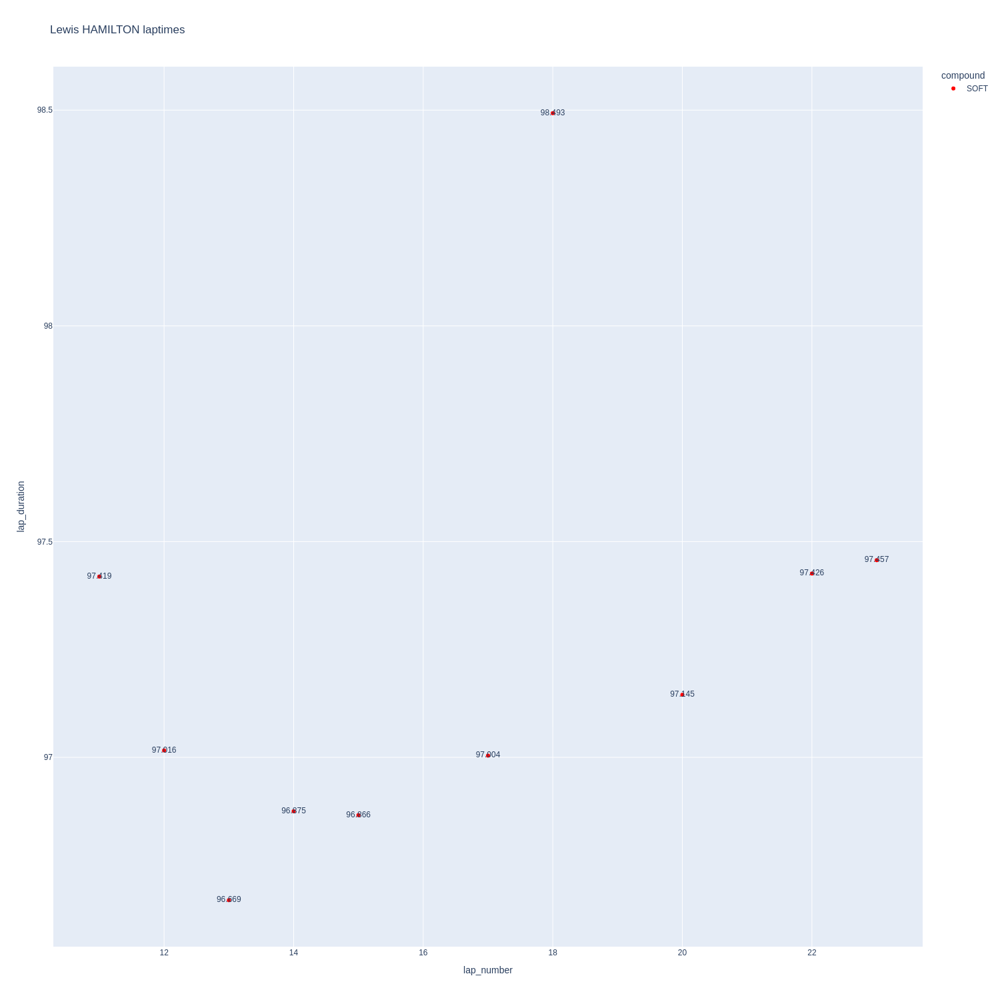

In [46]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

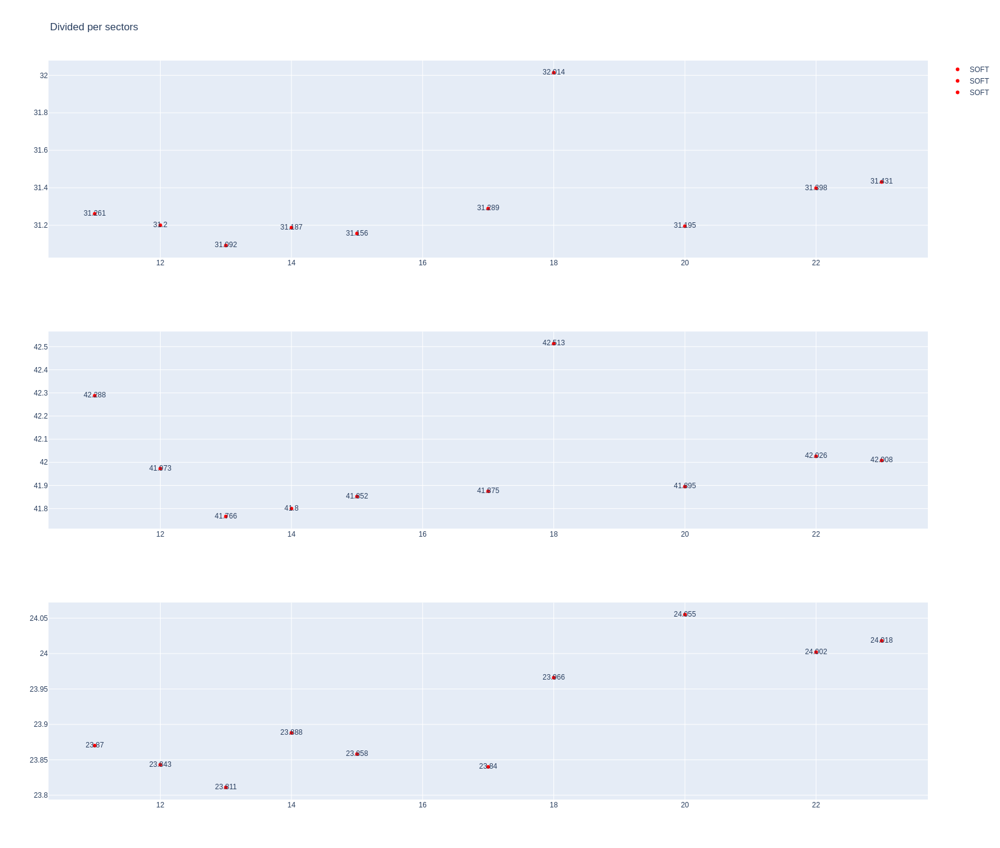

In [47]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [48]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
106,George RUSSELL,SOFT,2024-02-29T15:13:28.768000+00:00,5,29.706,40.953,27.979,98.638
266,George RUSSELL,SOFT,2024-02-29T15:43:01.665000+00:00,11,31.093,41.862,23.850,96.805
284,George RUSSELL,SOFT,2024-02-29T15:44:38.585000+00:00,12,31.183,41.771,23.851,96.805
303,George RUSSELL,SOFT,2024-02-29T15:46:15.485000+00:00,13,31.064,42.015,23.781,96.860
323,George RUSSELL,SOFT,2024-02-29T15:47:52.223000+00:00,14,31.092,41.867,23.719,96.678
343,George RUSSELL,SOFT,2024-02-29T15:49:28.770000+00:00,15,31.153,42.078,23.752,96.983
363,George RUSSELL,SOFT,2024-02-29T15:51:05.799000+00:00,16,31.148,41.750,23.936,96.834
383,George RUSSELL,SOFT,2024-02-29T15:52:42.642000+00:00,17,31.175,42.040,23.912,97.127
403,George RUSSELL,SOFT,2024-02-29T15:54:19.843000+00:00,18,30.835,42.118,23.953,96.906
423,George RUSSELL,SOFT,2024-02-29T15:55:56.708000+00:00,19,31.070,42.451,24.030,97.551


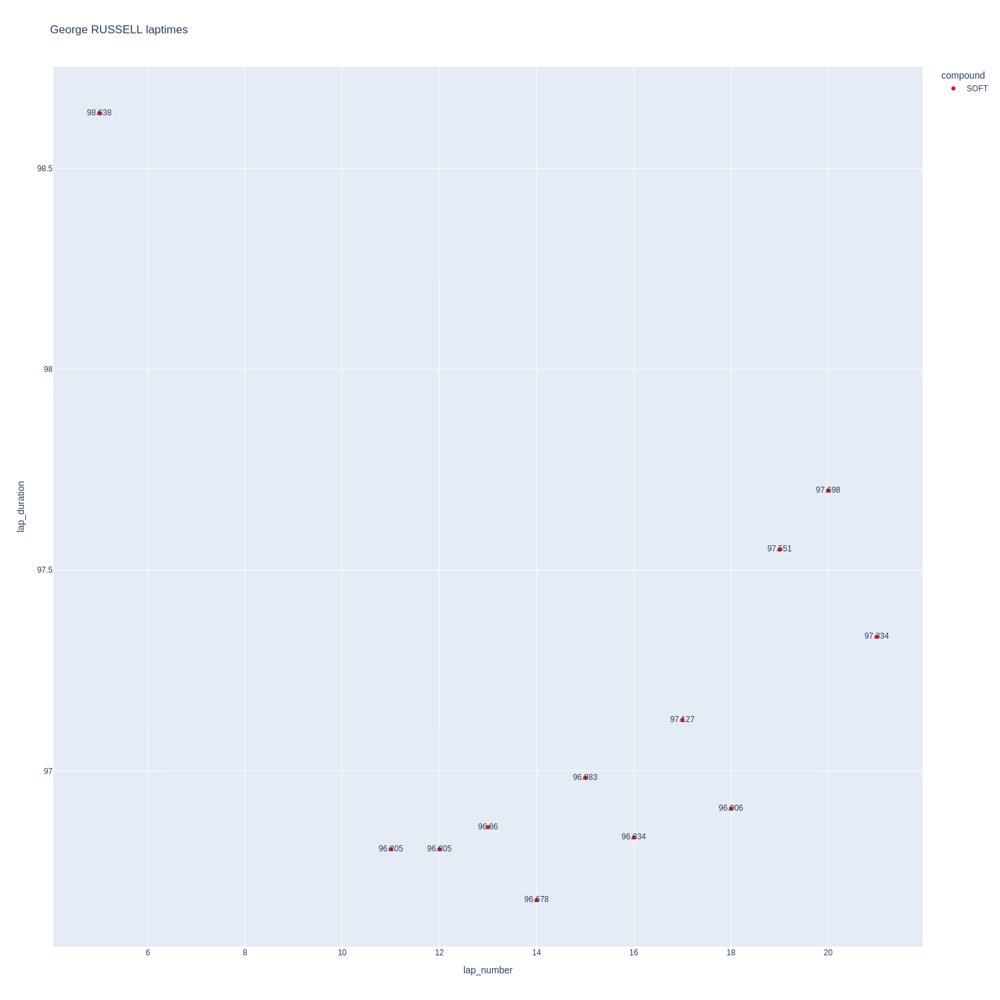

In [49]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

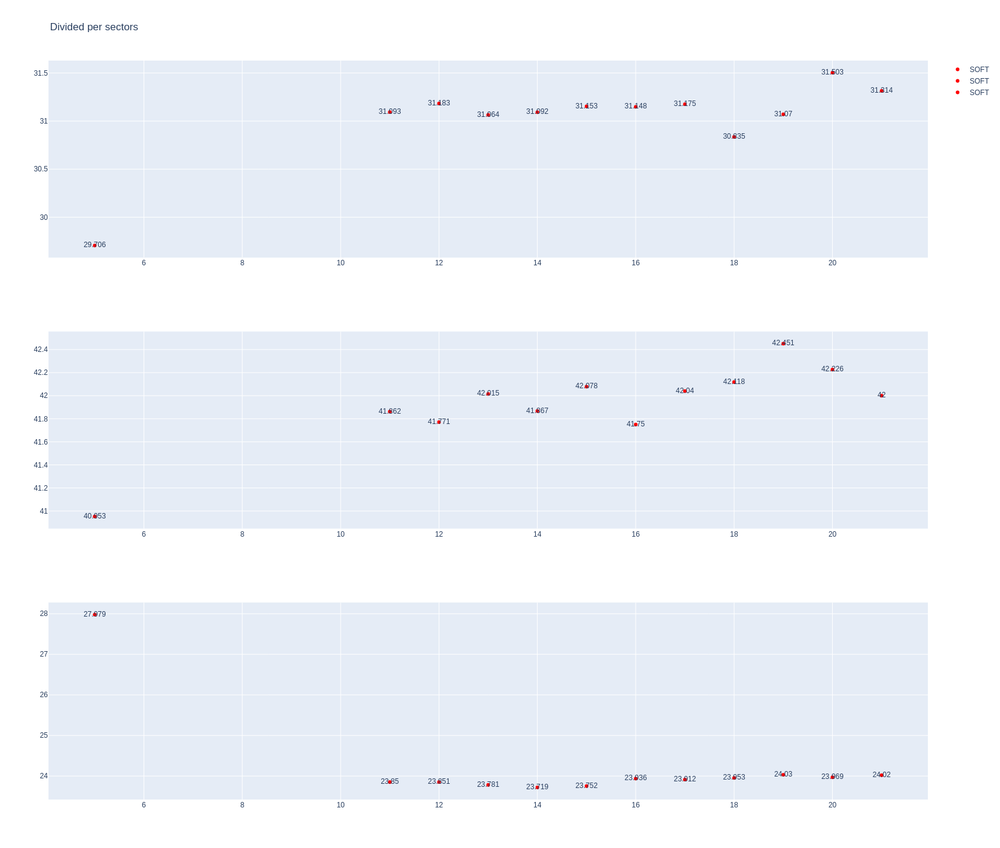

In [50]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [51]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1229,9466,1,4,1,6,MEDIUM,0
17,1229,9466,1,81,1,7,MEDIUM,0
29,1229,9466,2,4,7,9,SOFT,0
38,1229,9466,2,81,8,10,SOFT,0
48,1229,9466,3,4,10,22,SOFT,3
52,1229,9466,3,81,11,23,SOFT,0
76,1229,9466,4,4,23,26,MEDIUM,5
77,1229,9466,4,81,24,28,MEDIUM,6


In [52]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
223,Lando NORRIS,SOFT,2024-02-29T15:37:13.997000+00:00,10,31.128,41.794,23.787,96.709
228,Lando NORRIS,SOFT,2024-02-29T15:38:50.653000+00:00,11,31.193,42.154,23.934,97.281
240,Lando NORRIS,SOFT,2024-02-29T15:40:28+00:00,12,31.201,41.938,23.890,97.029
255,Lando NORRIS,SOFT,2024-02-29T15:42:05.101000+00:00,13,31.187,41.785,23.972,96.944
273,Lando NORRIS,SOFT,2024-02-29T15:43:41.950000+00:00,14,31.079,41.744,24.070,96.893
293,Lando NORRIS,SOFT,2024-02-29T15:45:18.872000+00:00,15,31.125,41.940,24.384,97.449
313,Lando NORRIS,SOFT,2024-02-29T15:46:56.328000+00:00,16,31.074,42.122,23.990,97.186
333,Lando NORRIS,SOFT,2024-02-29T15:48:33.588000+00:00,17,30.936,41.993,24.015,96.944
352,Lando NORRIS,SOFT,2024-02-29T15:50:10.488000+00:00,18,31.181,42.081,24.033,97.295
372,Lando NORRIS,SOFT,2024-02-29T15:51:47.797000+00:00,19,31.107,41.786,24.133,97.026


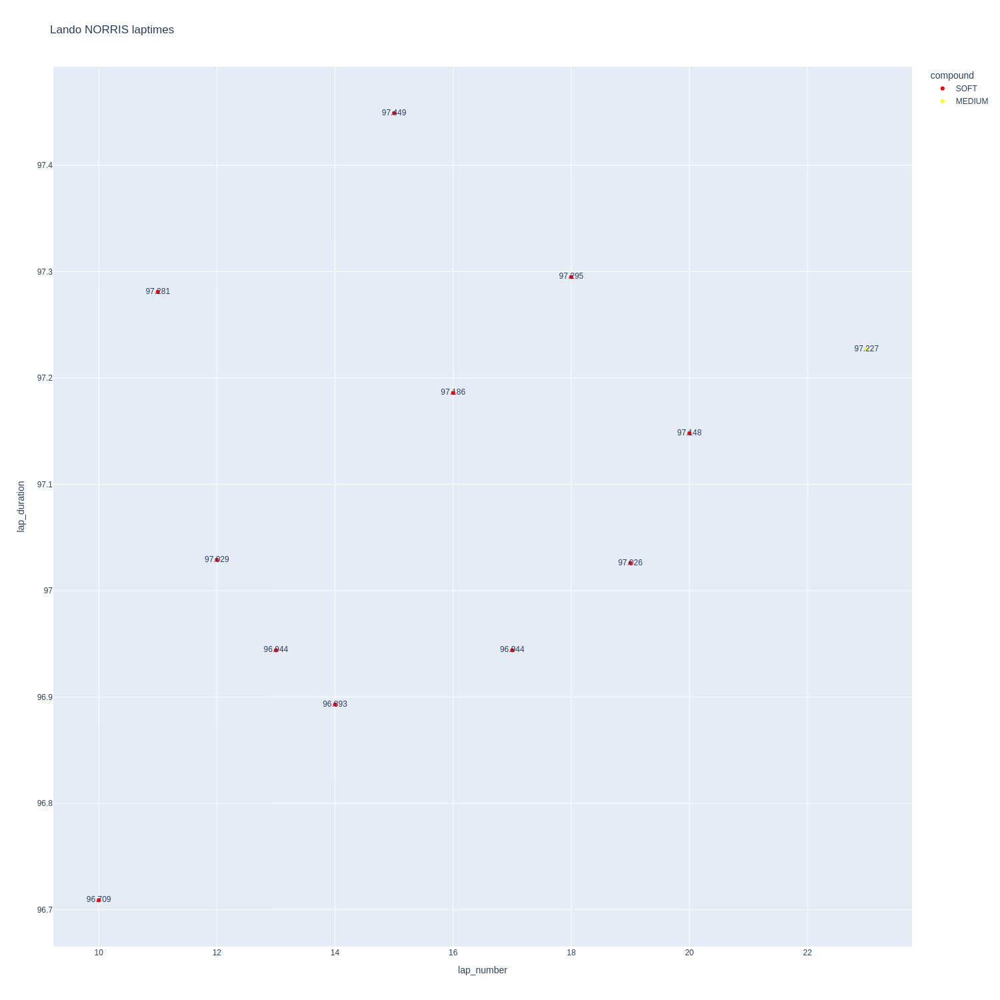

In [53]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

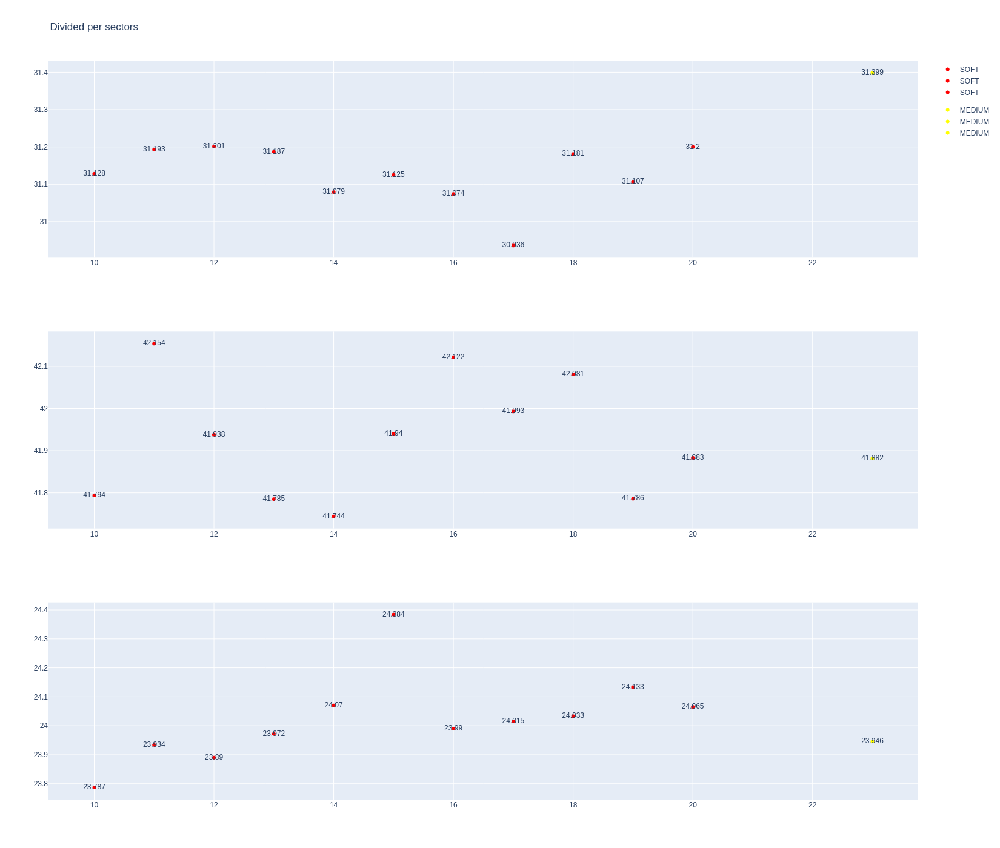

In [54]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [55]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
221,Oscar PIASTRI,SOFT,2024-02-29T15:36:44.990000+00:00,11,31.101,41.417,23.856,96.374
227,Oscar PIASTRI,SOFT,2024-02-29T15:38:21.242000+00:00,12,31.149,41.444,23.594,96.187
236,Oscar PIASTRI,SOFT,2024-02-29T15:39:57.551000+00:00,13,31.097,41.470,23.780,96.347
251,Oscar PIASTRI,SOFT,2024-02-29T15:41:33.865000+00:00,14,31.193,41.864,24.364,97.421
269,Oscar PIASTRI,SOFT,2024-02-29T15:43:11.384000+00:00,15,30.807,41.685,24.035,96.527
287,Oscar PIASTRI,SOFT,2024-02-29T15:44:47.733000+00:00,16,31.029,41.708,24.083,96.820
305,Oscar PIASTRI,SOFT,2024-02-29T15:46:24.580000+00:00,17,31.231,41.735,23.996,96.962
325,Oscar PIASTRI,SOFT,2024-02-29T15:48:01.716000+00:00,18,31.293,41.642,24.029,96.964
345,Oscar PIASTRI,SOFT,2024-02-29T15:49:38.550000+00:00,19,31.223,42.137,24.028,97.388
365,Oscar PIASTRI,SOFT,2024-02-29T15:51:15.995000+00:00,20,31.234,41.869,24.230,97.333


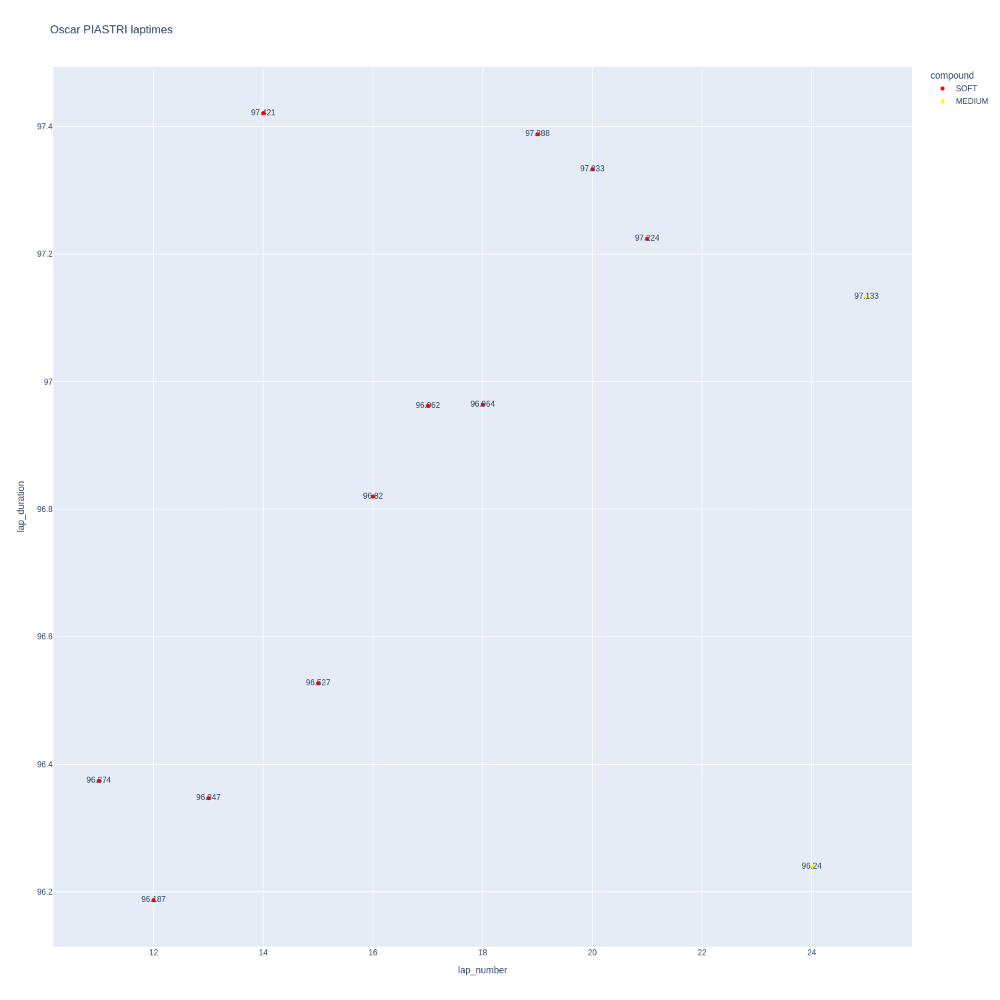

In [56]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

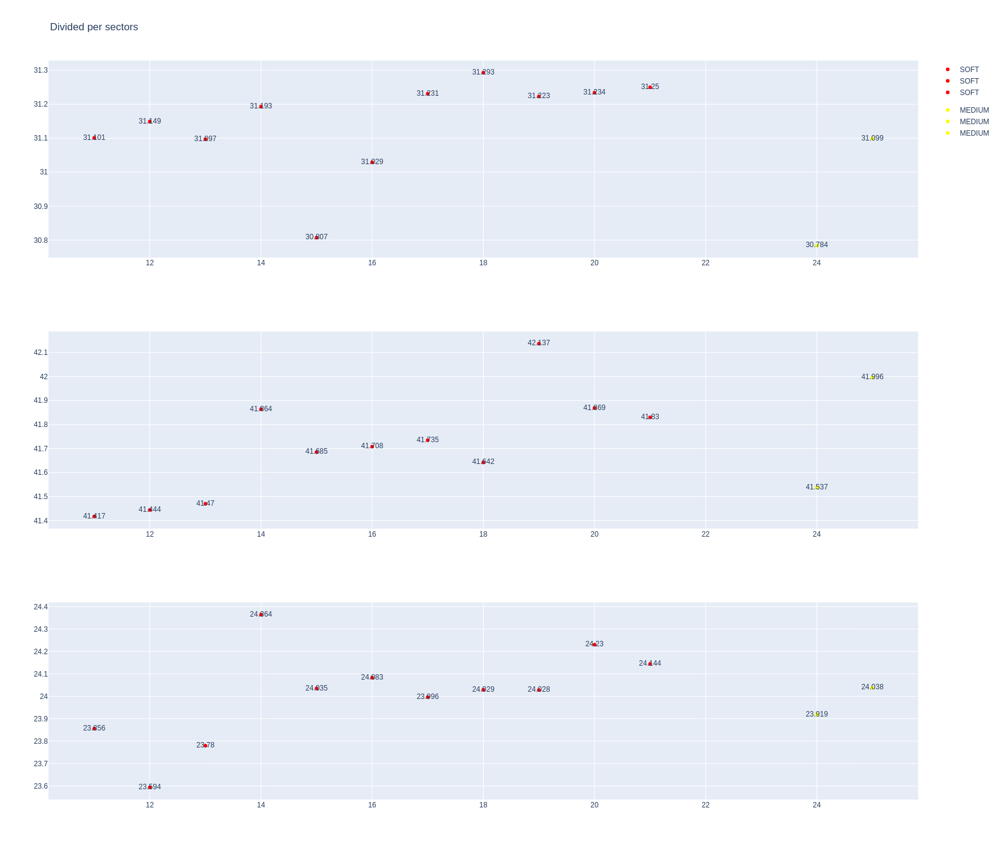

In [57]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [58]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1229,9466,1,14,1,5,SOFT,0
18,1229,9466,1,18,1,9,SOFT,0
26,1229,9466,2,14,6,8,SOFT,4
43,1229,9466,3,14,9,11,SOFT,0
46,1229,9466,2,18,10,13,SOFT,0
59,1229,9466,4,14,12,23,SOFT,3
69,1229,9466,3,18,14,27,SOFT,4


In [59]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
311,Fernando ALONSO,SOFT,2024-02-29T15:46:51.648000+00:00,12,31.057,41.727,24.086,96.870
331,Fernando ALONSO,SOFT,2024-02-29T15:48:28.841000+00:00,13,31.065,41.844,23.956,96.865
351,Fernando ALONSO,SOFT,2024-02-29T15:50:05.431000+00:00,14,31.047,41.869,23.921,96.837
371,Fernando ALONSO,SOFT,2024-02-29T15:51:42.274000+00:00,15,31.150,41.796,24.229,97.175
391,Fernando ALONSO,SOFT,2024-02-29T15:53:19.449000+00:00,16,31.232,41.889,24.095,97.216
411,Fernando ALONSO,SOFT,2024-02-29T15:54:56.622000+00:00,17,31.289,42.102,24.214,97.605
431,Fernando ALONSO,SOFT,2024-02-29T15:56:34.302000+00:00,18,31.238,42.199,24.211,97.648
449,Fernando ALONSO,SOFT,2024-02-29T15:58:11.795000+00:00,19,31.305,42.053,24.206,97.564
469,Fernando ALONSO,SOFT,2024-02-29T15:59:49.424000+00:00,20,31.454,42.132,24.262,97.848


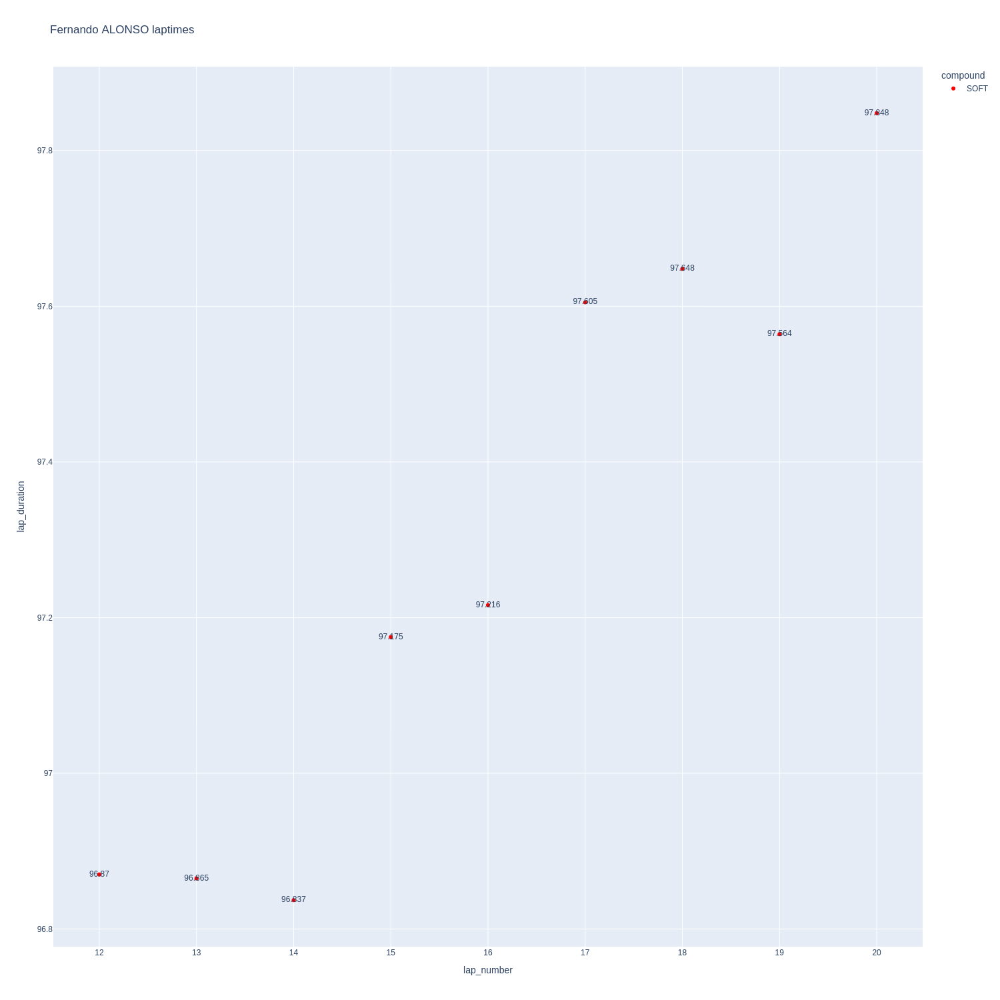

In [60]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

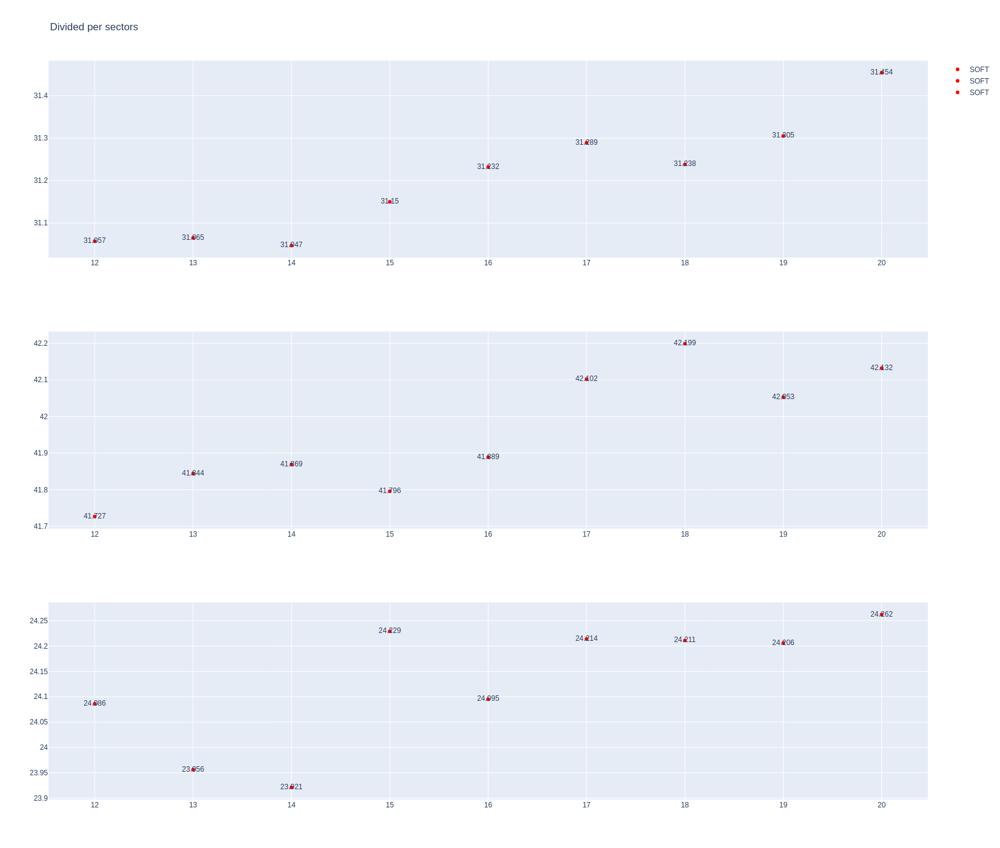

In [61]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [62]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
260,Lance STROLL,SOFT,2024-02-29T15:42:34.687000+00:00,14,31.074,41.963,24.039,97.076
278,Lance STROLL,SOFT,2024-02-29T15:44:11.722000+00:00,15,31.163,42.252,23.976,97.391
298,Lance STROLL,SOFT,2024-02-29T15:45:49.215000+00:00,16,31.122,42.104,23.953,97.179
318,Lance STROLL,SOFT,2024-02-29T15:47:26.289000+00:00,17,31.175,42.027,23.991,97.193
338,Lance STROLL,SOFT,2024-02-29T15:49:03.545000+00:00,18,31.185,42.177,24.388,97.750
358,Lance STROLL,SOFT,2024-02-29T15:50:41.235000+00:00,19,31.410,42.169,24.378,97.957
378,Lance STROLL,SOFT,2024-02-29T15:52:19.229000+00:00,20,31.366,42.250,24.278,97.894
398,Lance STROLL,SOFT,2024-02-29T15:53:57.098000+00:00,21,31.396,42.056,24.272,97.724
418,Lance STROLL,SOFT,2024-02-29T15:55:34.832000+00:00,22,31.488,42.191,24.196,97.875
438,Lance STROLL,SOFT,2024-02-29T15:57:12.961000+00:00,23,31.405,42.570,24.359,98.334


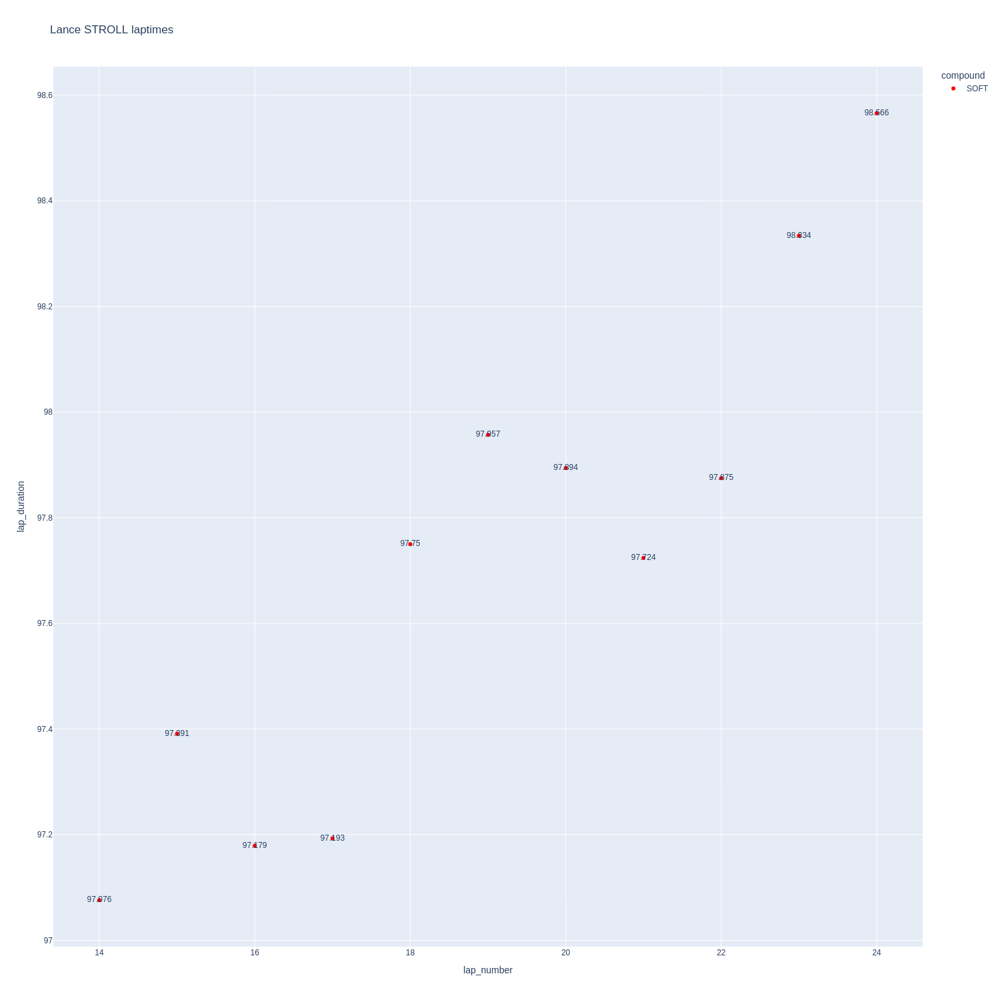

In [63]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

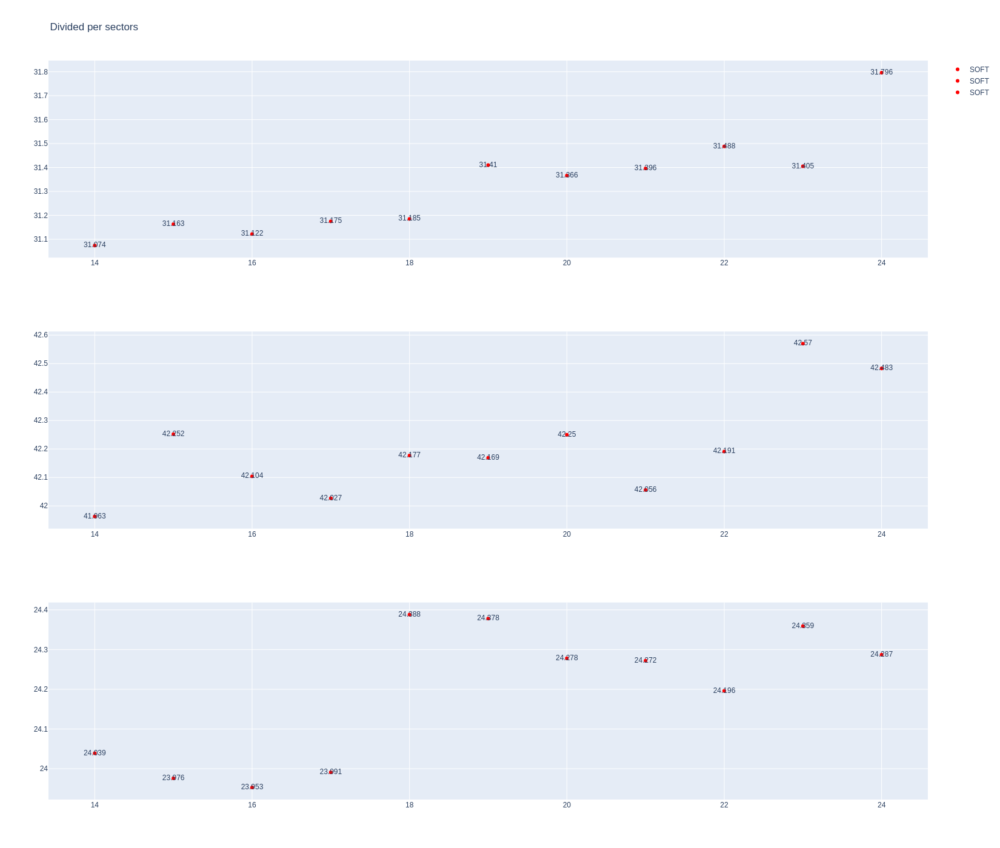

In [64]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [65]:
stintInformation.query('driver_number == 3 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1229,9466,1,3,1,6,MEDIUM,0
19,1229,9466,1,22,1,9,MEDIUM,0
30,1229,9466,2,3,7,12,SOFT,0
47,1229,9466,2,22,10,15,SOFT,0
63,1229,9466,3,3,13,27,SOFT,6
73,1229,9466,3,22,16,30,SOFT,6


In [66]:
data = libraryDataF1.getinfolongruns(jointables2,3,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
243,Daniel RICCIARDO,SOFT,2024-02-29T15:40:40.709000+00:00,13,31.018,42.113,24.082,97.213
257,Daniel RICCIARDO,SOFT,2024-02-29T15:42:17.835000+00:00,14,31.093,42.173,24.080,97.346
275,Daniel RICCIARDO,SOFT,2024-02-29T15:43:55.245000+00:00,15,31.187,41.984,24.124,97.295
295,Daniel RICCIARDO,SOFT,2024-02-29T15:45:32.728000+00:00,16,31.066,42.077,24.298,97.441
315,Daniel RICCIARDO,SOFT,2024-02-29T15:47:09.898000+00:00,17,31.101,41.982,23.974,97.057
335,Daniel RICCIARDO,SOFT,2024-02-29T15:48:47.049000+00:00,18,31.269,42.299,24.098,97.666
355,Daniel RICCIARDO,SOFT,2024-02-29T15:50:24.586000+00:00,19,31.334,42.256,24.321,97.911
375,Daniel RICCIARDO,SOFT,2024-02-29T15:52:02.558000+00:00,20,31.407,42.283,24.222,97.912
395,Daniel RICCIARDO,SOFT,2024-02-29T15:53:40.493000+00:00,21,31.268,42.535,24.164,97.967
415,Daniel RICCIARDO,SOFT,2024-02-29T15:55:18.422000+00:00,22,31.356,42.399,24.210,97.965


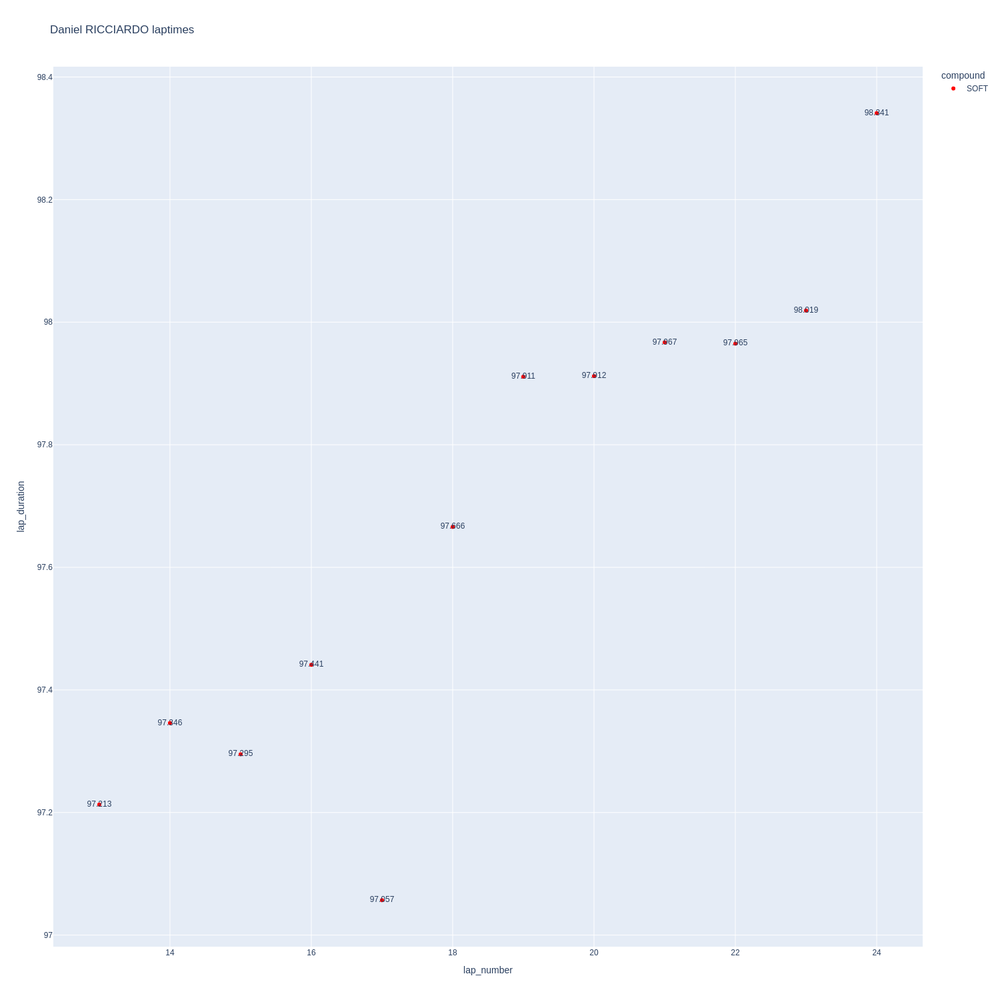

In [67]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

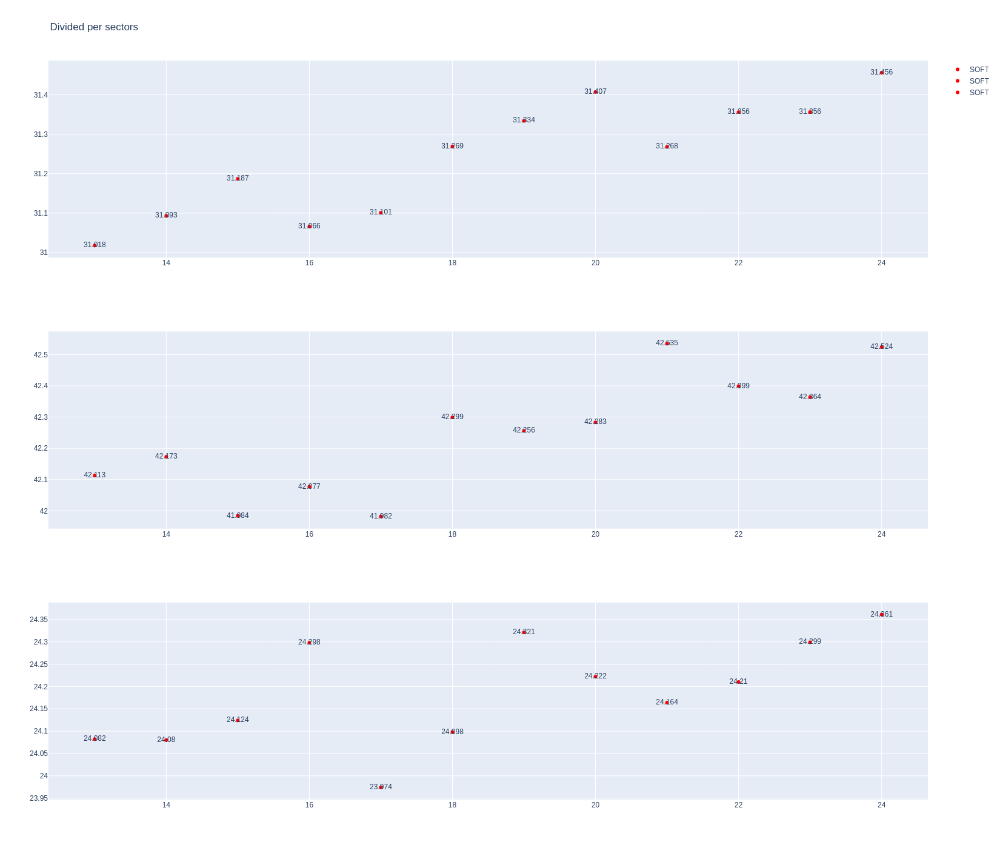

In [68]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [69]:
data = libraryDataF1.getinfolongruns(jointables2,22,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
248,Yuki TSUNODA,SOFT,2024-02-29T15:41:12.321000+00:00,16,31.083,41.770,24.022,96.875
283,Yuki TSUNODA,SOFT,2024-02-29T15:44:29.295000+00:00,18,31.179,42.090,24.202,97.471
302,Yuki TSUNODA,SOFT,2024-02-29T15:46:06.897000+00:00,19,31.490,42.118,24.231,97.839
322,Yuki TSUNODA,SOFT,2024-02-29T15:47:44.727000+00:00,20,31.429,42.147,24.222,97.798
342,Yuki TSUNODA,SOFT,2024-02-29T15:49:22.485000+00:00,21,31.508,42.399,24.593,98.500
362,Yuki TSUNODA,SOFT,2024-02-29T15:51:01.027000+00:00,22,31.535,42.491,24.430,98.456
382,Yuki TSUNODA,SOFT,2024-02-29T15:52:39.404000+00:00,23,31.496,42.440,24.447,98.383
402,Yuki TSUNODA,SOFT,2024-02-29T15:54:17.855000+00:00,24,31.531,42.622,24.402,98.555
443,Yuki TSUNODA,SOFT,2024-02-29T15:57:36.209000+00:00,26,31.522,42.602,24.458,98.582
463,Yuki TSUNODA,SOFT,2024-02-29T15:59:14.889000+00:00,27,31.520,42.786,24.449,98.755


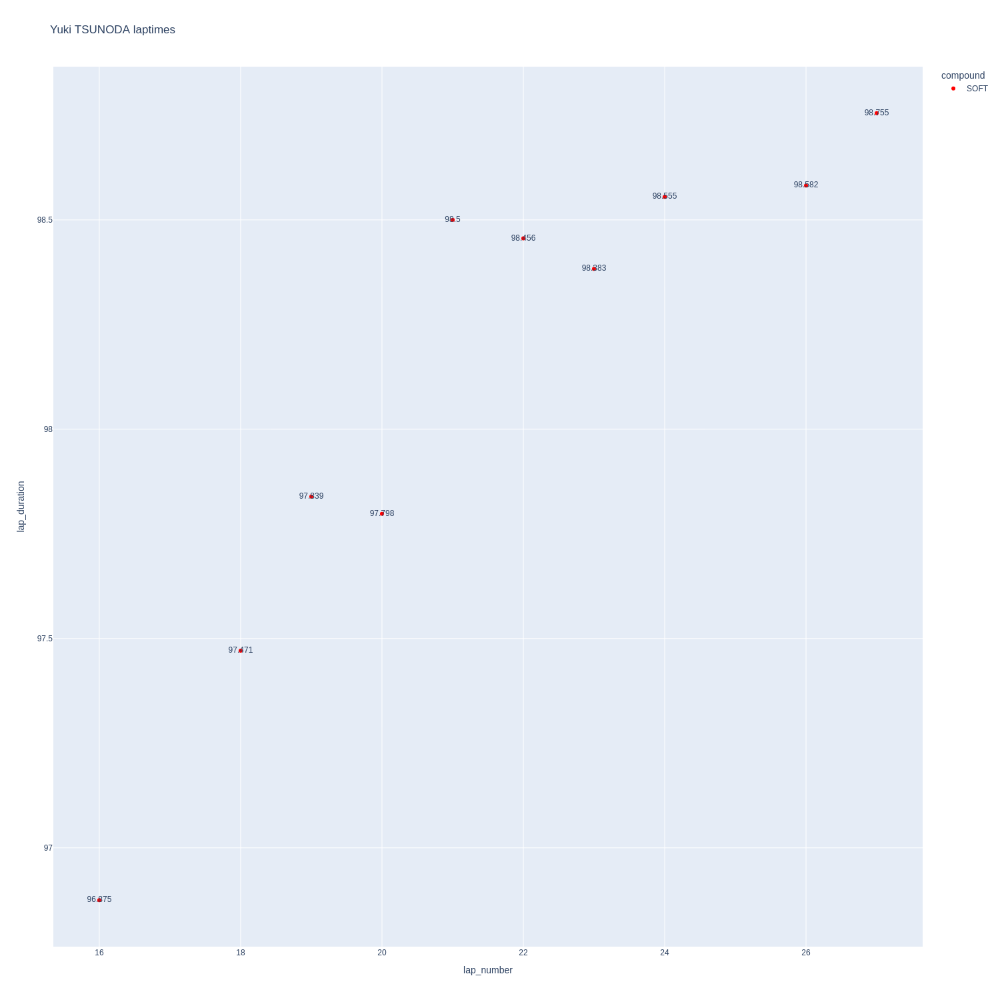

In [70]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

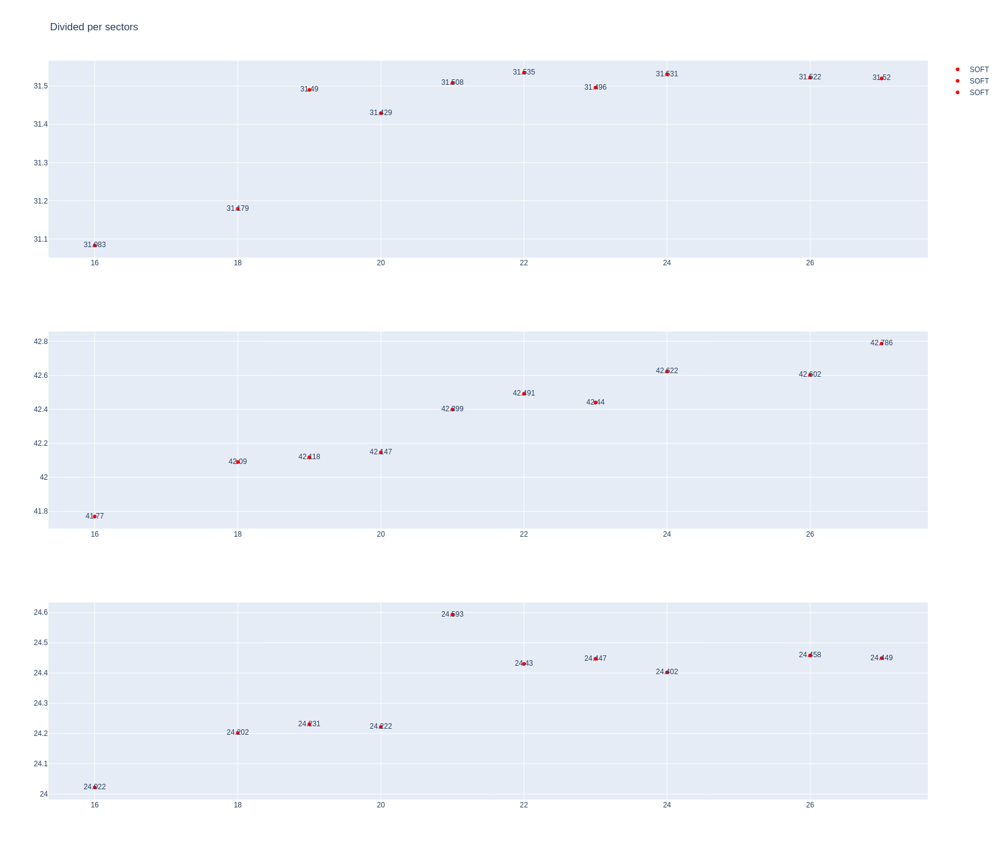

In [71]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [72]:
stintInformation.query('driver_number == 20 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
13,1229,9466,1,20,1,7,SOFT,0
15,1229,9466,1,27,1,7,SOFT,0
34,1229,9466,2,27,8,10,SOFT,0
41,1229,9466,2,20,8,13,SOFT,0
53,1229,9466,3,27,11,24,SOFT,3
70,1229,9466,3,20,14,28,SOFT,6


In [73]:
data = libraryDataF1.getinfolongruns(jointables2,20,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
245,Kevin MAGNUSSEN,SOFT,2024-02-29T15:40:57.250000+00:00,14,31.441,42.963,24.447,98.851
261,Kevin MAGNUSSEN,SOFT,2024-02-29T15:42:36.147000+00:00,15,31.428,42.633,24.324,98.385
279,Kevin MAGNUSSEN,SOFT,2024-02-29T15:44:16.027000+00:00,16,31.147,42.414,24.234,97.795
299,Kevin MAGNUSSEN,SOFT,2024-02-29T15:45:52.353000+00:00,17,31.234,42.095,24.316,97.645
319,Kevin MAGNUSSEN,SOFT,2024-02-29T15:47:29.927000+00:00,18,31.278,41.918,24.225,97.421
339,Kevin MAGNUSSEN,SOFT,2024-02-29T15:49:07.299000+00:00,19,31.174,42.387,24.380,97.941
359,Kevin MAGNUSSEN,SOFT,2024-02-29T15:50:45.312000+00:00,20,31.181,42.217,24.311,97.709
379,Kevin MAGNUSSEN,SOFT,2024-02-29T15:52:23.063000+00:00,21,31.389,42.252,24.530,98.171
399,Kevin MAGNUSSEN,SOFT,2024-02-29T15:54:01.066000+00:00,22,31.373,42.352,24.434,98.159
419,Kevin MAGNUSSEN,SOFT,2024-02-29T15:55:39.425000+00:00,23,31.592,42.426,24.415,98.433


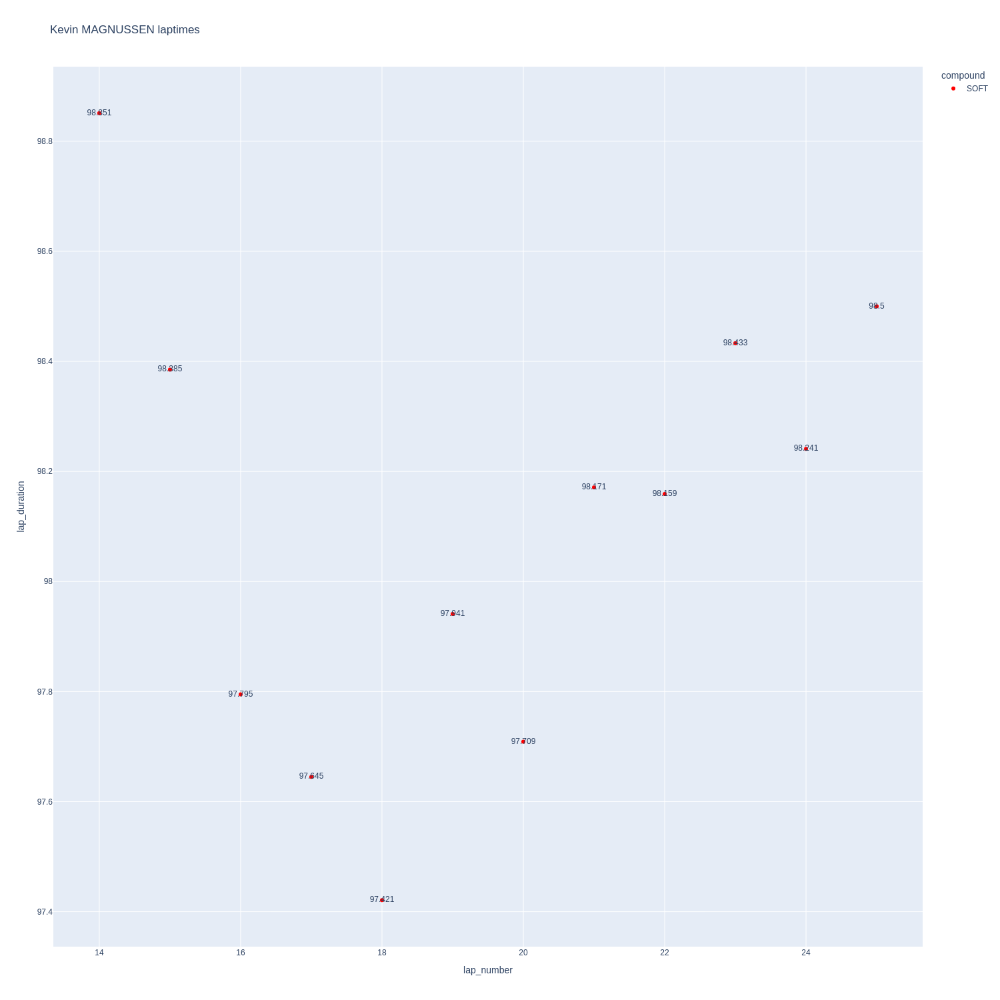

In [74]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

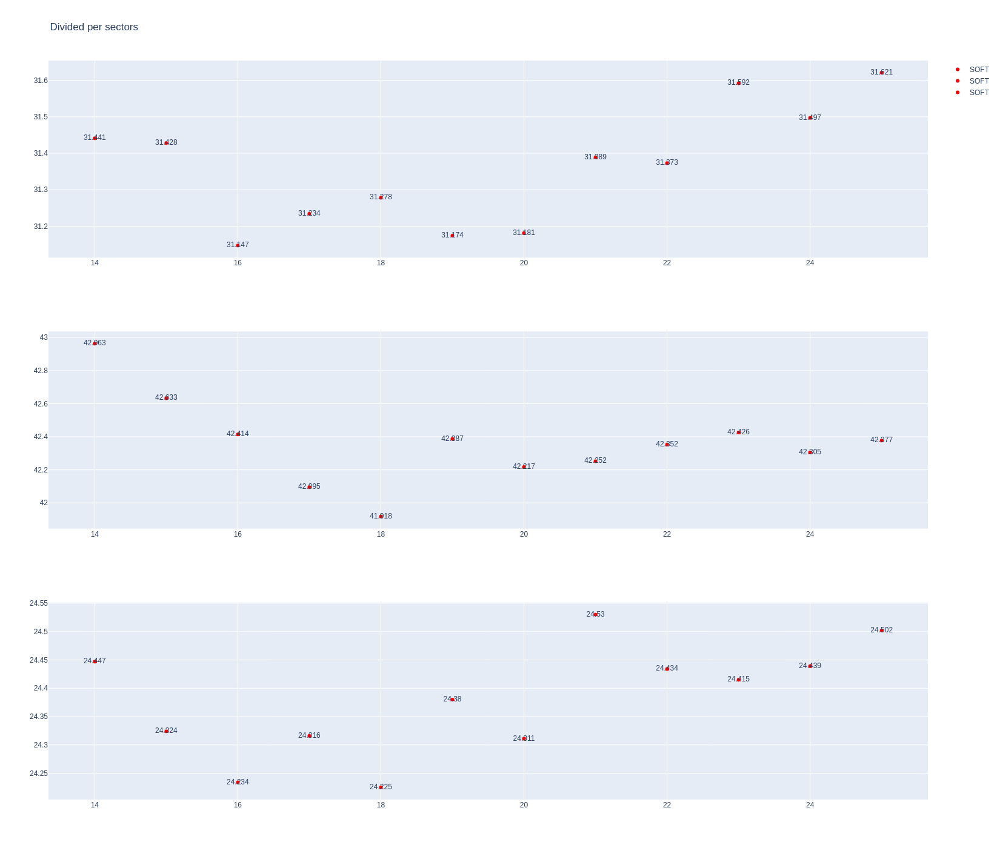

In [75]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [76]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
256,Nico HULKENBERG,SOFT,2024-02-29T15:42:09.346000+00:00,11,30.972,41.897,24.139,97.008
274,Nico HULKENBERG,SOFT,2024-02-29T15:43:46.282000+00:00,12,31.018,41.938,24.072,97.028
294,Nico HULKENBERG,SOFT,2024-02-29T15:45:23.372000+00:00,13,31.101,41.799,24.241,97.141
314,Nico HULKENBERG,SOFT,2024-02-29T15:47:00.478000+00:00,14,31.252,42.258,24.116,97.626
334,Nico HULKENBERG,SOFT,2024-02-29T15:48:38.188000+00:00,15,31.375,42.276,24.150,97.801
354,Nico HULKENBERG,SOFT,2024-02-29T15:50:15.893000+00:00,16,31.235,42.396,24.314,97.945
374,Nico HULKENBERG,SOFT,2024-02-29T15:51:53.928000+00:00,17,31.380,42.268,24.313,97.961
394,Nico HULKENBERG,SOFT,2024-02-29T15:53:31.806000+00:00,18,31.445,42.328,24.286,98.059
414,Nico HULKENBERG,SOFT,2024-02-29T15:55:09.840000+00:00,19,31.499,42.348,24.375,98.222
433,Nico HULKENBERG,SOFT,2024-02-29T15:56:48.139000+00:00,20,31.362,42.469,24.378,98.209


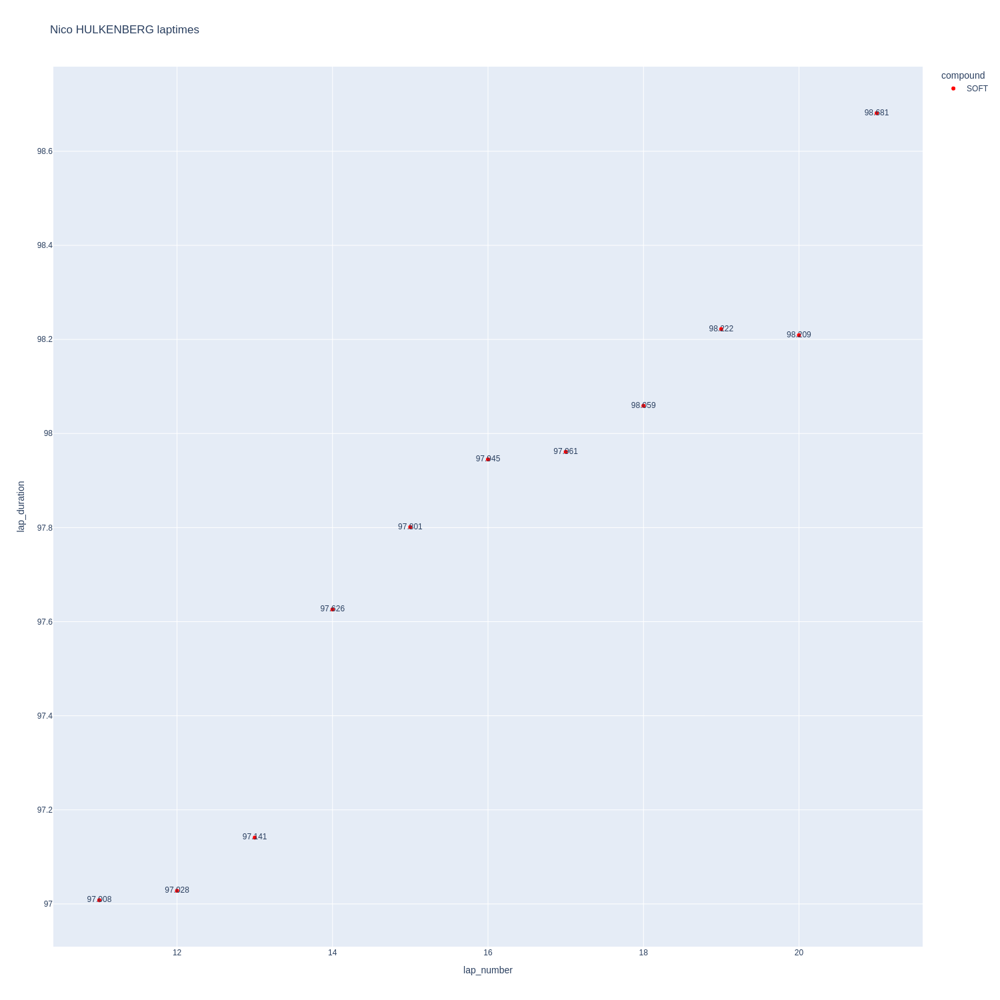

In [77]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

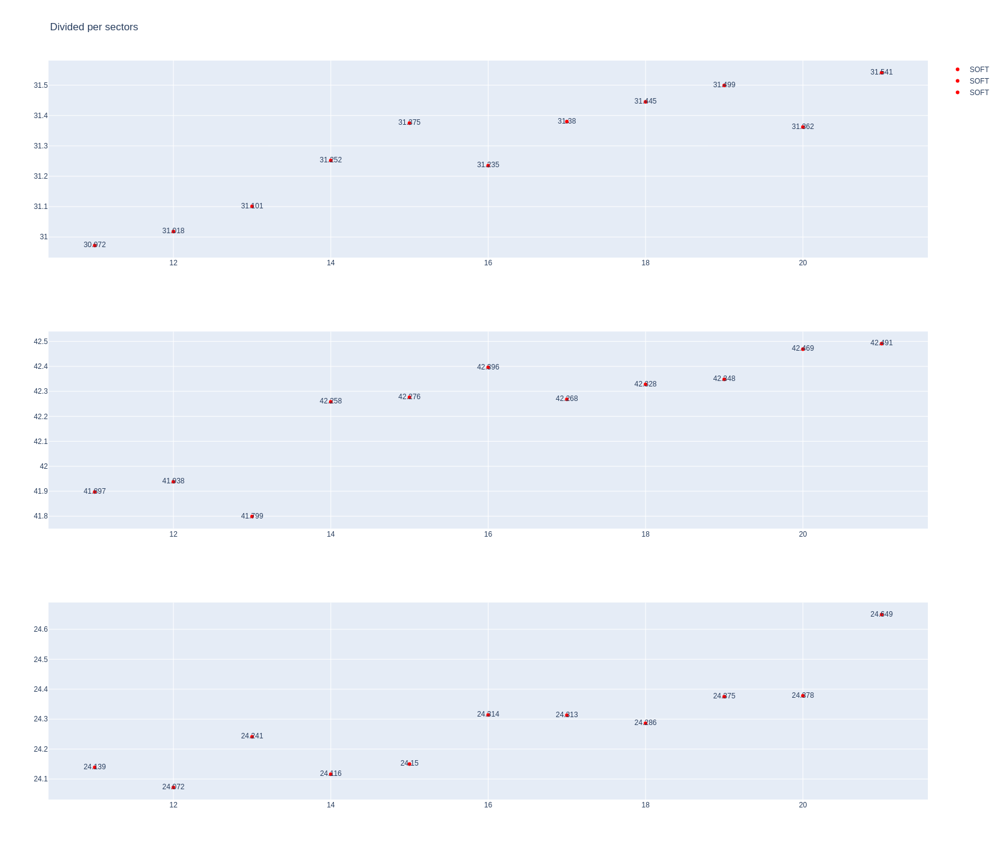

In [78]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [79]:
stintInformation.query('driver_number == 10 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1229,9466,1,10,1,7,SOFT,0
16,1229,9466,1,31,1,7,SOFT,0
39,1229,9466,2,10,8,13,SOFT,0
42,1229,9466,2,31,8,13,SOFT,0
64,1229,9466,3,10,14,14,SOFT,6
67,1229,9466,3,31,14,26,SOFT,6
71,1229,9466,4,10,15,26,SOFT,7


In [80]:
data =libraryDataF1.getinfolongruns(jointables2,31,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
272,Esteban OCON,SOFT,2024-02-29T15:43:40.207000+00:00,14,31.398,41.977,24.184,97.559
292,Esteban OCON,SOFT,2024-02-29T15:45:17.741000+00:00,15,31.432,41.940,24.184,97.556
312,Esteban OCON,SOFT,2024-02-29T15:46:55.275000+00:00,16,31.519,42.022,24.153,97.694
332,Esteban OCON,SOFT,2024-02-29T15:48:33.078000+00:00,17,31.772,42.267,24.149,98.188
353,Esteban OCON,SOFT,2024-02-29T15:50:11.460000+00:00,18,31.171,42.570,24.366,98.107
373,Esteban OCON,SOFT,2024-02-29T15:51:49.347000+00:00,19,31.633,42.219,24.414,98.266
393,Esteban OCON,SOFT,2024-02-29T15:53:27.648000+00:00,20,31.590,42.217,24.401,98.208
413,Esteban OCON,SOFT,2024-02-29T15:55:05.777000+00:00,21,31.681,42.267,24.490,98.438
451,Esteban OCON,SOFT,2024-02-29T15:58:23.289000+00:00,23,31.774,42.416,24.385,98.575


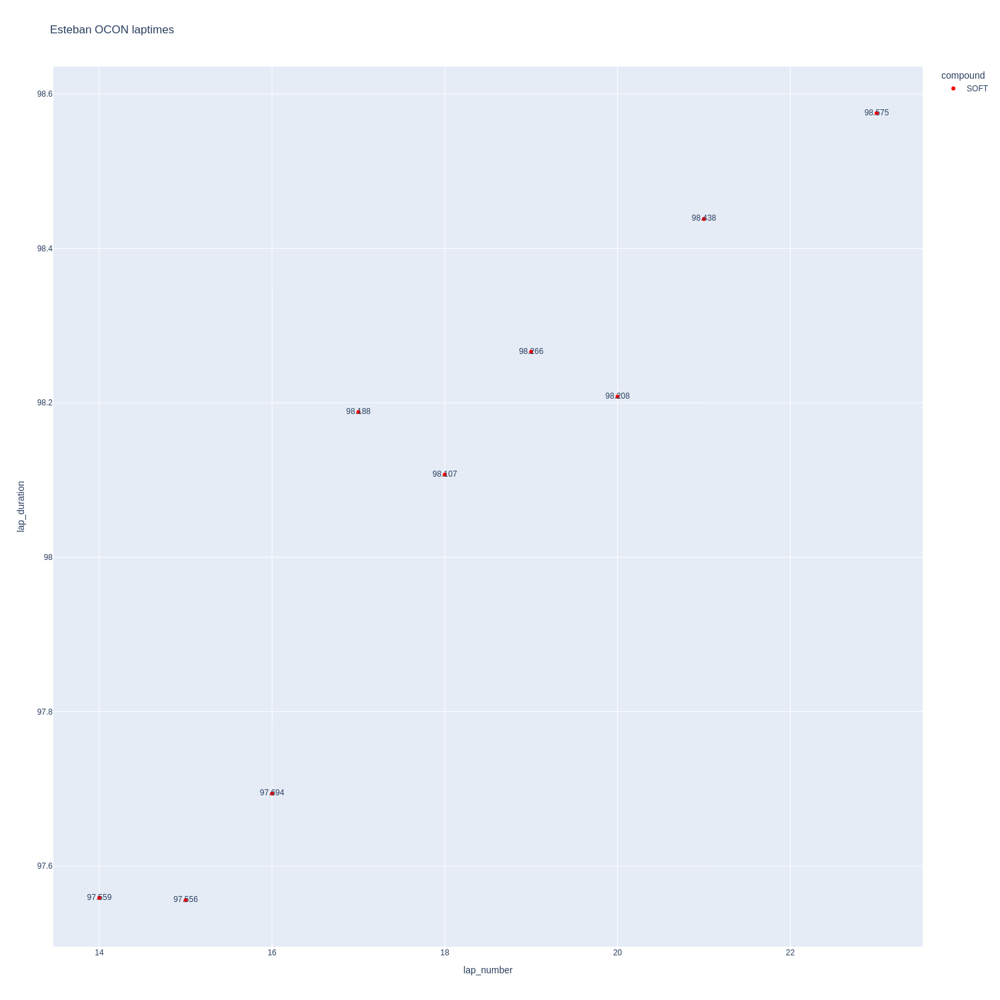

In [81]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

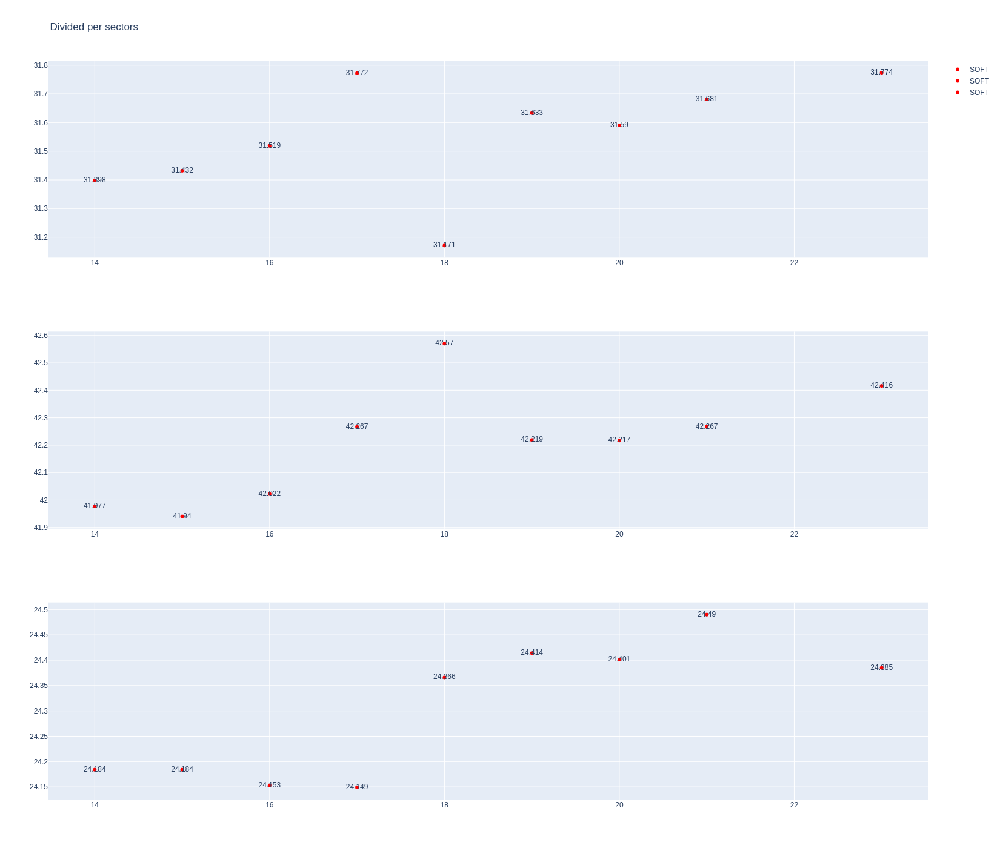

In [82]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [83]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
309,Pierre GASLY,SOFT,2024-02-29T15:46:38.429000+00:00,15,31.446,41.972,24.034,97.452
329,Pierre GASLY,SOFT,2024-02-29T15:48:15.815000+00:00,16,31.607,41.977,24.014,97.598
349,Pierre GASLY,SOFT,2024-02-29T15:49:53.661000+00:00,17,31.511,42.051,24.057,97.619
369,Pierre GASLY,SOFT,2024-02-29T15:51:31+00:00,18,31.523,42.179,24.255,97.957
389,Pierre GASLY,SOFT,2024-02-29T15:53:09.082000+00:00,19,31.537,42.120,25.199,98.856
409,Pierre GASLY,SOFT,2024-02-29T15:54:47.970000+00:00,20,31.864,42.085,24.285,98.234
428,Pierre GASLY,SOFT,2024-02-29T15:56:26.083000+00:00,21,31.645,42.225,24.212,98.082
446,Pierre GASLY,SOFT,2024-02-29T15:58:04.153000+00:00,22,31.658,42.282,24.312,98.252
466,Pierre GASLY,SOFT,2024-02-29T15:59:42.419000+00:00,23,31.688,42.232,24.193,98.113


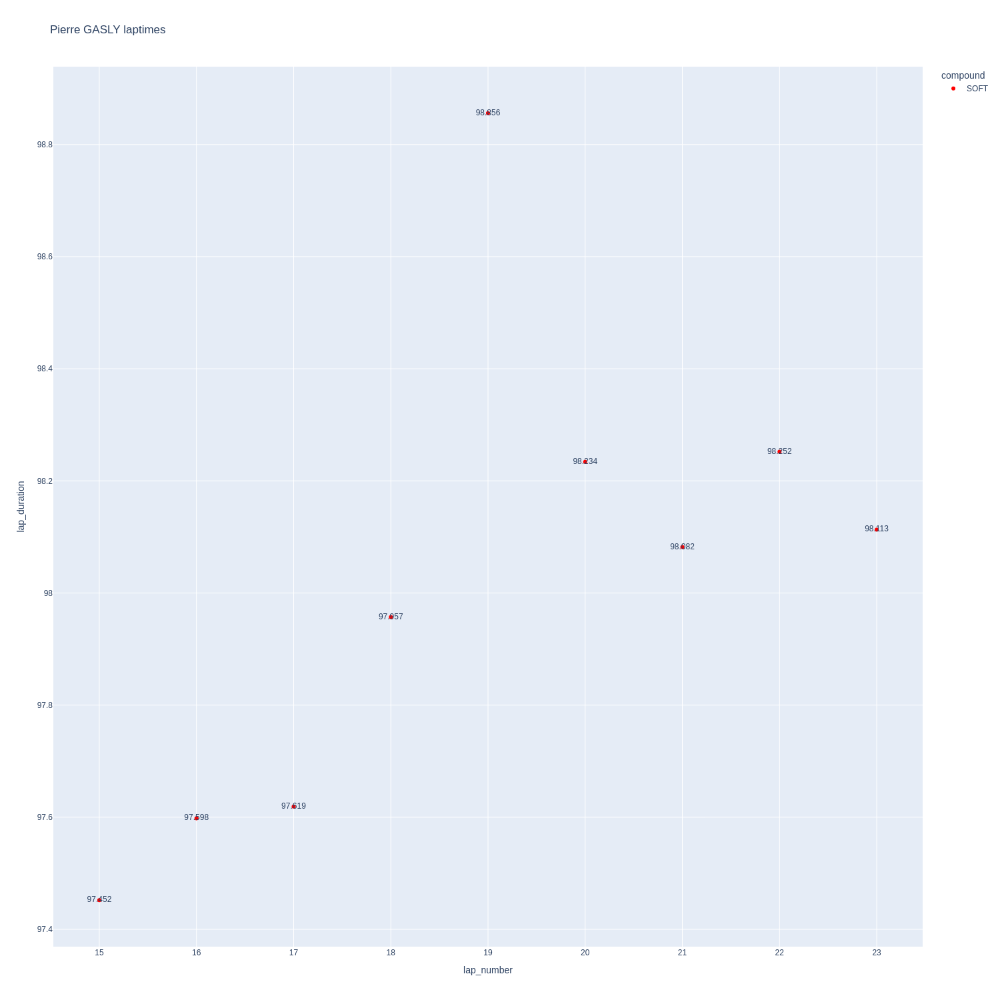

In [84]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

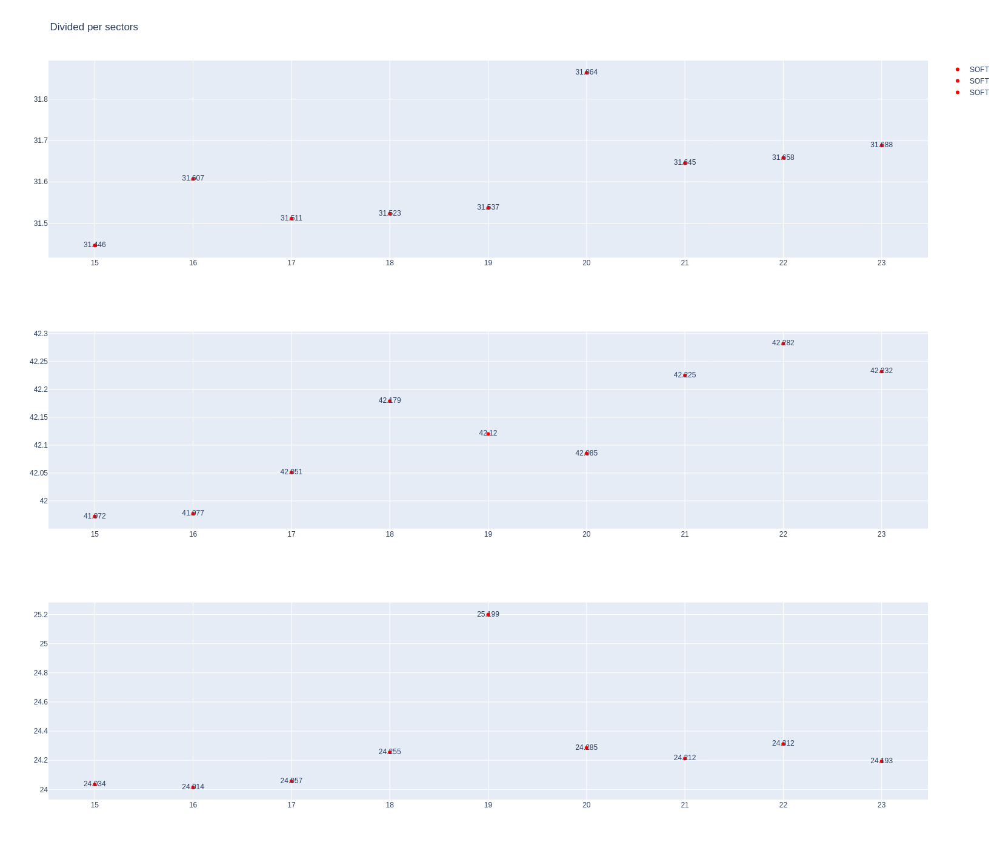

In [85]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [86]:
stintInformation.query('driver_number == 2 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1229,9466,1,23,1,4,MEDIUM,0
7,1229,9466,1,2,1,6,MEDIUM,0
25,1229,9466,2,23,5,10,SOFT,0
28,1229,9466,2,2,7,9,SOFT,0
45,1229,9466,3,2,10,12,SOFT,0
50,1229,9466,3,23,11,13,SOFT,0
60,1229,9466,4,2,13,16,SOFT,0
66,1229,9466,4,23,14,24,SOFT,6
74,1229,9466,5,2,17,17,SOFT,6
75,1229,9466,6,2,18,28,SOFT,0


In [87]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
252,Alexander ALBON,SOFT,2024-02-29T15:41:38.027000+00:00,14,31.354,42.038,24.028,97.420
270,Alexander ALBON,SOFT,2024-02-29T15:43:15.405000+00:00,15,31.407,42.279,24.061,97.747
289,Alexander ALBON,SOFT,2024-02-29T15:44:53.025000+00:00,16,31.458,42.261,24.133,97.852
307,Alexander ALBON,SOFT,2024-02-29T15:46:30.999000+00:00,17,31.609,42.406,24.065,98.080
327,Alexander ALBON,SOFT,2024-02-29T15:48:09.038000+00:00,18,31.417,42.407,24.129,97.953
347,Alexander ALBON,SOFT,2024-02-29T15:49:46.996000+00:00,19,31.471,42.459,24.099,98.029
387,Alexander ALBON,SOFT,2024-02-29T15:53:05.073000+00:00,21,31.485,42.419,24.266,98.170
407,Alexander ALBON,SOFT,2024-02-29T15:54:43.216000+00:00,22,31.658,42.437,24.235,98.330


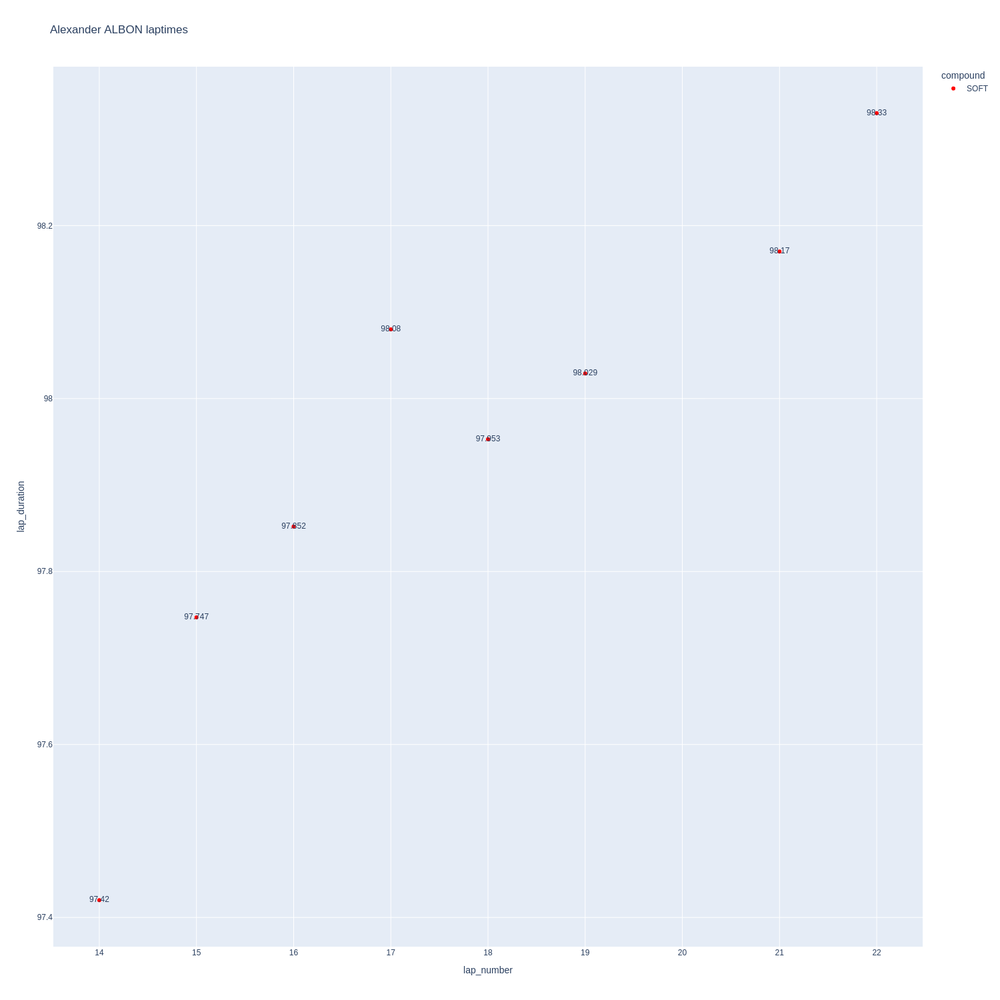

In [88]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

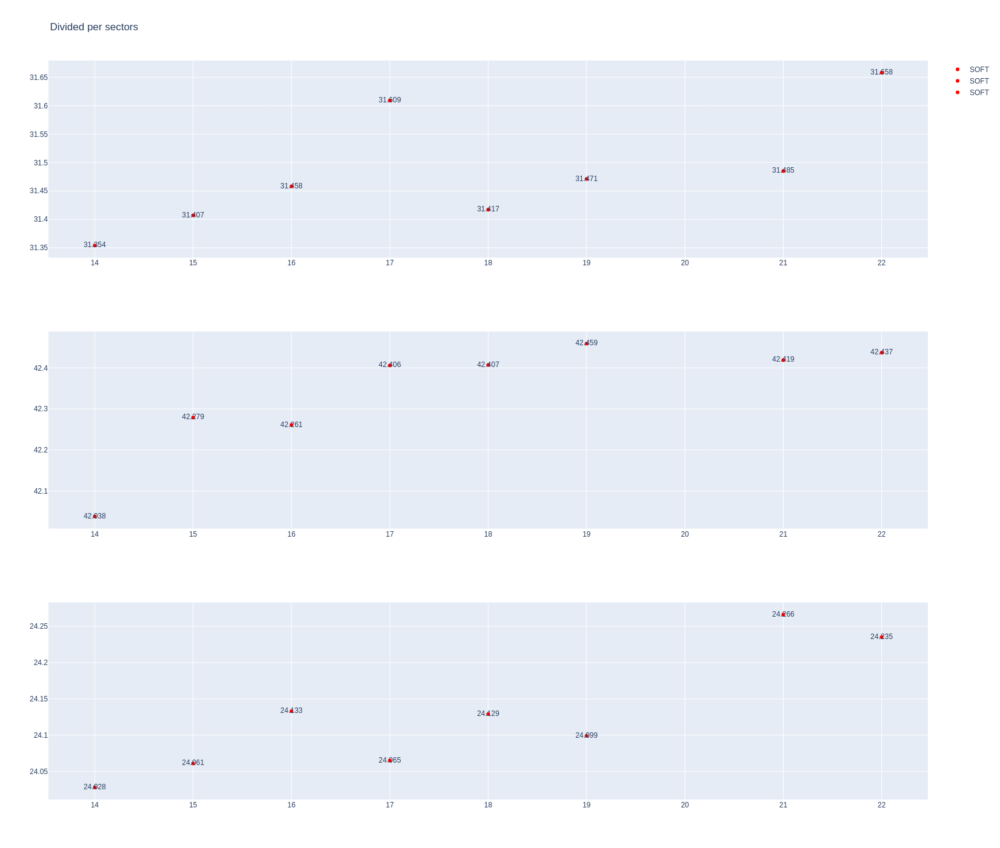

In [89]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [90]:
data= libraryDataF1.getinfolongruns(jointables2,2,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
330,Logan SARGEANT,SOFT,2024-02-29T15:48:24.831000+00:00,18,31.026,41.598,23.744,96.368
350,Logan SARGEANT,SOFT,2024-02-29T15:50:01.135000+00:00,19,31.195,41.861,23.971,97.027
370,Logan SARGEANT,SOFT,2024-02-29T15:51:38.062000+00:00,20,31.112,41.881,24.089,97.082
390,Logan SARGEANT,SOFT,2024-02-29T15:53:15.181000+00:00,21,31.151,41.871,23.961,96.983
410,Logan SARGEANT,SOFT,2024-02-29T15:54:52.236000+00:00,22,31.201,41.874,24.056,97.131
429,Logan SARGEANT,SOFT,2024-02-29T15:56:29.278000+00:00,23,31.256,42.469,24.261,97.986
447,Logan SARGEANT,SOFT,2024-02-29T15:58:07.326000+00:00,24,31.614,42.460,24.095,98.169
468,Logan SARGEANT,SOFT,2024-02-29T15:59:45.434000+00:00,25,31.471,42.474,24.231,98.176


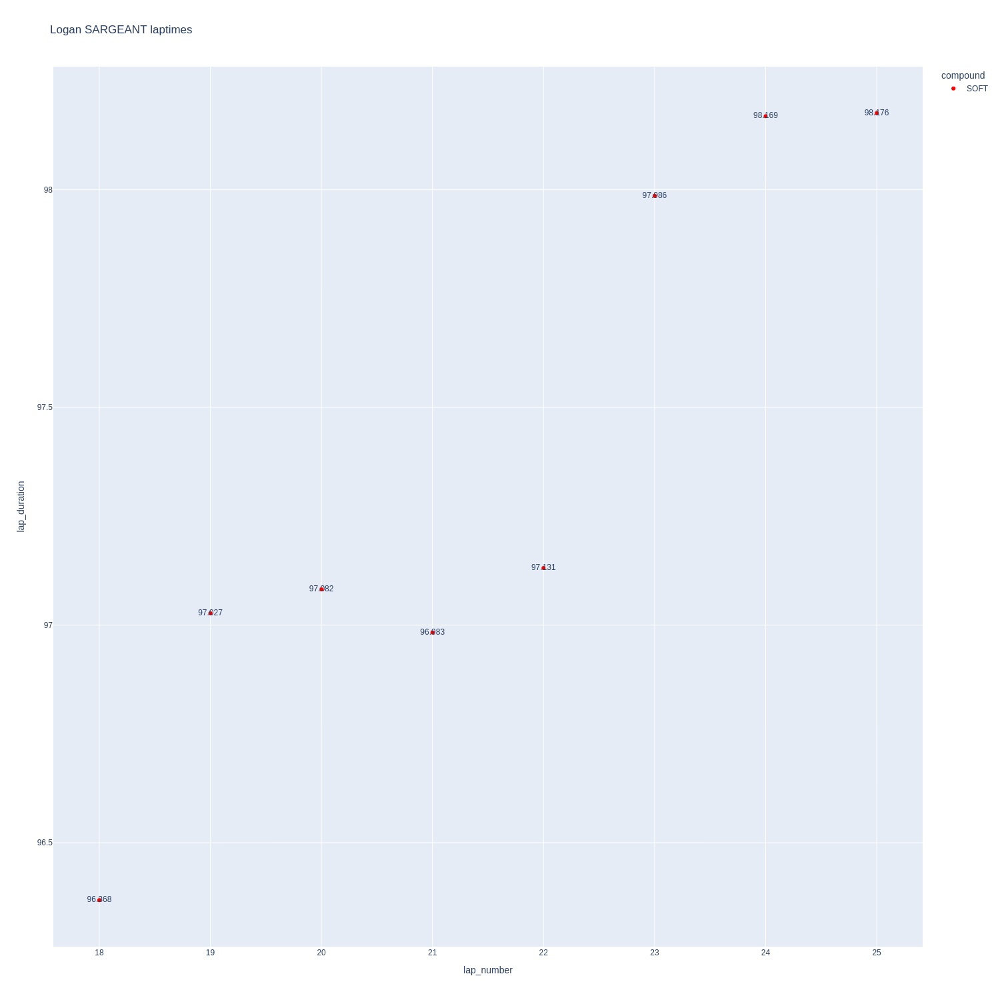

In [91]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

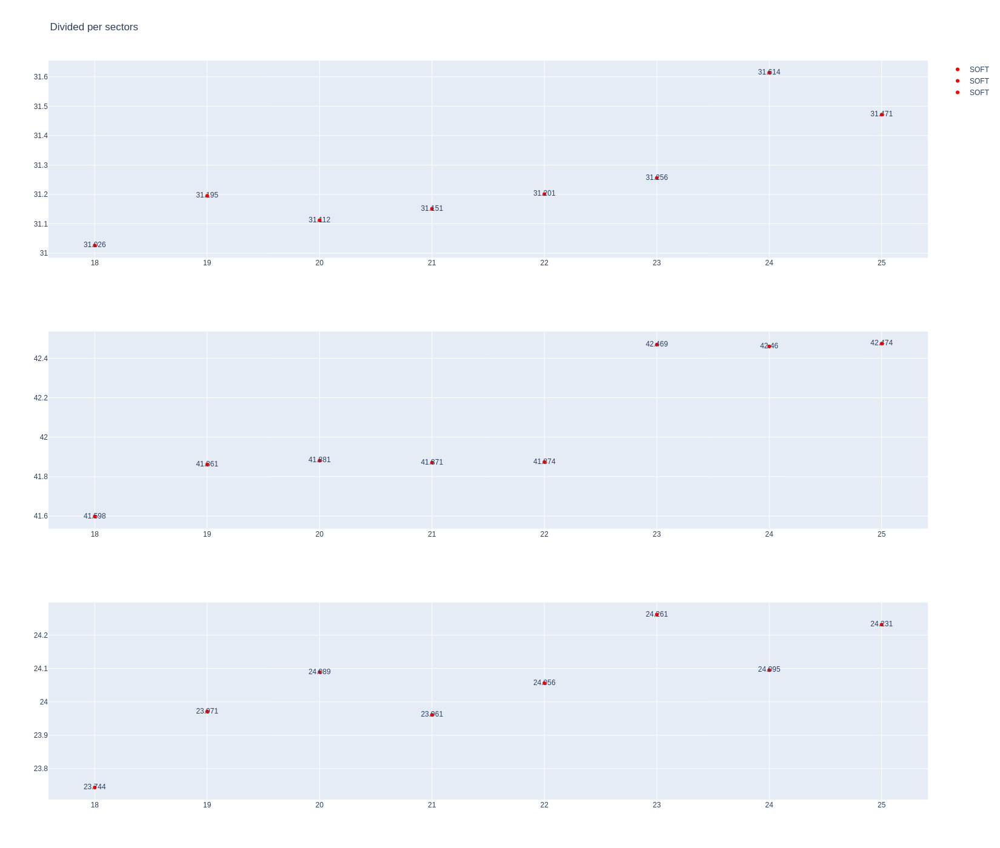

In [92]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [93]:
stintInformation.query('driver_number == 24 or driver_number == 77')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1229,9466,1,77,1,4,MEDIUM,0
14,1229,9466,1,24,1,7,MEDIUM,0
24,1229,9466,2,77,5,8,SOFT,0
33,1229,9466,2,24,8,10,SOFT,0
44,1229,9466,3,77,9,11,SOFT,0
51,1229,9466,3,24,11,13,SOFT,3
58,1229,9466,4,77,12,12,MEDIUM,5
61,1229,9466,5,77,13,25,SOFT,6
65,1229,9466,4,24,14,14,MEDIUM,6
72,1229,9466,5,24,15,29,SOFT,6


In [94]:
data = libraryDataF1.getinfolongruns(jointables2,24,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
250,ZHOU Guanyu,SOFT,2024-02-29T15:41:32.678000+00:00,15,31.562,42.336,24.125,98.023
288,ZHOU Guanyu,SOFT,2024-02-29T15:44:49.858000+00:00,17,31.479,42.485,24.177,98.141
306,ZHOU Guanyu,SOFT,2024-02-29T15:46:28.005000+00:00,18,31.597,42.714,24.116,98.427
326,ZHOU Guanyu,SOFT,2024-02-29T15:48:06.431000+00:00,19,31.482,42.468,24.000,97.950
346,ZHOU Guanyu,SOFT,2024-02-29T15:49:44.440000+00:00,20,31.413,42.489,24.017,97.919
366,ZHOU Guanyu,SOFT,2024-02-29T15:51:22.313000+00:00,21,31.472,42.483,24.054,98.009
386,ZHOU Guanyu,SOFT,2024-02-29T15:53:00.553000+00:00,22,31.842,42.781,24.268,98.891
406,ZHOU Guanyu,SOFT,2024-02-29T15:54:39.143000+00:00,23,31.753,42.689,24.237,98.679
425,ZHOU Guanyu,SOFT,2024-02-29T15:56:17.795000+00:00,24,31.732,42.640,24.267,98.639
445,ZHOU Guanyu,SOFT,2024-02-29T15:57:56.431000+00:00,25,31.711,42.712,24.362,98.785


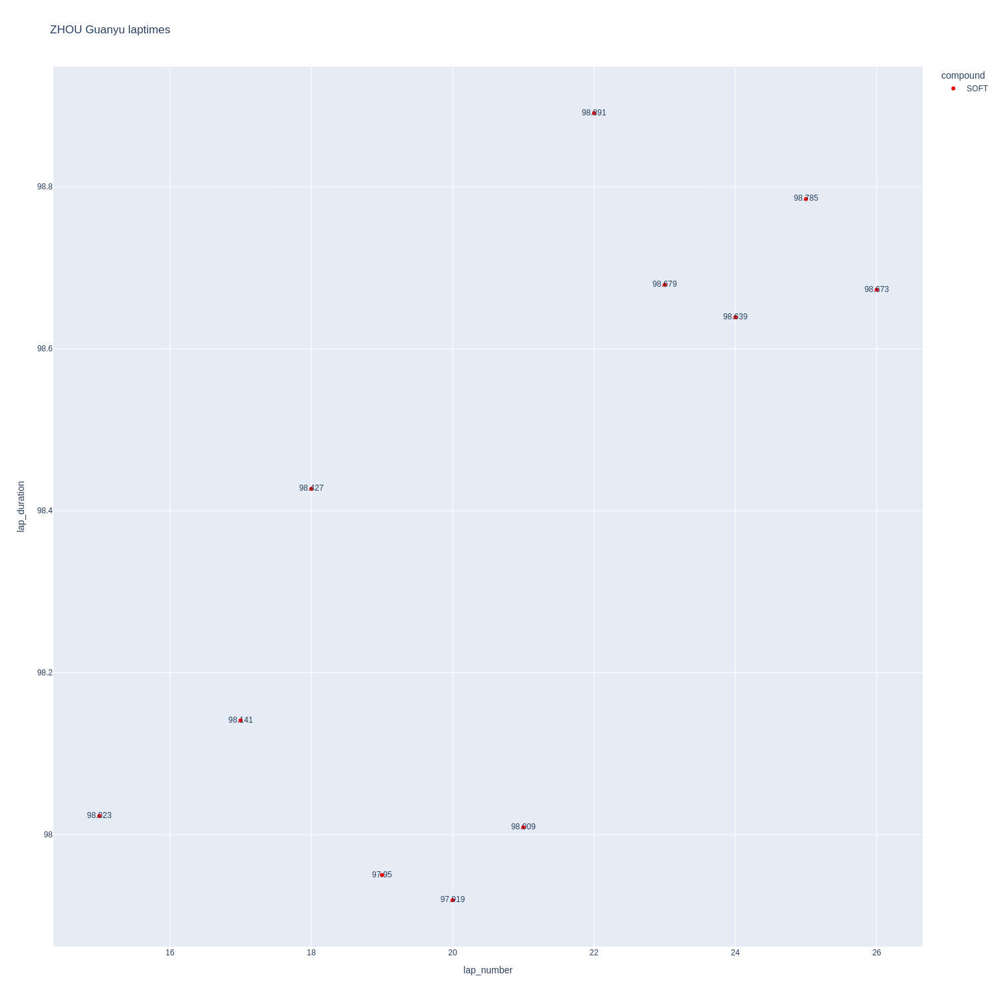

In [95]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

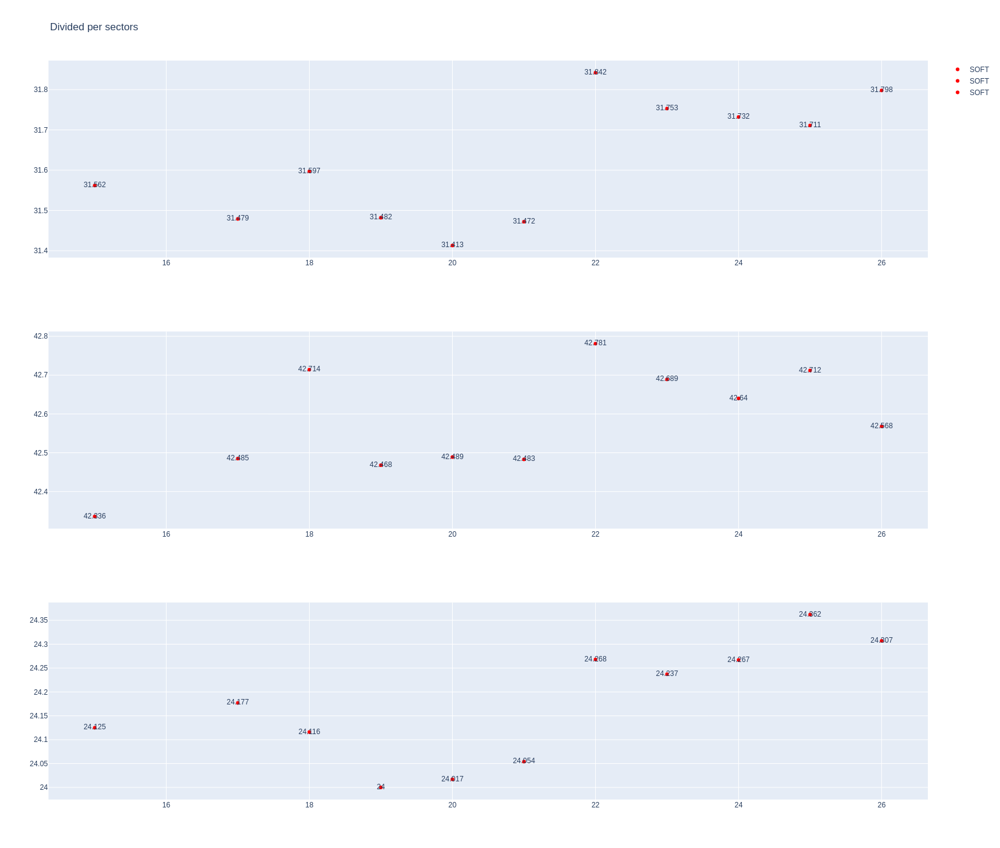

In [96]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [97]:
data = libraryDataF1.getinfolongruns(jointables2,77,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
276,Valtteri BOTTAS,SOFT,2024-02-29T15:44:00.665000+00:00,14,30.984,42.086,24.061,97.131
296,Valtteri BOTTAS,SOFT,2024-02-29T15:45:37.911000+00:00,15,31.087,42.052,24.085,97.224
316,Valtteri BOTTAS,SOFT,2024-02-29T15:47:15.117000+00:00,16,31.195,42.103,23.987,97.285
336,Valtteri BOTTAS,SOFT,2024-02-29T15:48:52.477000+00:00,17,31.249,42.195,23.939,97.383
356,Valtteri BOTTAS,SOFT,2024-02-29T15:50:29.754000+00:00,18,31.135,42.279,23.991,97.405
376,Valtteri BOTTAS,SOFT,2024-02-29T15:52:07.195000+00:00,19,31.301,42.171,24.104,97.576
396,Valtteri BOTTAS,SOFT,2024-02-29T15:53:44.770000+00:00,20,31.460,42.557,24.252,98.269
416,Valtteri BOTTAS,SOFT,2024-02-29T15:55:22.939000+00:00,21,31.539,42.773,24.151,98.463
435,Valtteri BOTTAS,SOFT,2024-02-29T15:57:01.608000+00:00,22,31.503,42.426,24.273,98.202
455,Valtteri BOTTAS,SOFT,2024-02-29T15:58:39.655000+00:00,23,31.685,42.281,24.303,98.269


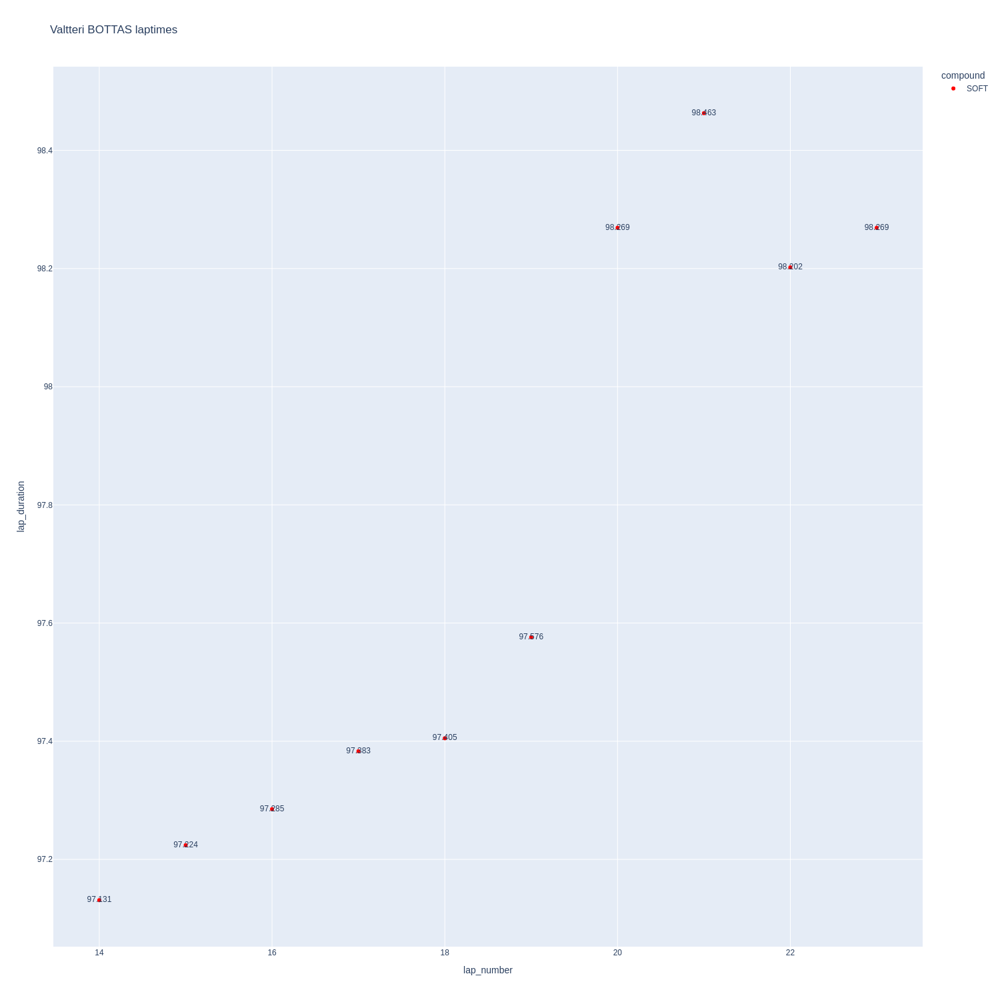

In [98]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

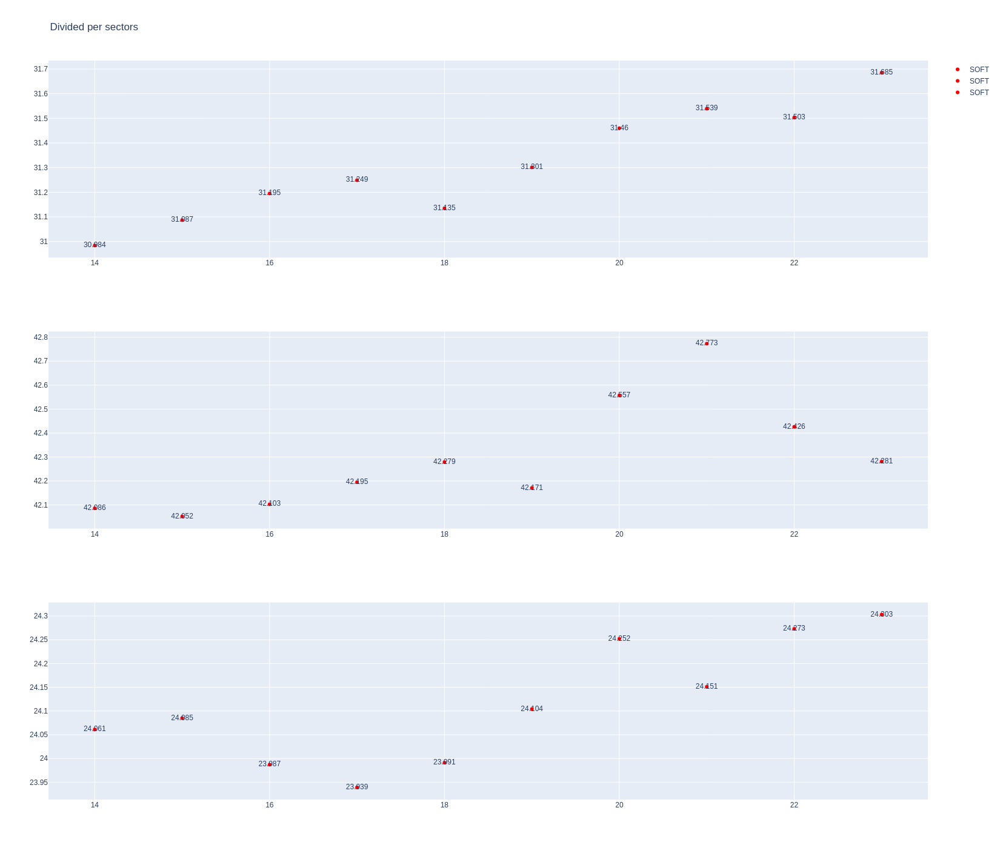

In [99]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [100]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration

In [101]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [102]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
0,Max VERSTAPPEN,SOFT,96.715364,31.140273,41.650182,23.924909
19,Oscar PIASTRI,SOFT,96.840000,31.114615,41.718000,24.007385
5,Sergio PEREZ,SOFT,96.906200,31.160700,41.730700,24.014800
3,Lando NORRIS,SOFT,97.094250,31.150833,41.925167,24.018250
7,Charles LECLERC,SOFT,97.124800,31.243400,41.859200,24.022200
17,George RUSSELL,SOFT,97.184917,31.028000,41.927583,24.229333
15,Lewis HAMILTON,SOFT,97.237000,31.322300,41.999600,23.915100
16,Carlos SAINZ,SOFT,97.269222,31.441333,41.899889,23.928000
6,Fernando ALONSO,SOFT,97.292000,31.204111,41.956778,24.131111
1,Logan SARGEANT,SOFT,97.365250,31.253250,42.061000,24.051000


##### Sorted by sector 1

In [103]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
17,George RUSSELL,SOFT,31.028000
19,Oscar PIASTRI,SOFT,31.114615
0,Max VERSTAPPEN,SOFT,31.140273
3,Lando NORRIS,SOFT,31.150833
5,Sergio PEREZ,SOFT,31.160700
6,Fernando ALONSO,SOFT,31.204111
2,Daniel RICCIARDO,SOFT,31.242583
7,Charles LECLERC,SOFT,31.243400
1,Logan SARGEANT,SOFT,31.253250
13,Nico HULKENBERG,SOFT,31.289091


##### Sorted by sector 2

In [104]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
0,Max VERSTAPPEN,SOFT,41.650182
19,Oscar PIASTRI,SOFT,41.718000
5,Sergio PEREZ,SOFT,41.730700
7,Charles LECLERC,SOFT,41.859200
16,Carlos SAINZ,SOFT,41.899889
3,Lando NORRIS,SOFT,41.925167
17,George RUSSELL,SOFT,41.927583
6,Fernando ALONSO,SOFT,41.956778
15,Lewis HAMILTON,SOFT,41.999600
1,Logan SARGEANT,SOFT,42.061000


##### Sorted by sector 3

In [105]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
15,Lewis HAMILTON,SOFT,23.915100
0,Max VERSTAPPEN,SOFT,23.924909
16,Carlos SAINZ,SOFT,23.928000
19,Oscar PIASTRI,SOFT,24.007385
5,Sergio PEREZ,SOFT,24.014800
3,Lando NORRIS,SOFT,24.018250
7,Charles LECLERC,SOFT,24.022200
1,Logan SARGEANT,SOFT,24.051000
18,Valtteri BOTTAS,SOFT,24.114600
11,Alexander ALBON,SOFT,24.127000


#### Long runs mean

In [106]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [107]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time


In [108]:
libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
0,M VERSTAPPEN,96.715
19,O PIASTRI,96.868
5,S PEREZ,96.906
3,L NORRIS,97.082
7,C LECLERC,97.125
17,G RUSSELL,97.185
15,L HAMILTON,97.237
16,C SAINZ,97.269
6,F ALONSO,97.292
1,L SARGEANT,97.365


In [109]:
#libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

## Free Practice 3
### Obtain setup

In [110]:
practice = libraryDataF1.obtain_information('laps',session_key=9467)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9467)
drivers = libraryDataF1.obtain_information('drivers',session_key=9467)

In [111]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

In [112]:
session = ff1.get_session(2024, 'Bahrain', 'FP3')
session.load();

req         WARNING 	DEFAULT CACHE ENABLED! (1.34 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Bahrain Grand Prix - Practice 3 [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '10', '11', '14', '16', '18', '2', '20', '22', '23', '24', '27', '3', '31', '4', '44', '55', '63', '77', '81']


### Speed trap

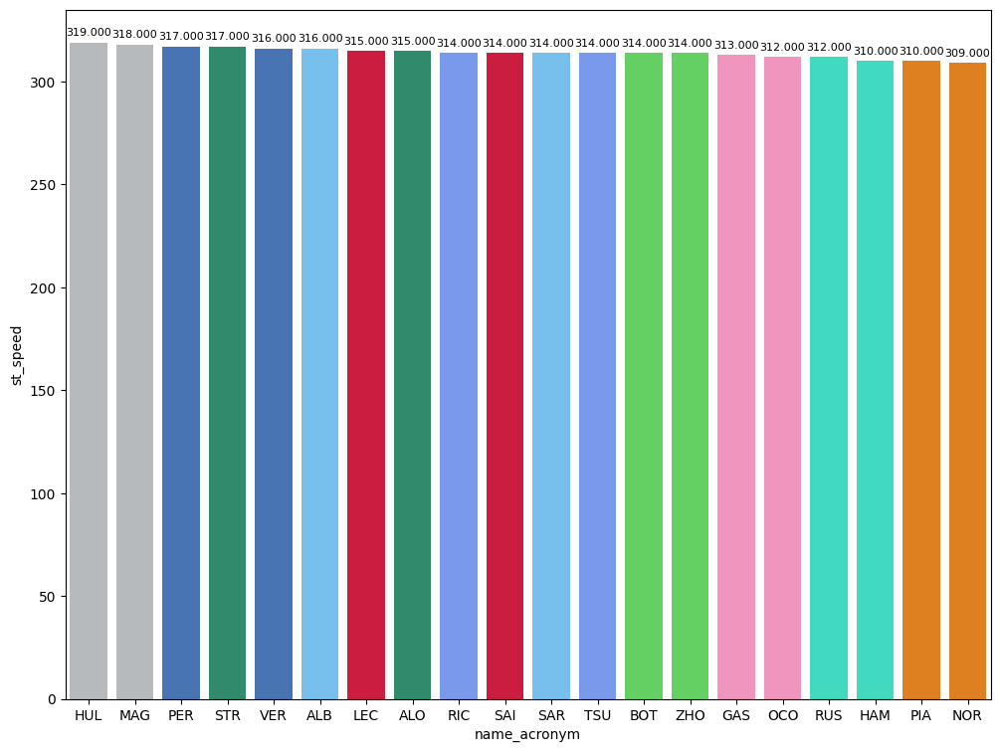

In [113]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

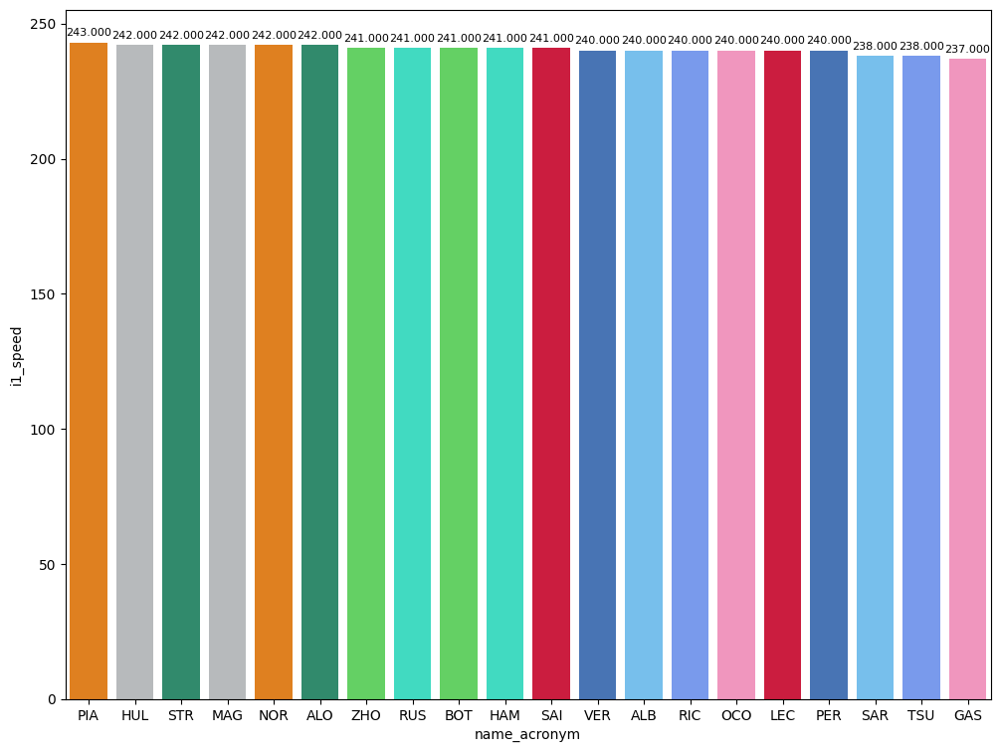

In [114]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

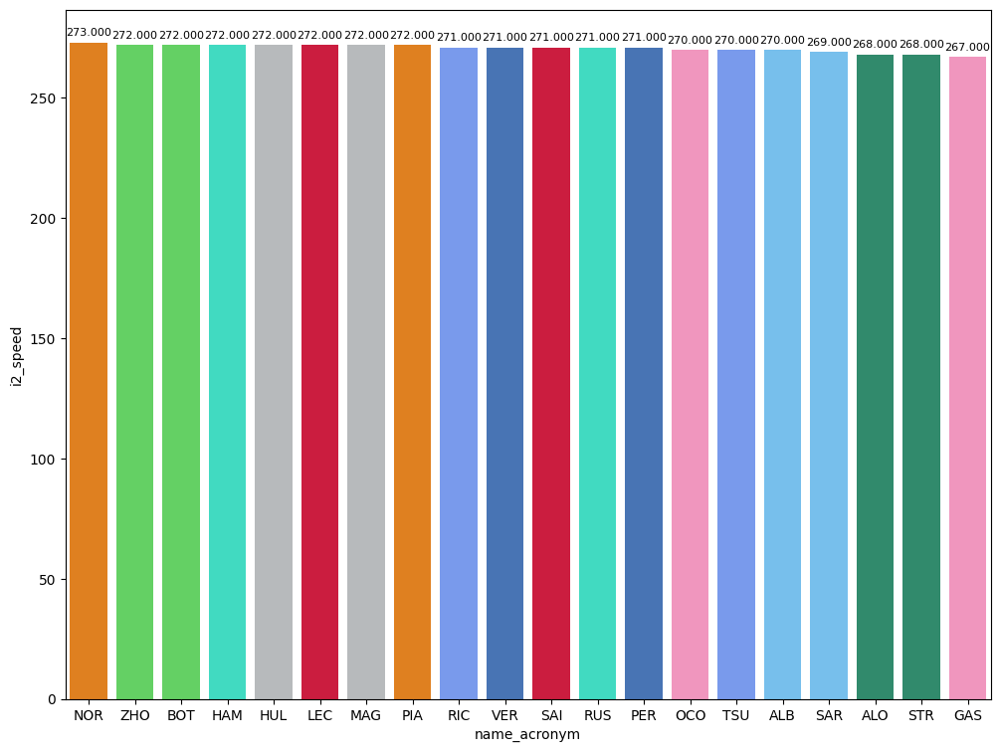

In [115]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [116]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
162,Sergio PEREZ,HARD,29.159,39.259,22.830,91.248
48,Alexander ALBON,MEDIUM,29.513,39.879,23.103,92.495
234,Carlos SAINZ,SOFT,29.138,39.046,22.640,90.824


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [117]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


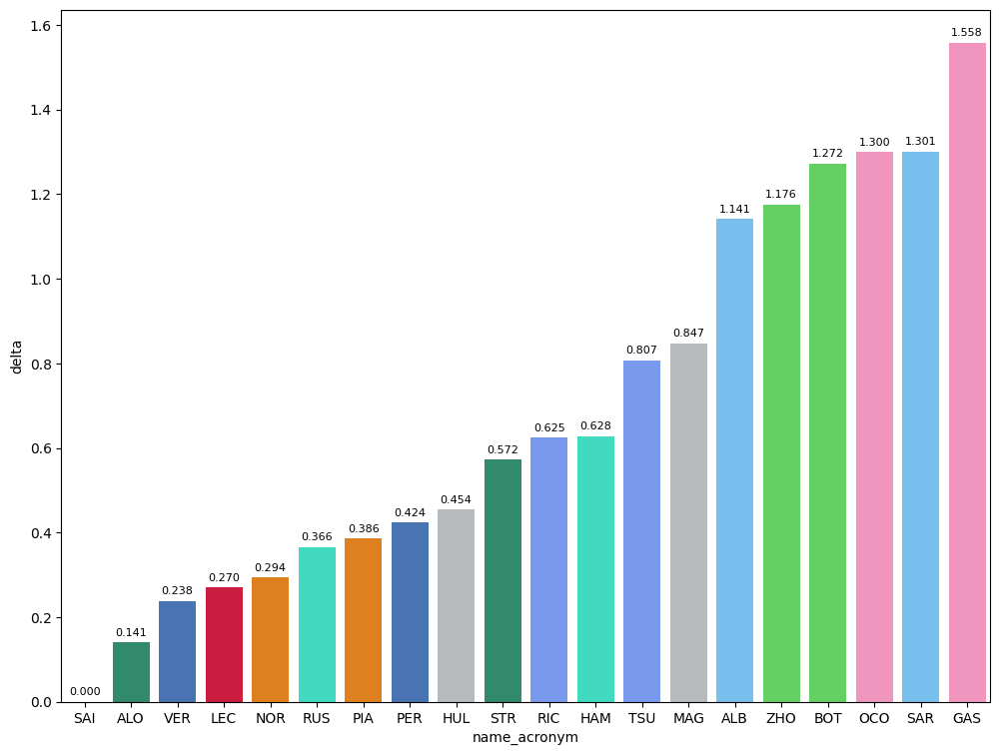

In [118]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

In [119]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
sectorPace[['duration_sector_1','full_name','compound','lap_duration','lap_number']]

,duration_sector_1,full_name,compound,lap_duration,lap_number
169,29.054,Max VERSTAPPEN,SOFT,91.062,8
187,29.063,Lando NORRIS,SOFT,91.118,8
232,29.091,Yuki TSUNODA,SOFT,91.631,9
181,29.095,Lance STROLL,SOFT,91.396,10
184,29.111,Fernando ALONSO,SOFT,90.965,11
234,29.138,Carlos SAINZ,SOFT,90.824,13
197,29.141,Lewis HAMILTON,SOFT,91.452,13
190,29.153,Oscar PIASTRI,SOFT,91.210,9
162,29.159,Sergio PEREZ,HARD,91.248,9
227,29.173,Nico HULKENBERG,SOFT,91.278,8


In [120]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
sectorPace[['duration_sector_2','full_name','compound','lap_duration','lap_number']]

,duration_sector_2,full_name,compound,lap_duration,lap_number
187,38.855,Lando NORRIS,SOFT,91.118,8
246,38.930,Charles LECLERC,SOFT,91.094,13
208,39.019,Max VERSTAPPEN,SOFT,91.246,11
234,39.046,Carlos SAINZ,SOFT,90.824,13
184,39.157,Fernando ALONSO,SOFT,90.965,11
201,39.206,George RUSSELL,SOFT,91.190,8
227,39.237,Nico HULKENBERG,SOFT,91.278,8
190,39.240,Oscar PIASTRI,SOFT,91.210,9
162,39.259,Sergio PEREZ,HARD,91.248,9
181,39.271,Lance STROLL,SOFT,91.396,10


In [121]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
sectorPace[['duration_sector_3','full_name','compound','lap_duration','lap_number']]

,duration_sector_3,full_name,compound,lap_duration,lap_number
201,22.635,George RUSSELL,SOFT,91.190,8
234,22.640,Carlos SAINZ,SOFT,90.824,13
184,22.697,Fernando ALONSO,SOFT,90.965,11
246,22.727,Charles LECLERC,SOFT,91.094,13
200,22.776,Sergio PEREZ,SOFT,91.328,12
190,22.817,Oscar PIASTRI,SOFT,91.210,9
253,22.853,Kevin MAGNUSSEN,SOFT,91.671,17
169,22.857,Max VERSTAPPEN,SOFT,91.062,8
225,22.866,Lance STROLL,SOFT,91.735,13
227,22.868,Nico HULKENBERG,SOFT,91.278,8


### Mean pace with the different compound used on the session

In [122]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 95").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,92.32248
MEDIUM,92.49500
HARD,92.84900


### Gear shifts of the poleman

core        WARNING 	Failed to preserve data type for column 'X' while merging telemetry.
core        WARNING 	Failed to preserve data type for column 'Y' while merging telemetry.
core        WARNING 	Failed to preserve data type for column 'Z' while merging telemetry.


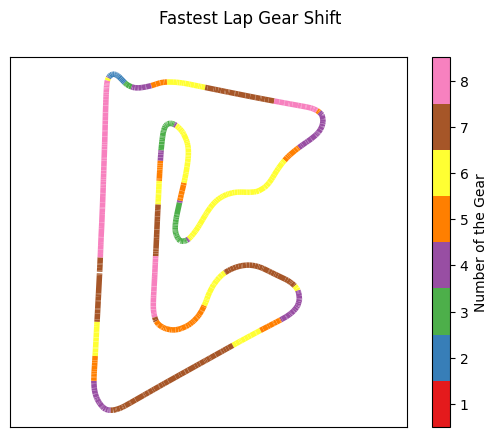

In [123]:
libraryDataF1.show_shifts_poleman(session)

### Comparaison between the poleman and the second

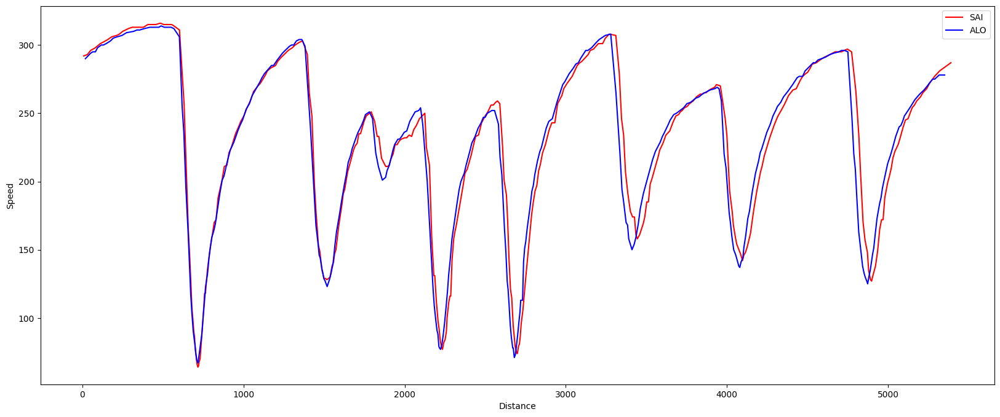

In [124]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

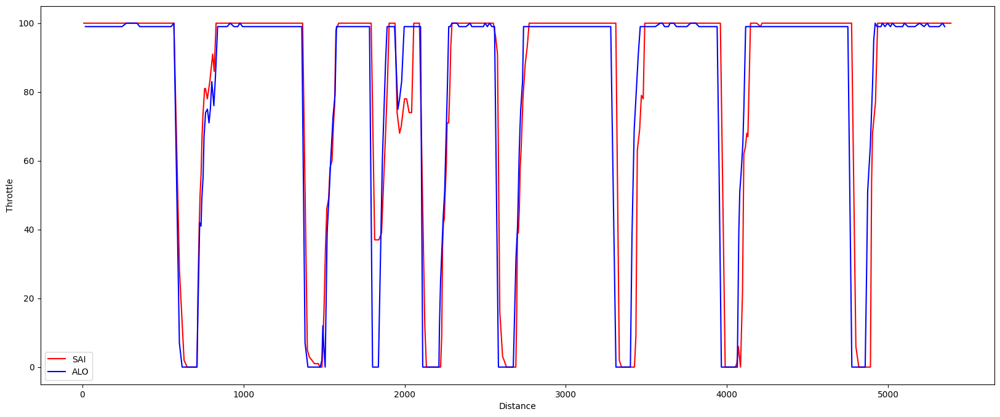

In [125]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

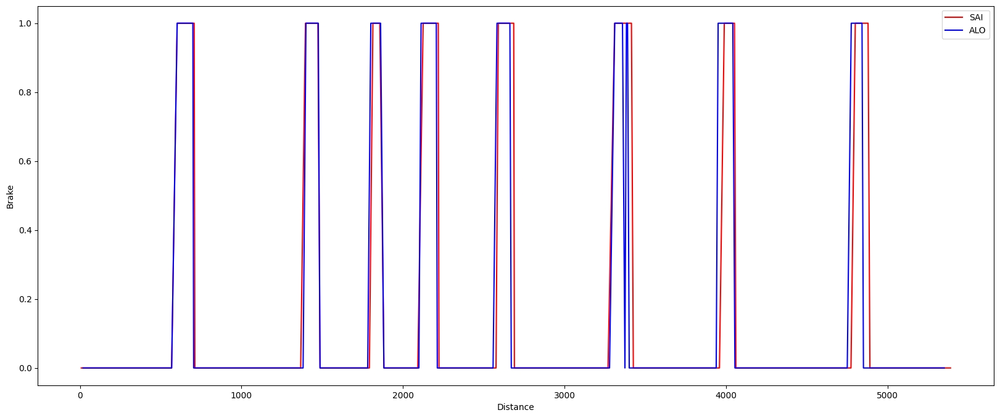

In [126]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

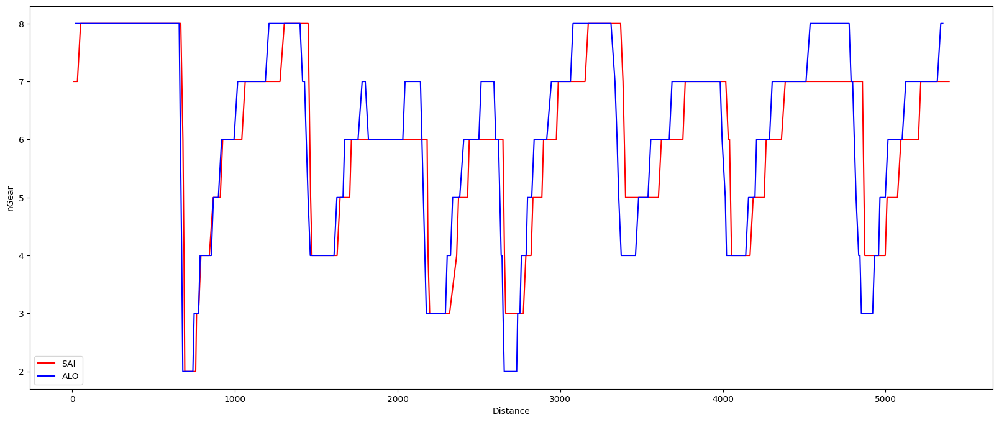

In [127]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session.

In [128]:
libraryDataF1.obtain_information('race_control',session_key=9468)

,session_key,meeting_key,date,category,flag,lap_number,message,driver_number,scope,sector
0,9468,1229,2024-03-01T16:00:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,None
1,9468,1229,2024-03-01T16:04:42+00:00,Other,None,None,CAR 10 (GAS) TIME 1:32.434 DELETED - TRACK LIM...,None,None,None
2,9468,1229,2024-03-01T16:18:00+00:00,Flag,CHEQUERED,None,CHEQUERED FLAG,None,Track,None
3,9468,1229,2024-03-01T16:18:13+00:00,Other,None,None,FIRST CAR TO TAKE THE FLAG - CAR 22 (TSU),None,None,None
4,9468,1229,2024-03-01T16:22:07+00:00,Other,None,None,FIA STEWARDS: INCIDENT INVOLVING CARS 63 (RUS)...,None,None,None
5,9468,1229,2024-03-01T16:25:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,None
6,9468,1229,2024-03-01T16:30:24+00:00,Other,None,None,CAR 20 (MAG) TIME 1:31.170 DELETED - TRACK LIM...,None,None,None
7,9468,1229,2024-03-01T16:32:19+00:00,Other,None,None,FIA STEWARDS: INCIDENT INVOLVING CARS 63 (RUS)...,None,None,None
8,9468,1229,2024-03-01T16:40:01+00:00,Flag,CHEQUERED,None,CHEQUERED FLAG,None,Track,None
9,9468,1229,2024-03-01T16:40:12+00:00,Other,None,None,FIRST CAR TO TAKE THE FLAG - CAR 16 (LEC),None,None,None


### Obtain setup

In [129]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9468)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9468)
drivers = libraryDataF1.obtain_information('drivers',session_key=9468)
libraryDataF1.obtain_drivers_colours(drivers)

In [130]:
session = ff1.get_session(2024, 'Bahrain', 'Q')
session.load()
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

core           INFO 	Loading data for Bahrain Grand Prix - Qualifying [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '63', '55', '11', '14', '4', '81', '44', '27', '22', '18', '23', '3', '20', '77', '24', '2', '31', '10']


To obtain a better analysis, those laptimes deleted will be removed from this analysis in order to obtain the data with valid values. So that,taking into account the race control table, it will be neccesary to consult the qualyfing data to obtain the ids. 

In [131]:
qualyfing = qualyfing.drop(7)
qualyfing = qualyfing.drop(137)

In [132]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)
bestlap[0:1]

,meeting_key,session_key,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,duration_sector_2,duration_sector_3,segments_sector_1,segments_sector_2,segments_sector_3,lap_number
192,1229,9468,16,243,274,317,2024-03-01T16:38:38.918000+00:00,89.165,False,28.843,38.059,22.263,"[2049, 2049, 2049, 2048, 2049, 2049, 2049, 204...","[2049, 2051, 2049, 2051, 2051, 2051, 2049, 204...","[0, 0, 0, 0, 0, 0, 0]",12


In this case, the fastest lap is 89.165 seconds (1.29.165= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 (95.406 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [133]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < 95.406")

In [134]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
In this chart we can see the deltas with compared with the fastest lap of the session that it could be different than the pole. In this case, this happened with Leclerc taking the best time but not taking the pole because his cest time in Q3 was not the best time of the session.

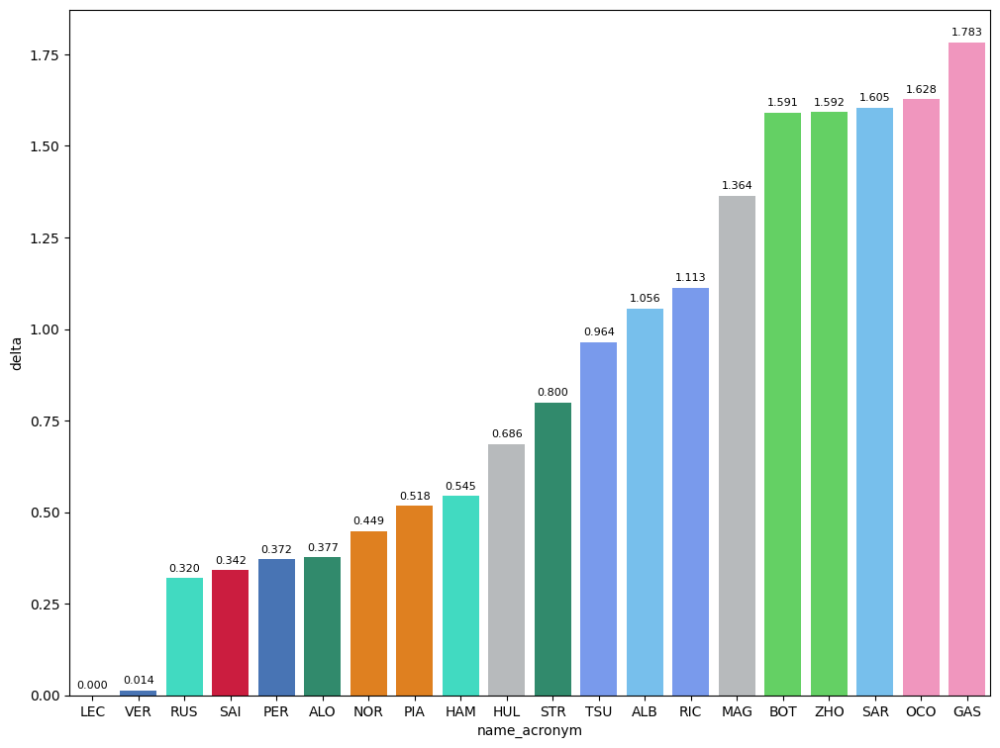

In [135]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers

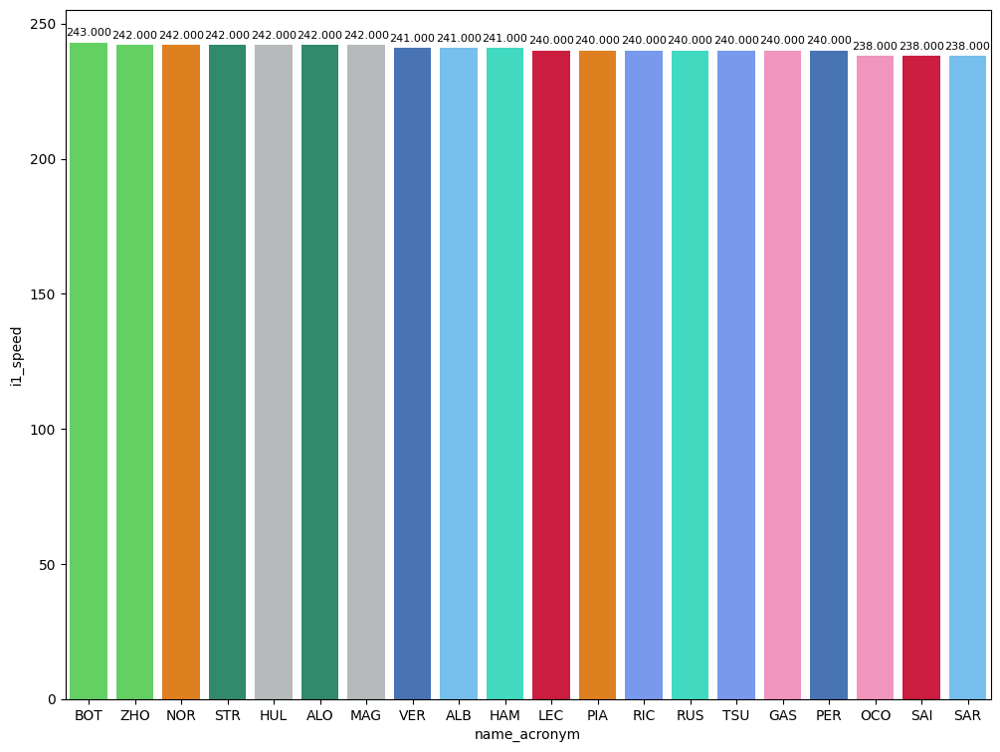

In [136]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

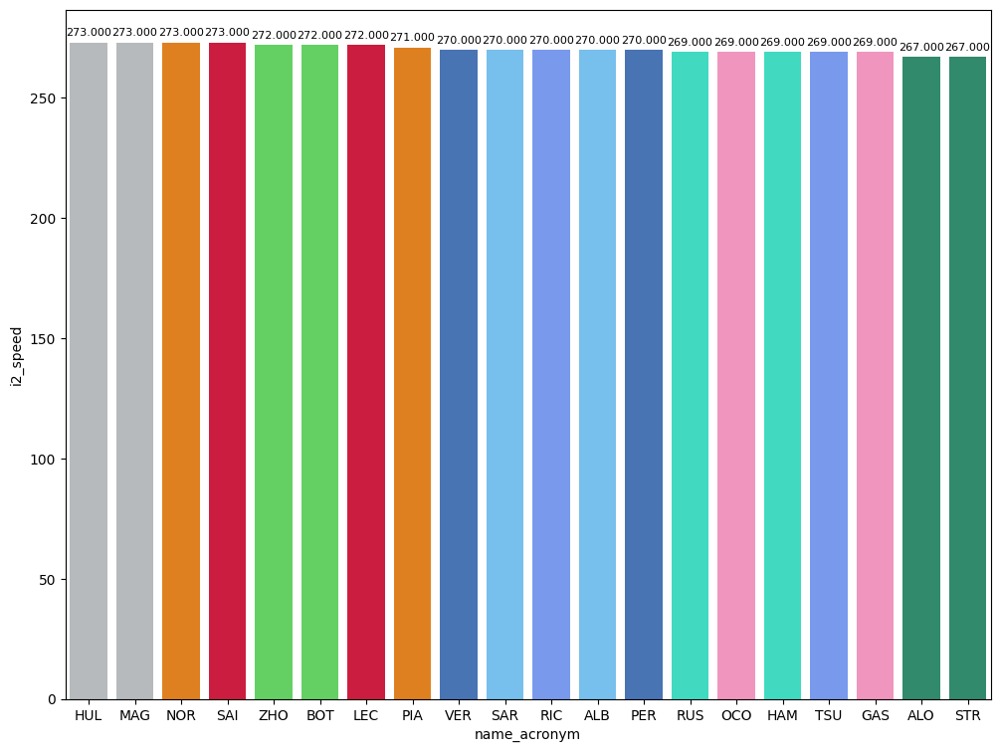

In [137]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

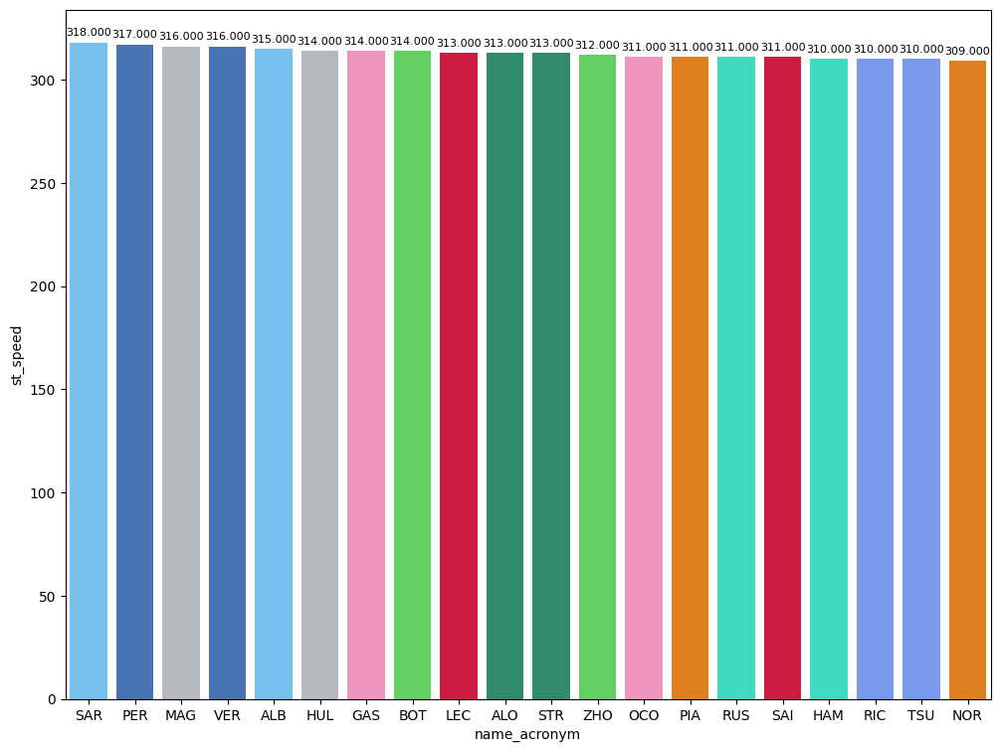

In [138]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

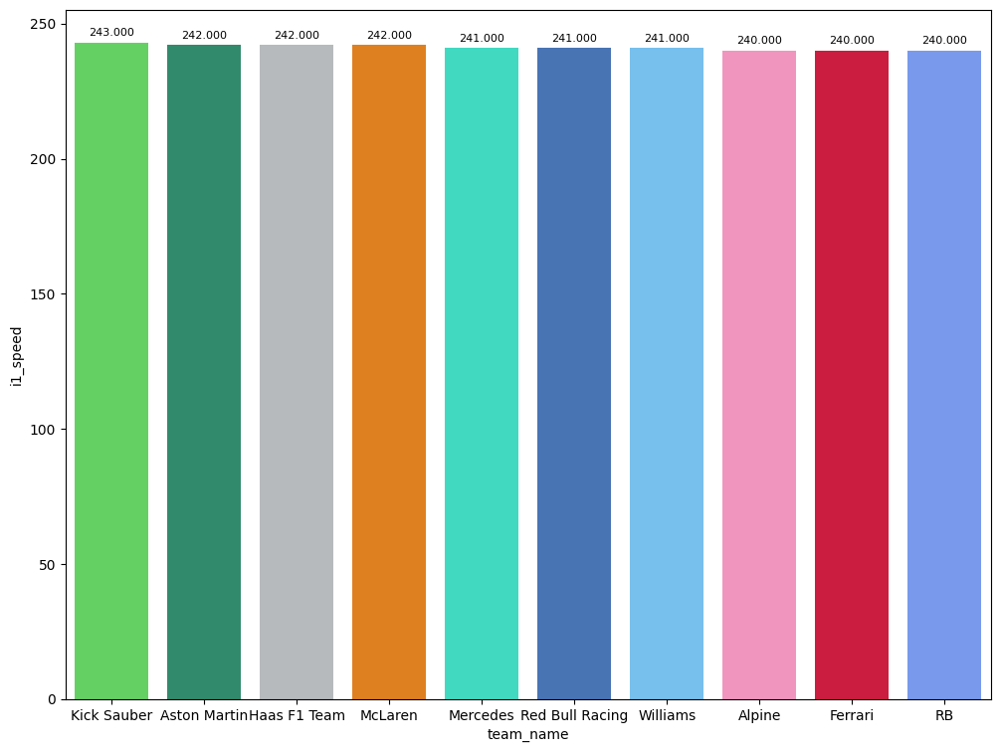

In [139]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

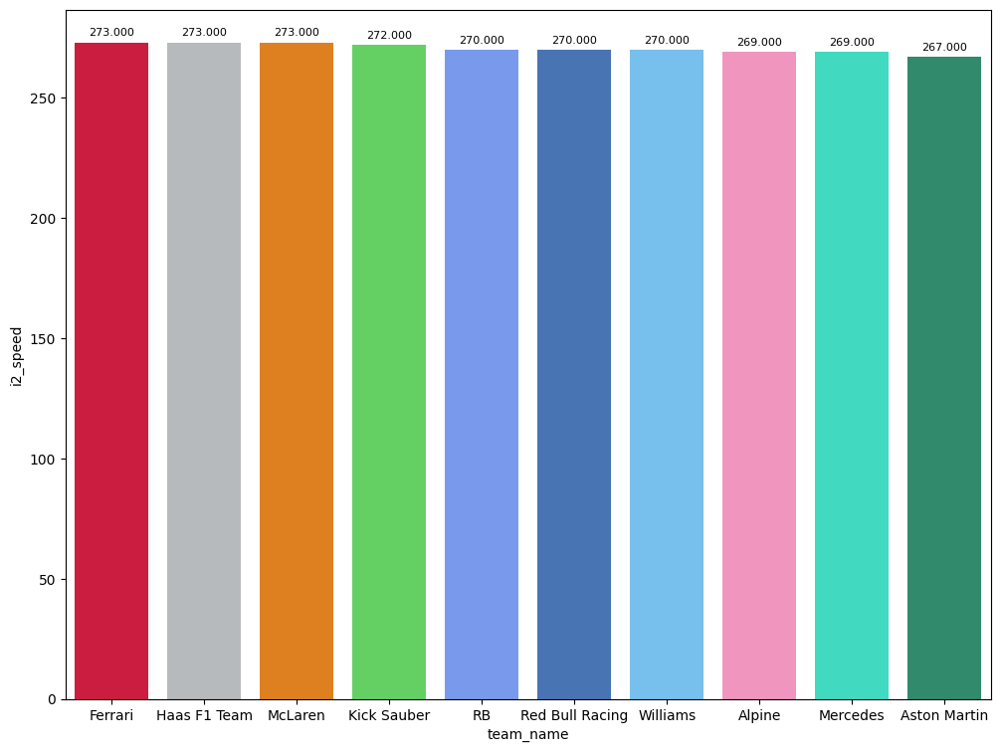

In [141]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

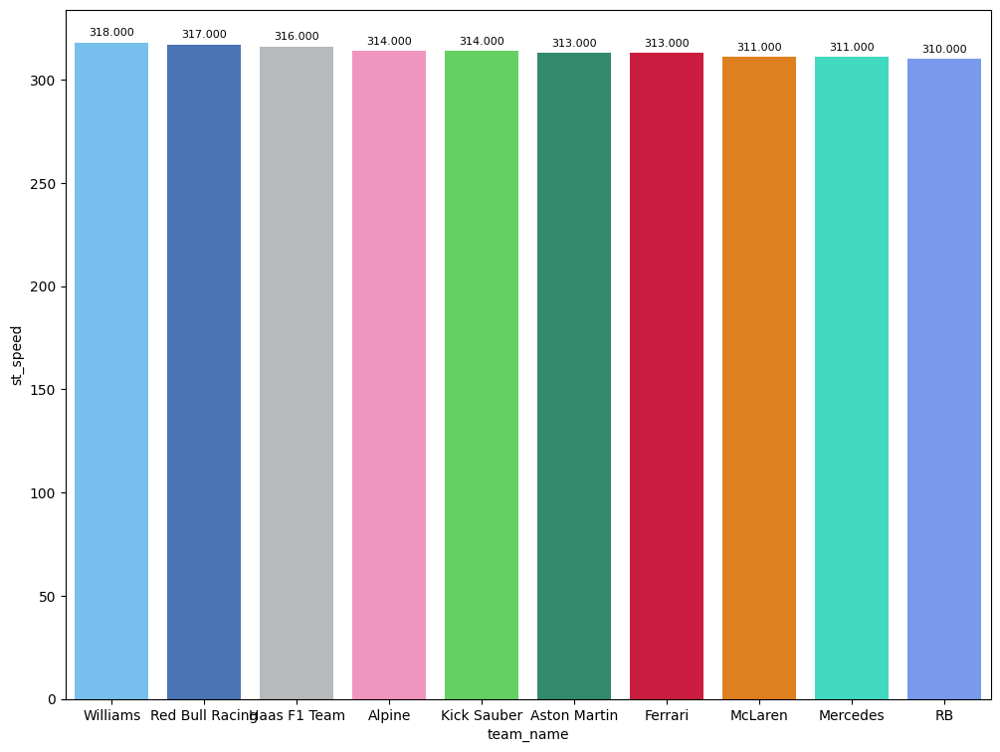

In [142]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [143]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [144]:
maximumDateQ1 = "date_start <'2024-03-01T16:25:00+00:00'"
maximumDateQ2 = "date_start <'2024-03-01T16:48:00+00:00' and date_start >'2024-03-01T16:25:00+00:00'"
maximumDateQ3 = "date_start >'2024-03-01T16:48:00+00:00'"

### Qualyfing 1
In this session, I did not see any surprise with the favourites qualyfing to Q2. As we can in testing, we knew that Alpine was the worst team and that was constrasted in qualyfing finishing P19 and P20. Other team that finished out of Q1 was Kick Sauber finishing Zhou P17 and Bottas P16. Differences beetween sectors will be shown in the following section.

In [145]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [146]:
#Reference
P15 = q1Data[14:15]

In [147]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Kevin MAGNUSSEN Sector 1:  29.037 Sector 2:  38.952 Sector 3:  22.657


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
In the first sector we can see that none of the eliminated drivers, except Sargeant, were faster than Magnussen.
In the second sector, Sargeant lost his chances to make it through to Q2 in this sector losing 1.67 tenths. Althought Zhou and Ocon improved , their improvement was not enough to pass to Q2.
Finally, in the third sector none of them improved.

In [148]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,77,0.110,0.026,0.073,0.011,BOT
1,24,0.111,0.117,-0.008,0.002,ZHO
2,2,0.124,-0.046,0.167,0.003,SAR
3,31,0.147,0.105,-0.018,0.060,OCO
4,10,0.302,0.111,0.019,0.172,GAS


##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
In general, the unique driver that was at risk if Magnussen had improved his second sector it would have been Ricciardo because his first and third sector were worse than the Danish driver.
Another case that I would like to stand out is Piastri's case. Aussie was 2 tenth underneath Magnussen in the first sector and he would have been out of Q1 if he did not improved in the following sectors.

In [149]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,55,-0.737,-0.029,-0.543,-0.165,SAI
1,18,-0.681,-0.386,-0.343,0.048,STR
2,1,-0.615,-0.250,-0.372,0.007,VER
3,4,-0.503,-0.054,-0.376,-0.073,NOR
4,14,-0.467,-0.148,-0.255,-0.064,ALO
5,11,-0.425,-0.098,-0.354,0.027,PER
6,16,-0.403,0.030,-0.363,-0.070,LEC
7,63,-0.296,0.065,-0.225,-0.136,RUS
8,23,-0.249,-0.179,-0.077,0.007,ALB
9,44,-0.195,-0.018,-0.058,-0.119,HAM


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: Futur

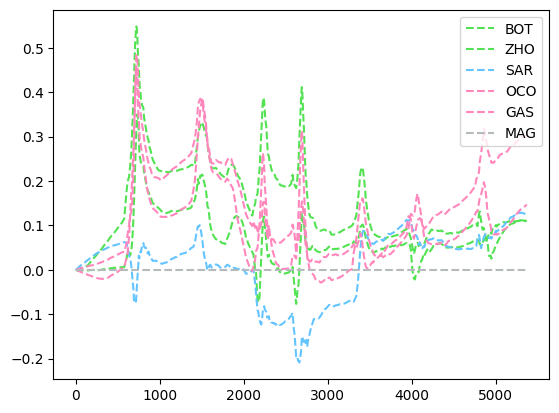

In [150]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

#### Best sector per driver
In this section we can see the best sector of the session

##### Sector 1

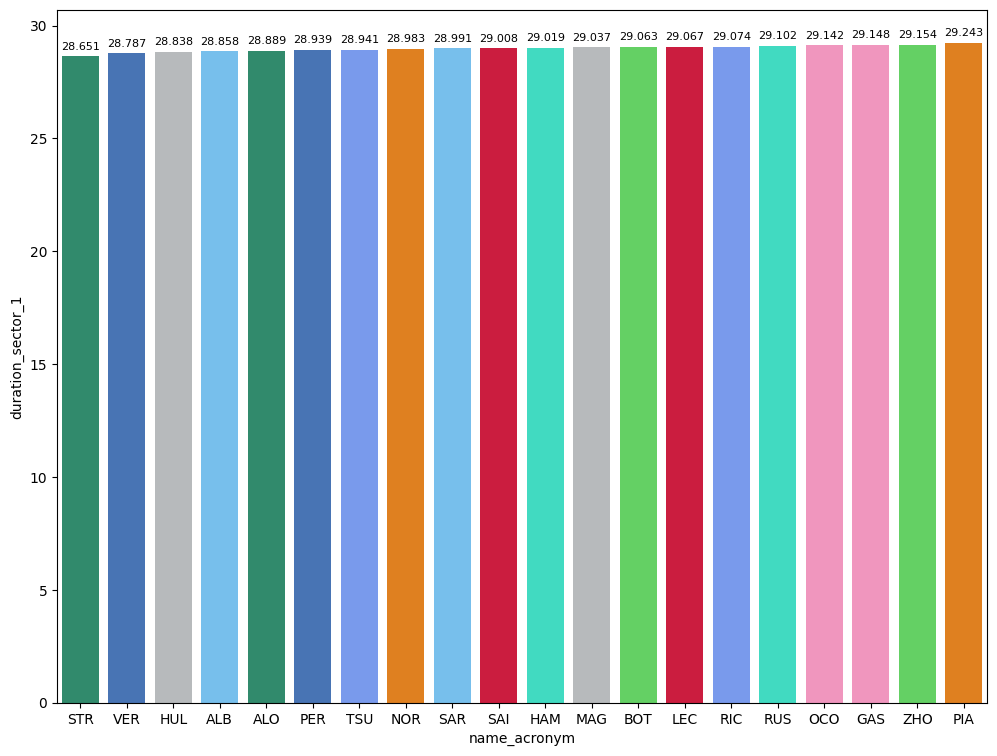

In [151]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

##### Sector 2

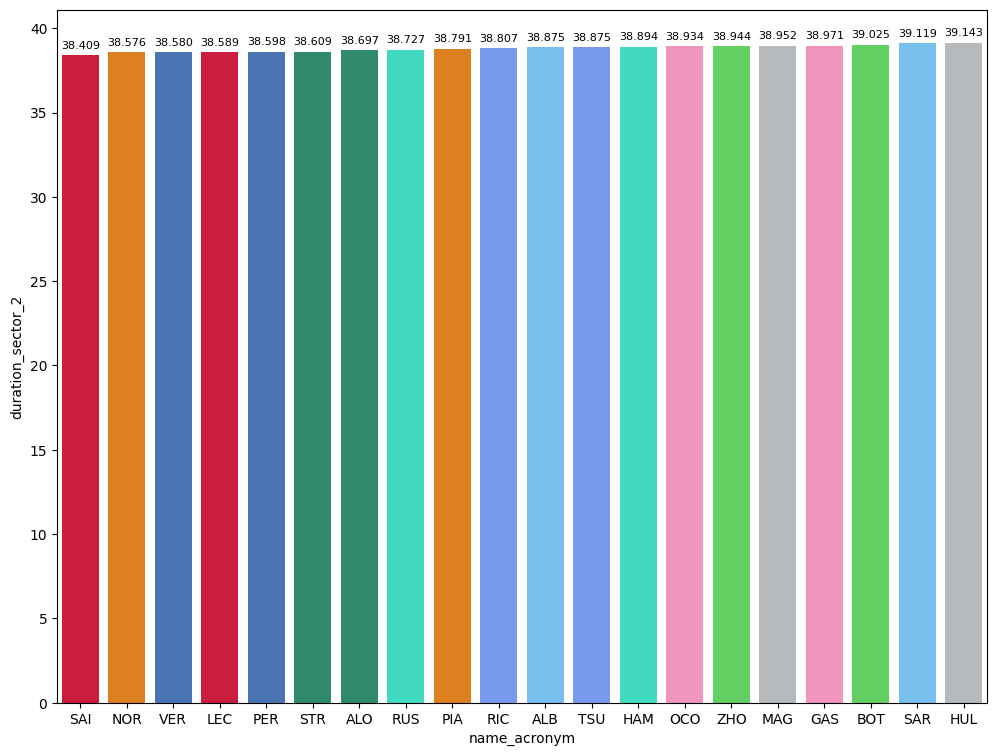

In [152]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

##### Sector 3

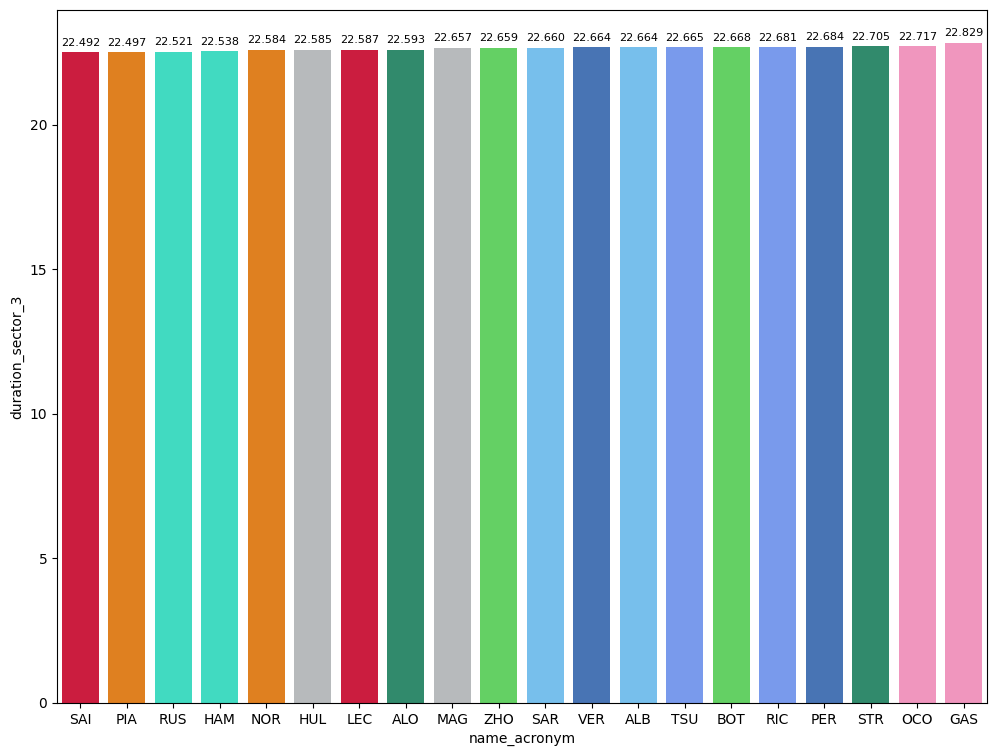

In [153]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2
In this session, we had the surprise of the Stroll's elimination finishing P12 and the incredible lap that afford to promote Hulkenberg to P6. Also, both RB were knocked-out finishing Tsunoda 9 thousands behind Piastri

In [154]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [155]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Oscar PIASTRI Sector 1:  28.955 Sector 2:  38.692 Sector 3:  22.475


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
In the first sector we can see that everyone was faster than Piastri, being Stroll strong chances to make it through Q3.
In the second sector and third sector, Piastri was the fastest improving enough in the third sector to pass to Q3.

In [156]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,22,0.007,-0.134,0.035,0.106,TSU
1,18,0.078,-0.305,0.164,0.219,STR
2,23,0.099,-0.089,0.110,0.078,ALB
3,3,0.156,-0.071,0.110,0.117,RIC
4,20,0.407,-0.071,0.284,0.194,MAG


##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
In general, nobody was at risk compared to Piastri

In [157]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,16,-0.957,-0.112,-0.633,-0.212,LEC
1,1,-0.748,-0.446,-0.305,0.003,VER
2,55,-0.549,-0.065,-0.346,-0.138,SAI
3,44,-0.404,-0.152,-0.146,-0.106,HAM
4,14,-0.321,-0.046,-0.174,-0.101,ALO
5,27,-0.271,-0.121,-0.056,-0.094,HUL
6,63,-0.200,-0.001,-0.082,-0.117,RUS
7,11,-0.190,-0.217,-0.039,0.066,PER
8,4,-0.181,-0.119,-0.107,0.045,NOR


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: Futur

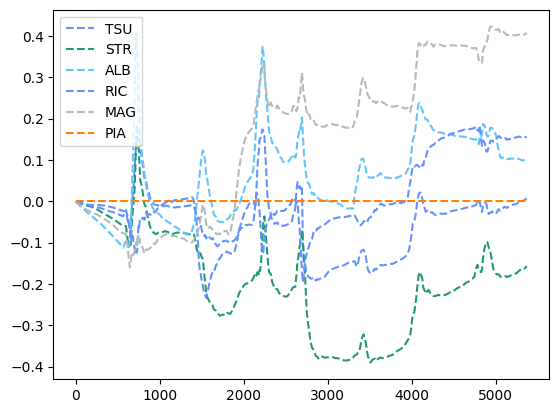

In [158]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

#### Best sector per driver
In this section we can see the best sector of the session

##### Sector 1

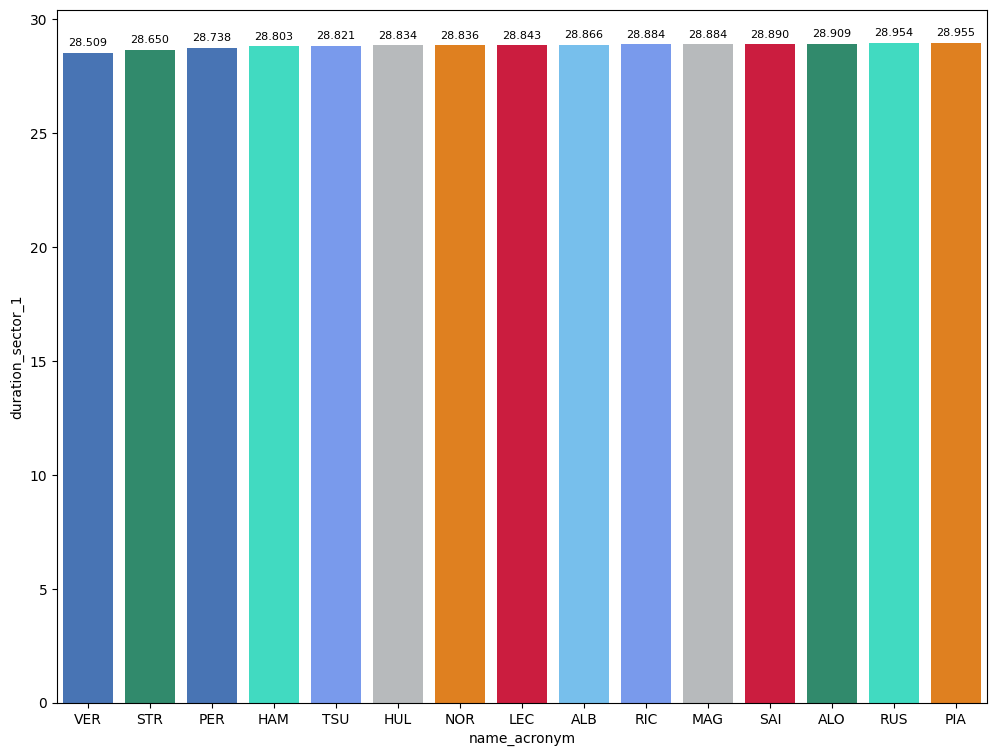

In [159]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

##### Sector 2

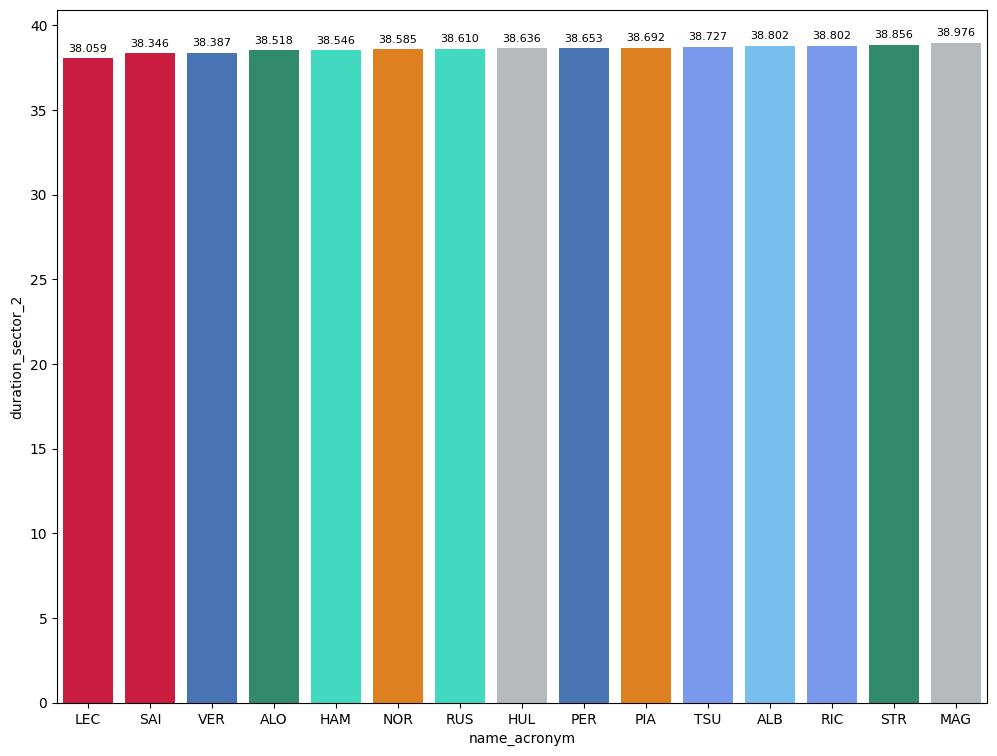

In [160]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

##### Sector 3

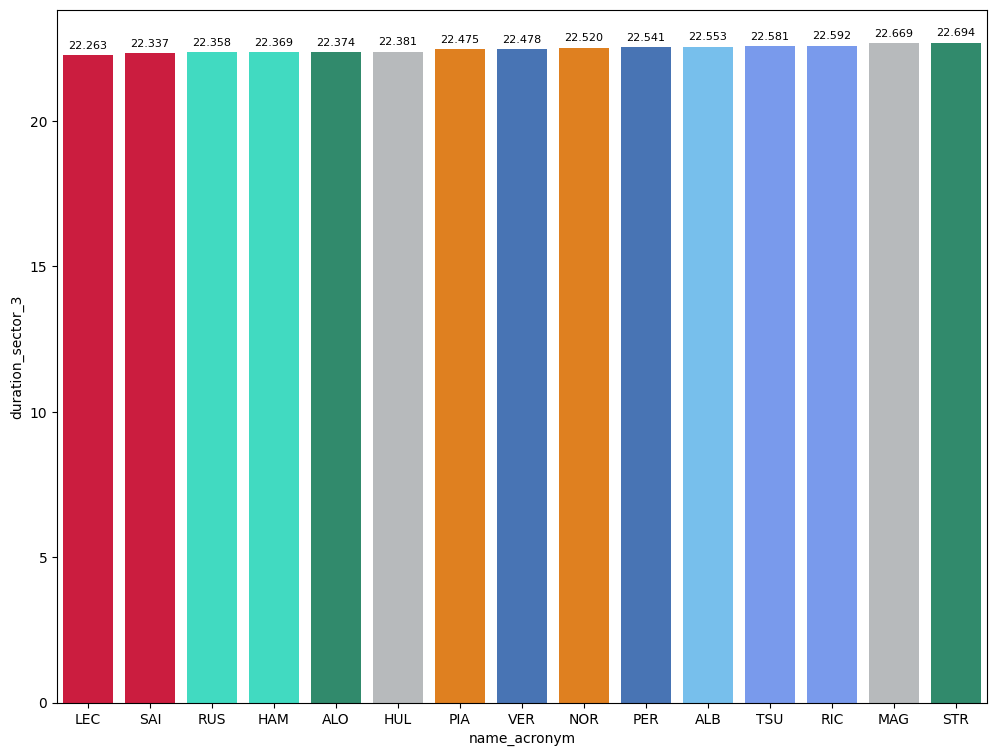

In [161]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [162]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [163]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Max VERSTAPPEN Sector 1:  28.535 Sector 2:  38.269 Sector 3:  22.375


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
The unique driver that would have been fighting the pole, it would have been Leclerc because his best time in Q2 it would have been valid to take the pole. Also, if Leclerc would have equalized his first sector with Verstappen's laptime he would have been able to fight for the pole.

In [164]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,16,0.228,0.227,0.007,-0.006,LEC
1,63,0.306,0.265,0.152,-0.111,RUS
2,55,0.328,0.315,0.029,-0.016,SAI
3,11,0.358,0.269,0.054,0.035,PER
4,14,0.363,0.295,-0.033,0.101,ALO
5,4,0.435,0.510,-0.062,-0.013,NOR
6,81,0.504,0.366,0.074,0.064,PIA
7,44,0.531,0.346,0.153,0.032,HAM
8,27,1.323,0.493,0.622,0.208,HUL


#### Best sector per driver
In this section we can see the best sector of the session

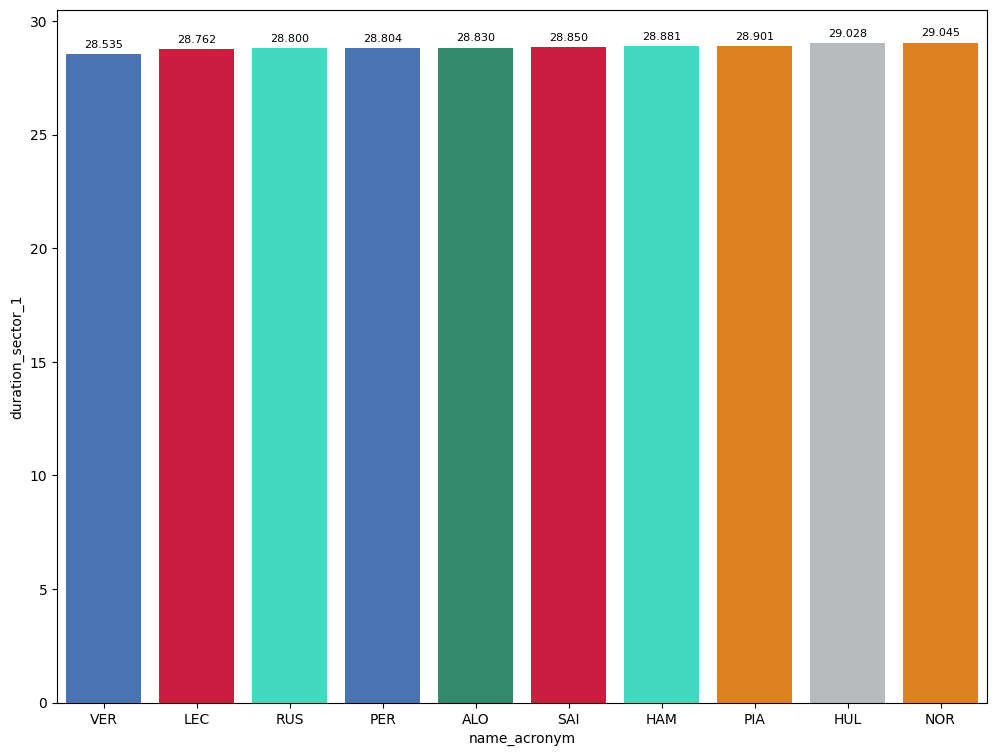

In [165]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

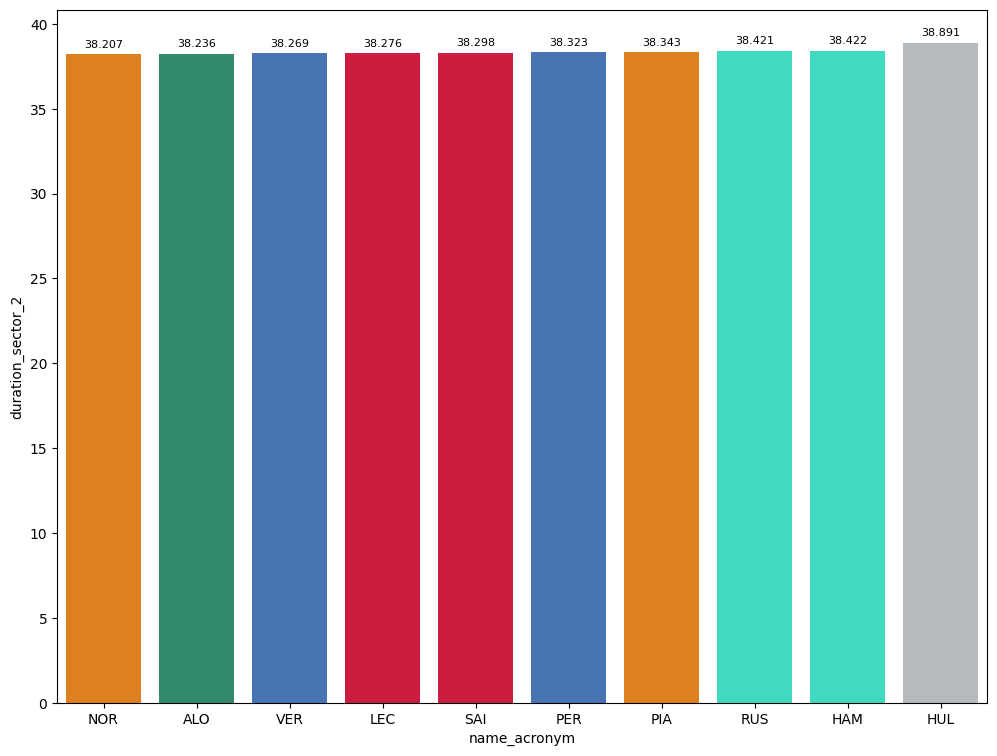

In [166]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

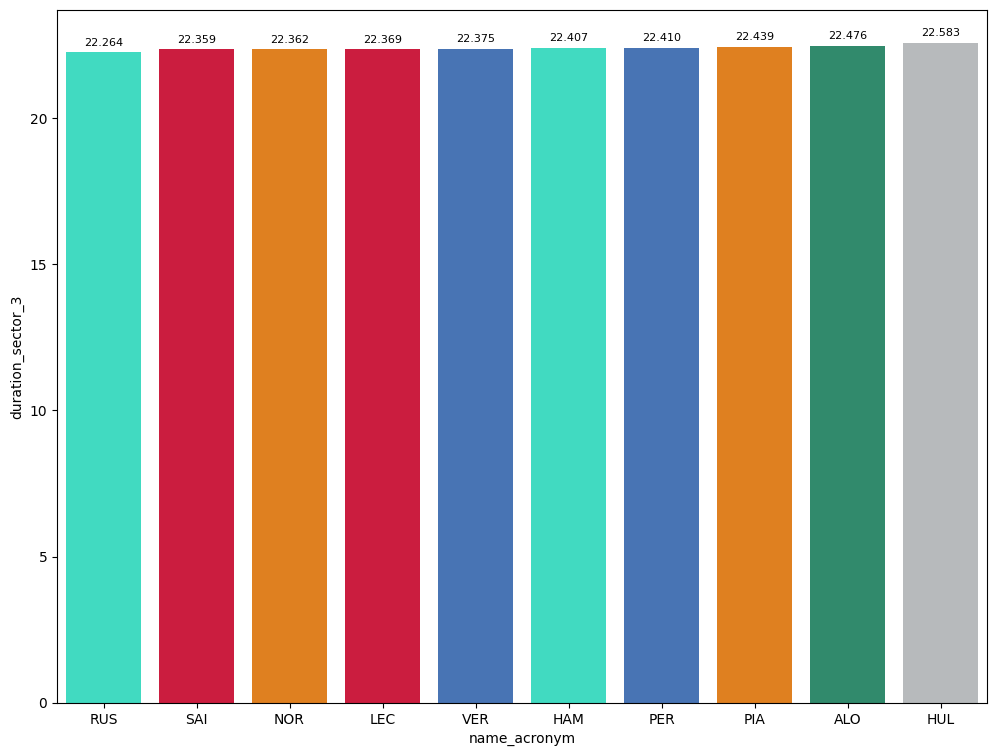

In [167]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

### Best sector per driver of the session (in general)

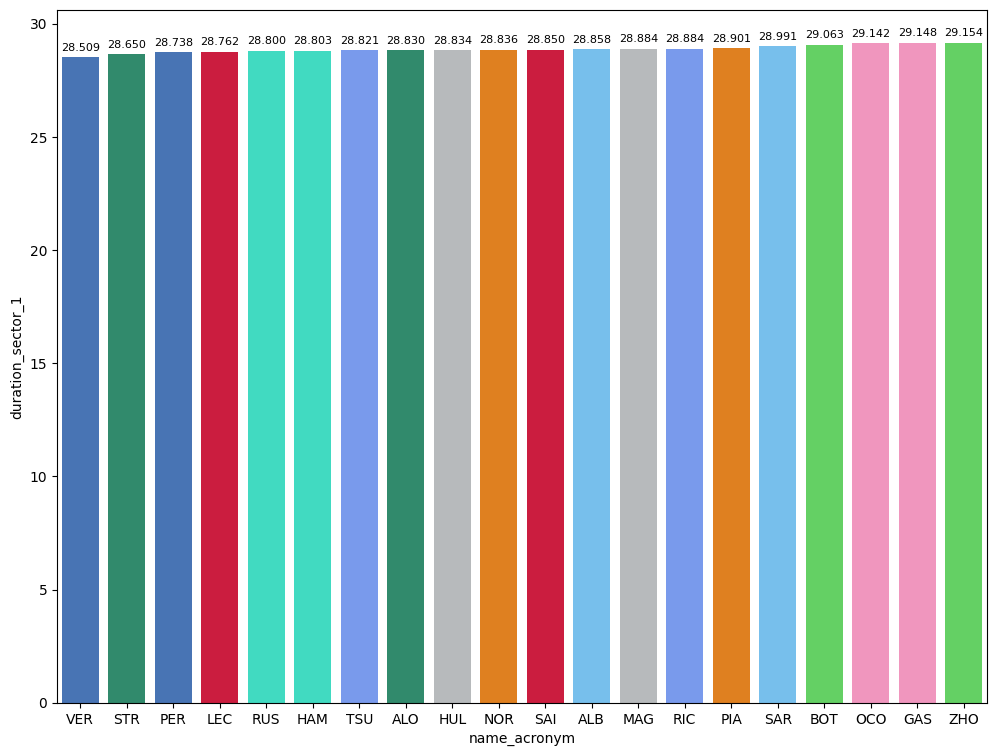

In [168]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

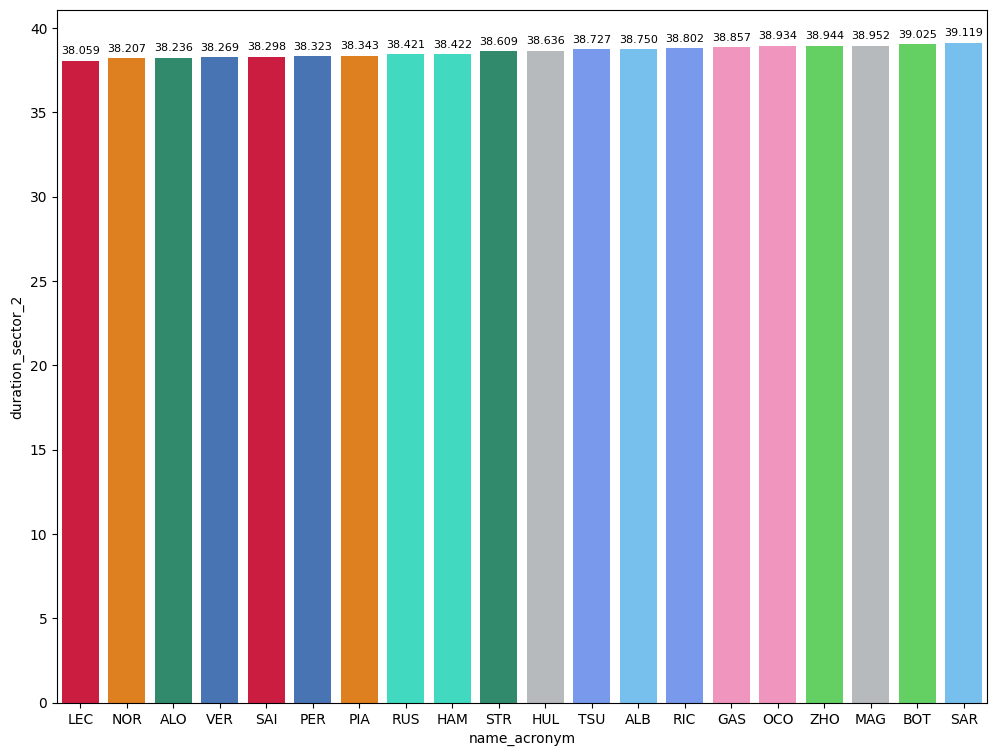

In [169]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

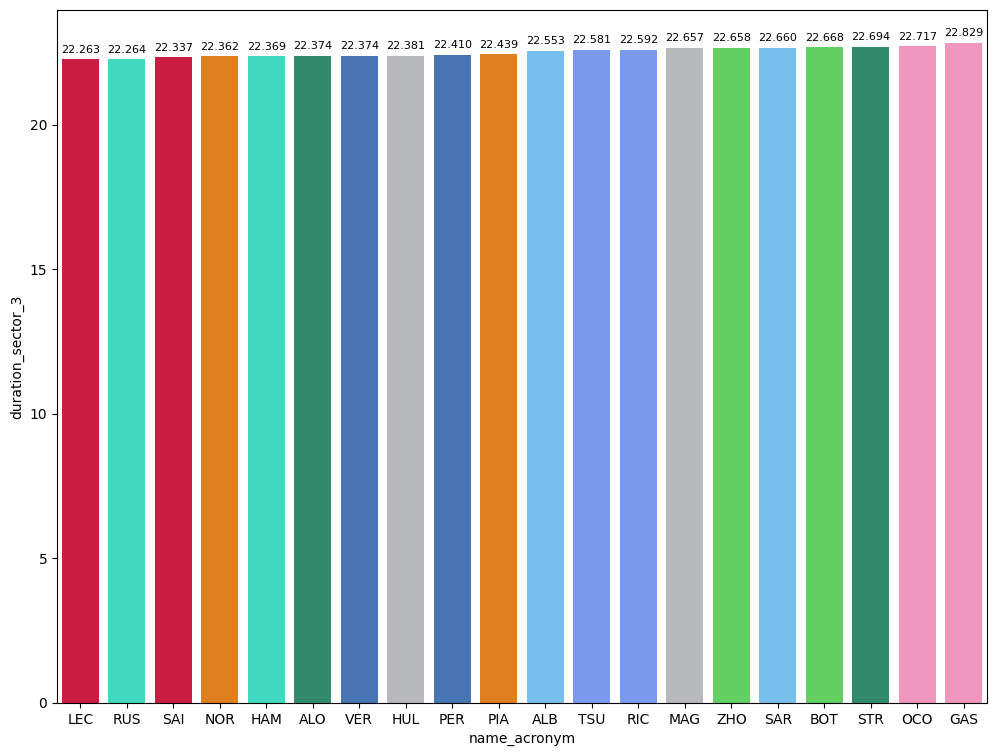

In [170]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Gear shifts of the poleman

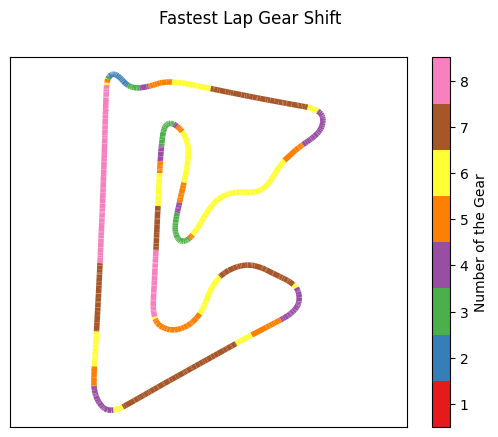

In [171]:
libraryDataF1.show_shifts_poleman(session)

### Comparaison between the poleman and the second

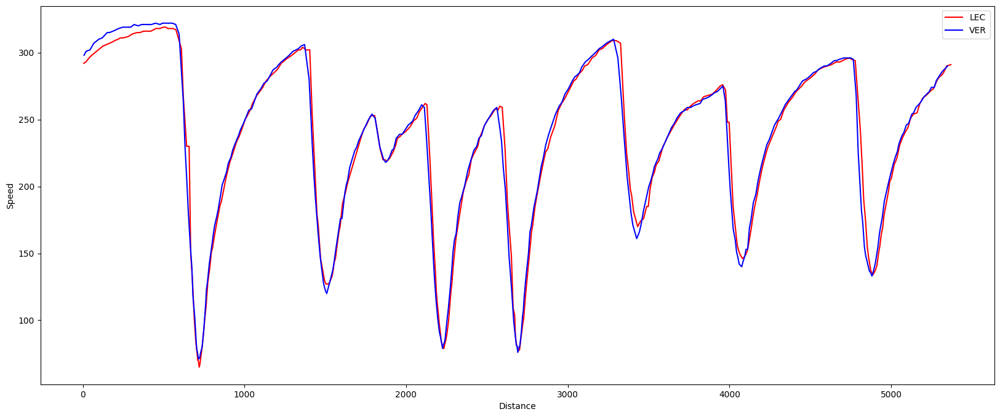

In [172]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

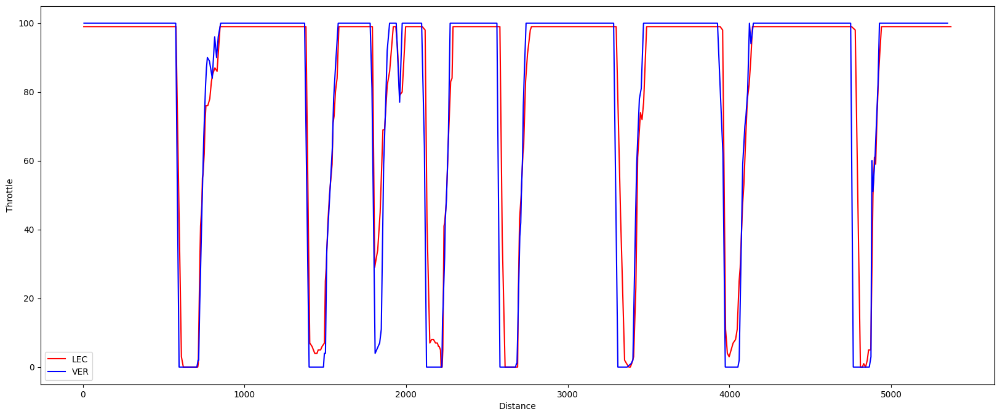

In [173]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

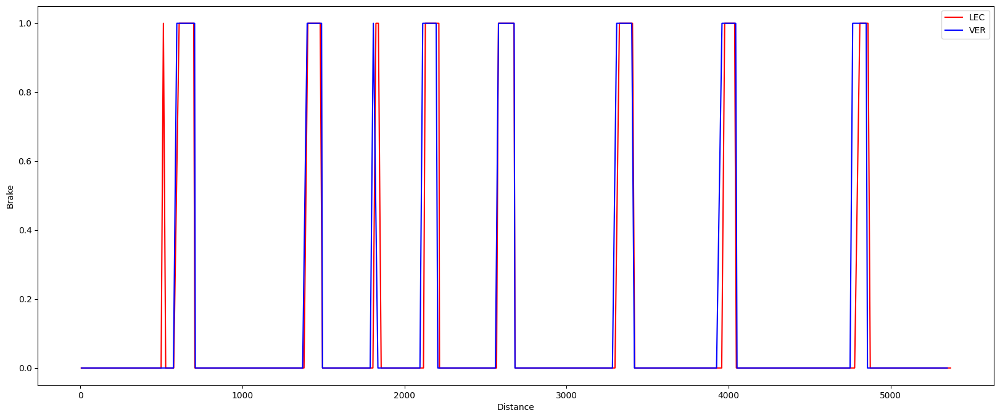

In [174]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

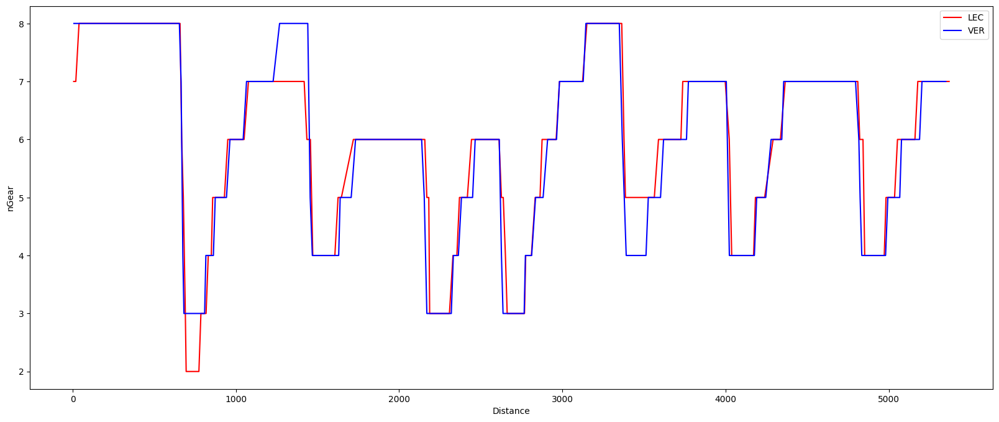

In [175]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [176]:
race = libraryDataF1.obtain_information('laps',session_key=9472)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9472)
drivers = libraryDataF1.obtain_information('drivers',session_key=9472)
libraryDataF1.obtain_drivers_colours(drivers)

In [177]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [178]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Mean pace with the different compound used on the session

In [179]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 98").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,96.157474
HARD,96.517132


### Speed trap

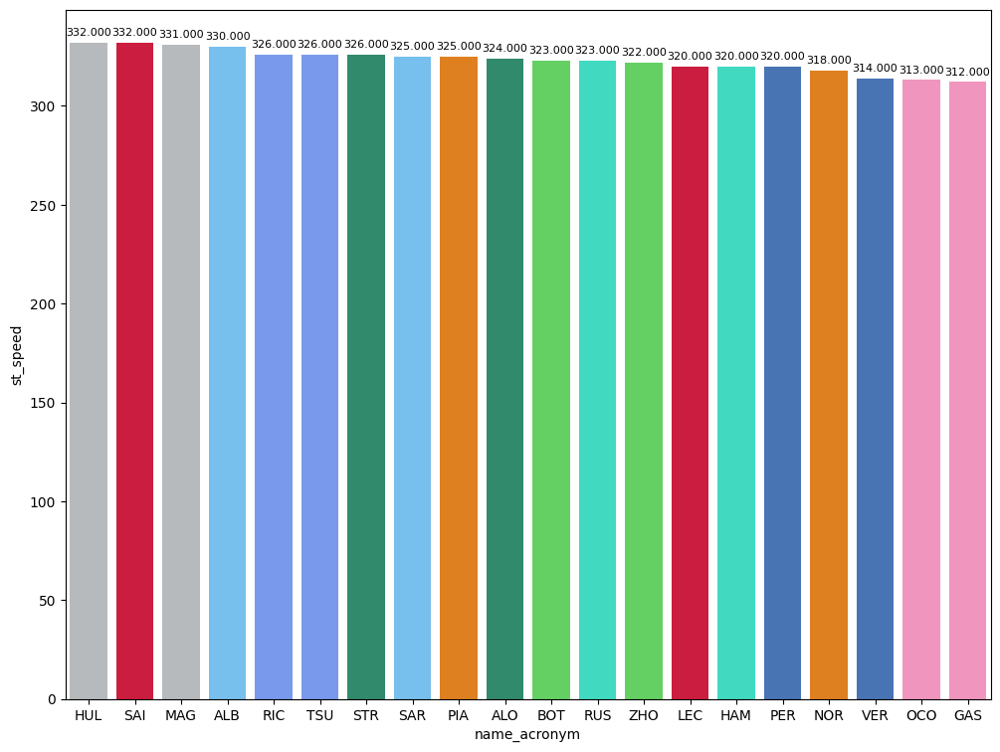

In [180]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

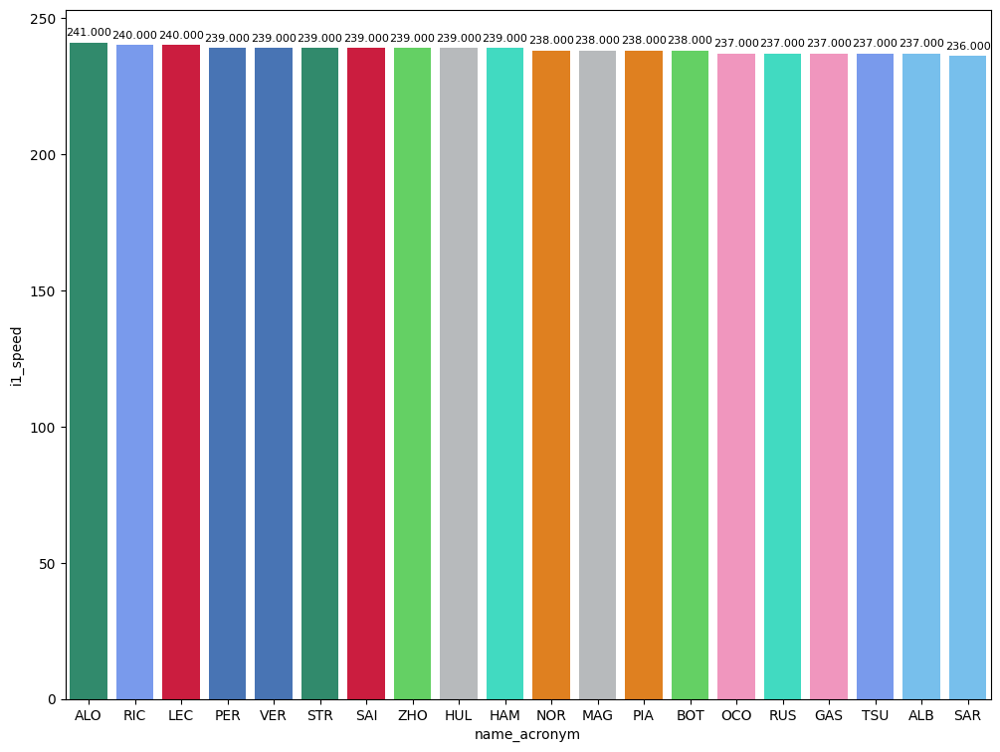

In [181]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

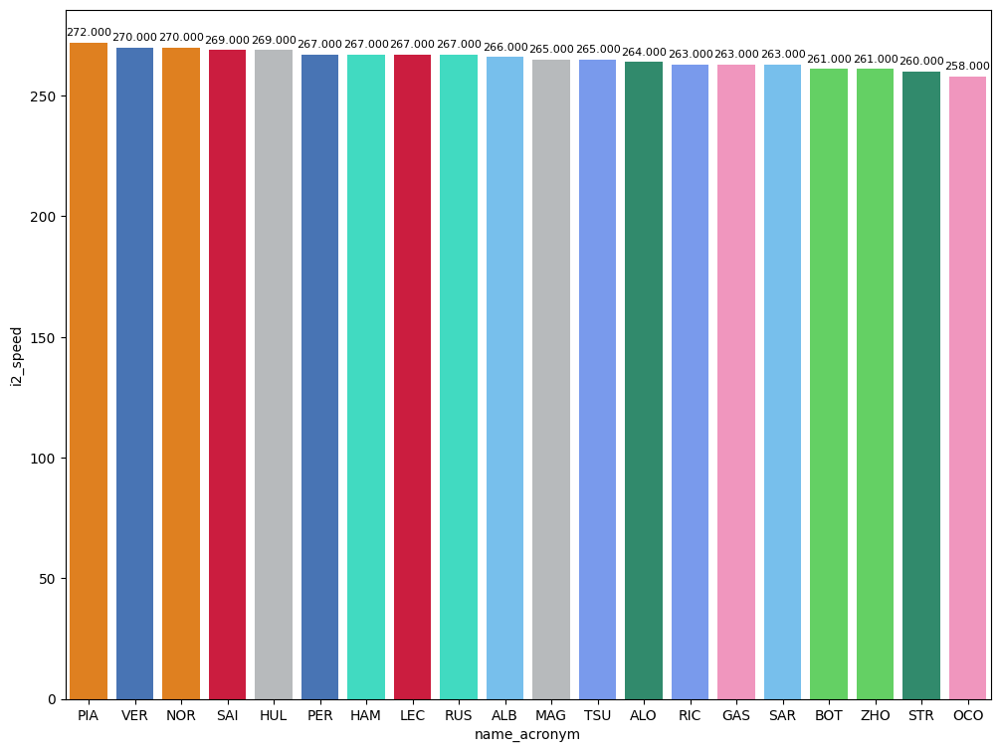

In [182]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Race pace
General explanation
Explanation per teams

In [183]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
Red Bull Racing,96.036305
Ferrari,96.458354
McLaren,96.566759
Mercedes,96.627000
Haas F1 Team,97.289365
Aston Martin,97.317885
RB,97.609435
Alpine,97.682108
Kick Sauber,97.783712


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1
General explanation

In [184]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
Red Bull Racing,30.683102
Ferrari,30.802954
Mercedes,30.812284
McLaren,30.838000
Haas F1 Team,30.883937
Aston Martin,30.942180
RB,31.000710
Kick Sauber,31.105258
Williams,31.141329


#### Sector 2
General explanation

In [185]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
Red Bull Racing,41.571305
McLaren,41.818017
Ferrari,41.879538
Mercedes,42.022000
Haas F1 Team,42.276683
Alpine,42.279831
Aston Martin,42.290000
RB,42.379261
Williams,42.424370


#### Sector 3
General explanation

In [186]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
Ferrari,23.775862
Red Bull Racing,23.781898
Mercedes,23.792716
McLaren,23.910741
Aston Martin,24.085705
Haas F1 Team,24.128746
Alpine,24.190569
Kick Sauber,24.190652
RB,24.229464


### Long runs

In [187]:
MINIMUN_SECONDS = 90
MAXIMUM_SECONDS = 108

#### Red Bull Racing

In [188]:
stintInformation.query('driver_number == 1 or driver_number == 11')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1229,9472,1,11,1,12,SOFT,3
19,1229,9472,1,1,1,17,SOFT,3
32,1229,9472,2,11,13,36,HARD,0
39,1229,9472,2,1,18,37,HARD,0
57,1229,9472,3,11,37,58,SOFT,0
58,1229,9472,3,1,38,58,SOFT,0


In [189]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Max VERSTAPPEN,SOFT,2024-03-02T15:05:20.099000+00:00,2,30.916,41.661,23.719,96.296
39,Max VERSTAPPEN,SOFT,2024-03-02T15:06:56.378000+00:00,3,30.999,41.966,23.788,96.753
59,Max VERSTAPPEN,SOFT,2024-03-02T15:08:33.130000+00:00,4,30.931,41.892,23.824,96.647
79,Max VERSTAPPEN,SOFT,2024-03-02T15:10:09.704000+00:00,5,31.255,42.056,23.862,97.173
99,Max VERSTAPPEN,SOFT,2024-03-02T15:11:46.978000+00:00,6,31.041,42.187,23.864,97.092
119,Max VERSTAPPEN,SOFT,2024-03-02T15:13:24.080000+00:00,7,31.015,42.118,23.905,97.038
139,Max VERSTAPPEN,SOFT,2024-03-02T15:15:01.132000+00:00,8,31.041,42.077,23.906,97.024
159,Max VERSTAPPEN,SOFT,2024-03-02T15:16:38.044000+00:00,9,31.100,42.166,23.963,97.229
179,Max VERSTAPPEN,SOFT,2024-03-02T15:18:15.404000+00:00,10,30.986,42.009,23.965,96.960
197,Max VERSTAPPEN,SOFT,2024-03-02T15:19:52.275000+00:00,11,30.974,42.142,23.969,97.085


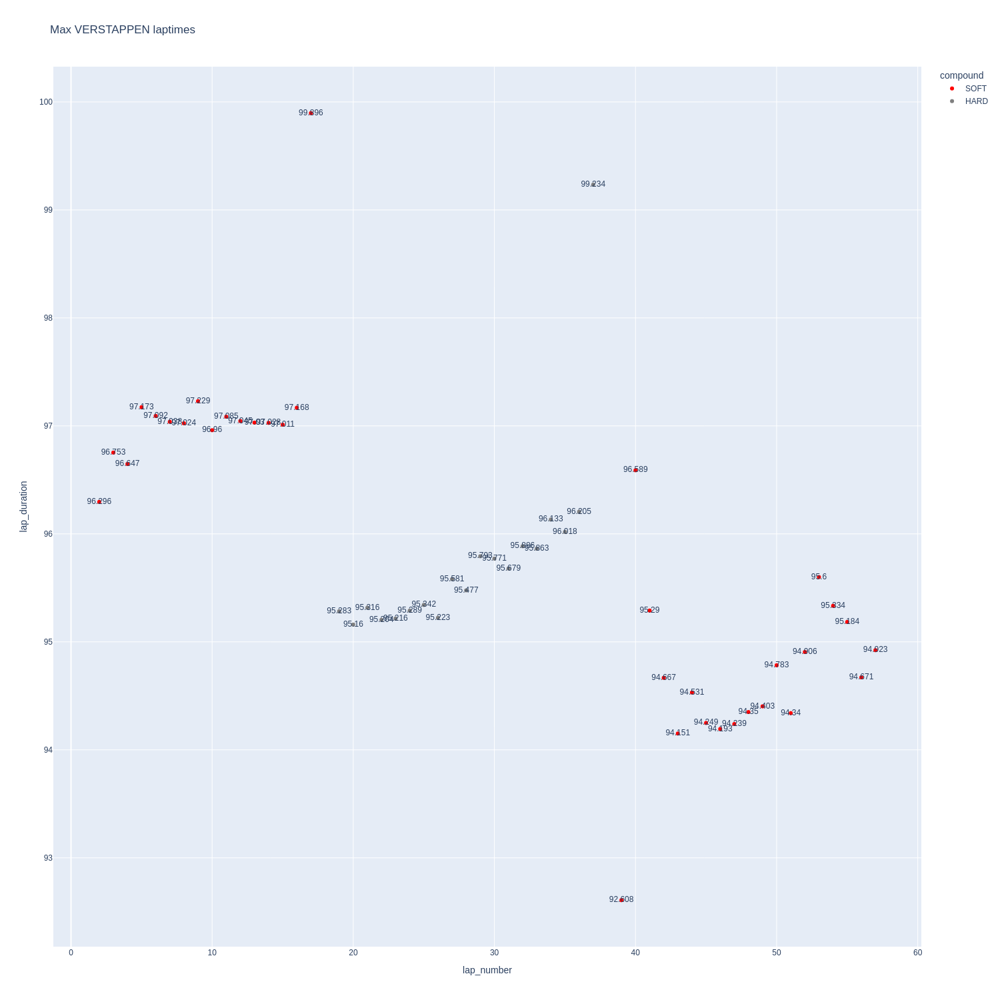

In [190]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

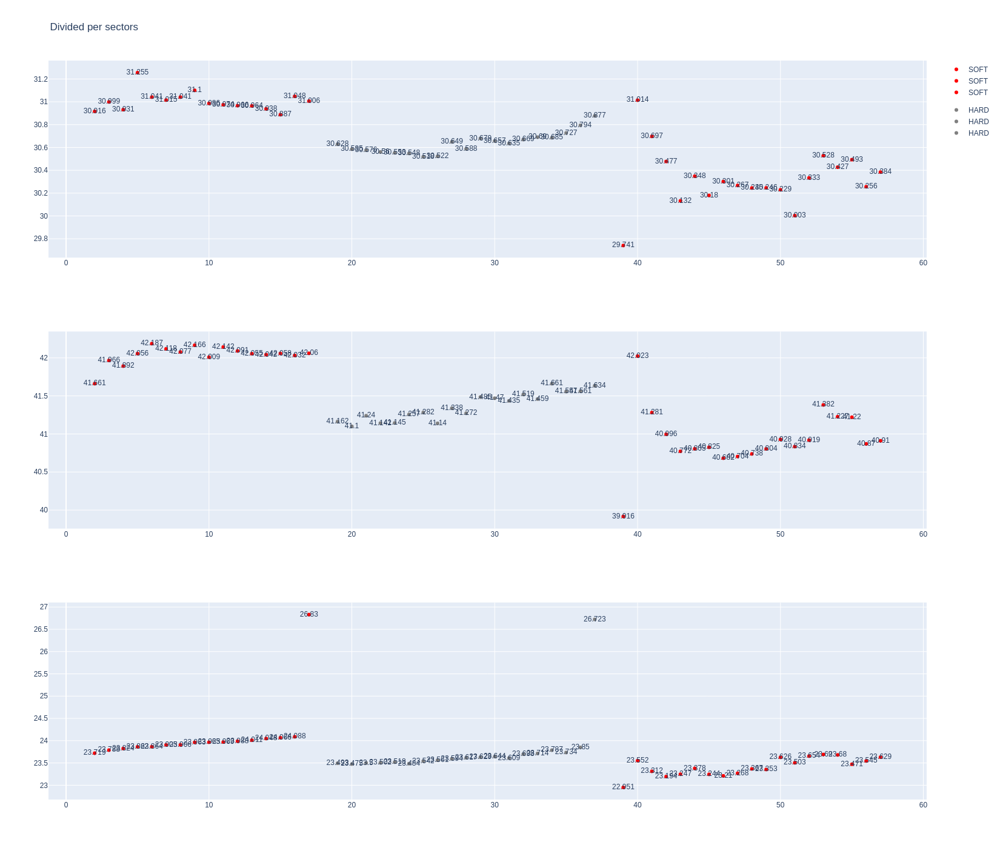

In [191]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [192]:
data = libraryDataF1.getinfolongruns(jointables,11,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
25,Sergio PEREZ,SOFT,2024-03-02T15:05:22.877000+00:00,2,30.678,41.867,23.996,96.541
44,Sergio PEREZ,SOFT,2024-03-02T15:06:59.421000+00:00,3,30.596,42.478,24.223,97.297
64,Sergio PEREZ,SOFT,2024-03-02T15:08:36.682000+00:00,4,30.716,42.623,24.383,97.722
84,Sergio PEREZ,SOFT,2024-03-02T15:10:14.415000+00:00,5,30.997,42.754,24.293,98.044
104,Sergio PEREZ,SOFT,2024-03-02T15:11:52.420000+00:00,6,30.843,42.702,24.278,97.823
124,Sergio PEREZ,SOFT,2024-03-02T15:13:30.334000+00:00,7,31.013,42.682,24.126,97.821
144,Sergio PEREZ,SOFT,2024-03-02T15:15:08.075000+00:00,8,31.305,42.428,24.105,97.838
164,Sergio PEREZ,SOFT,2024-03-02T15:16:45.853000+00:00,9,31.145,42.395,24.056,97.596
184,Sergio PEREZ,SOFT,2024-03-02T15:18:23.551000+00:00,10,31.178,42.322,24.130,97.630
201,Sergio PEREZ,SOFT,2024-03-02T15:20:01.190000+00:00,11,31.054,42.473,24.309,97.836


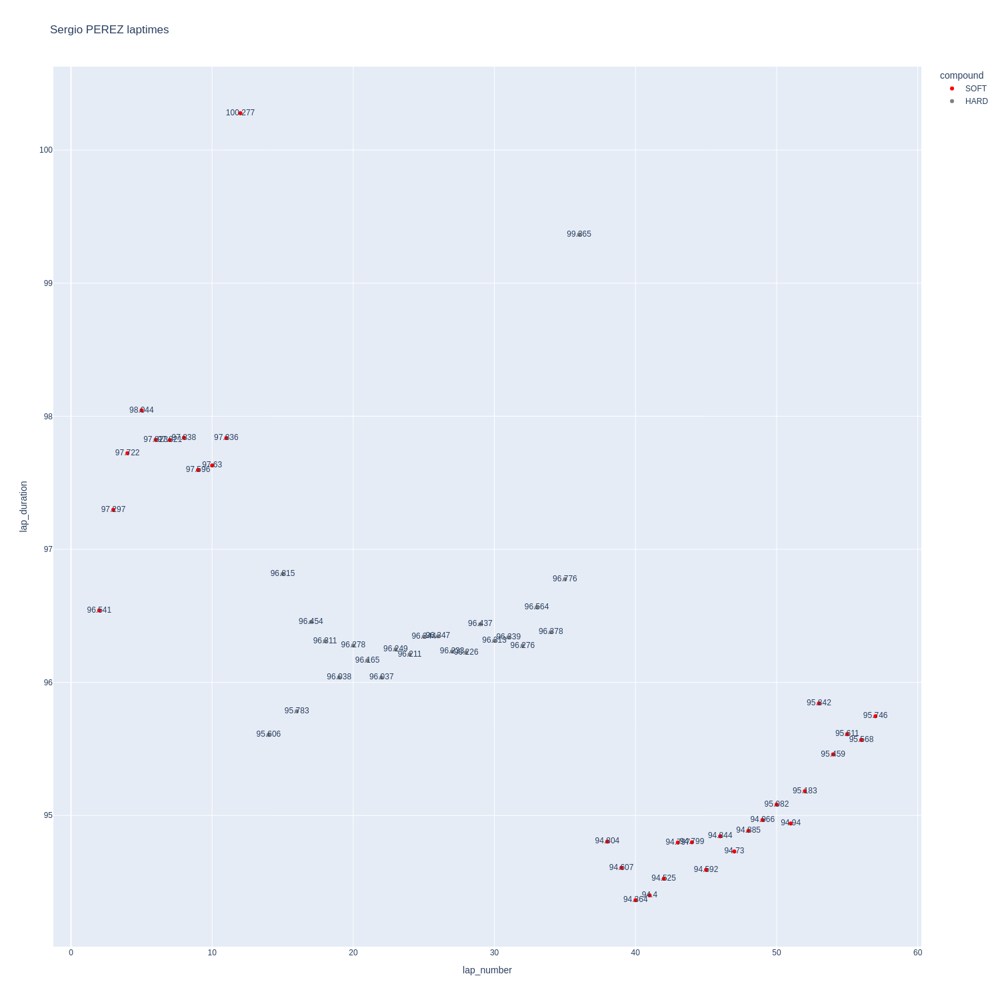

In [193]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

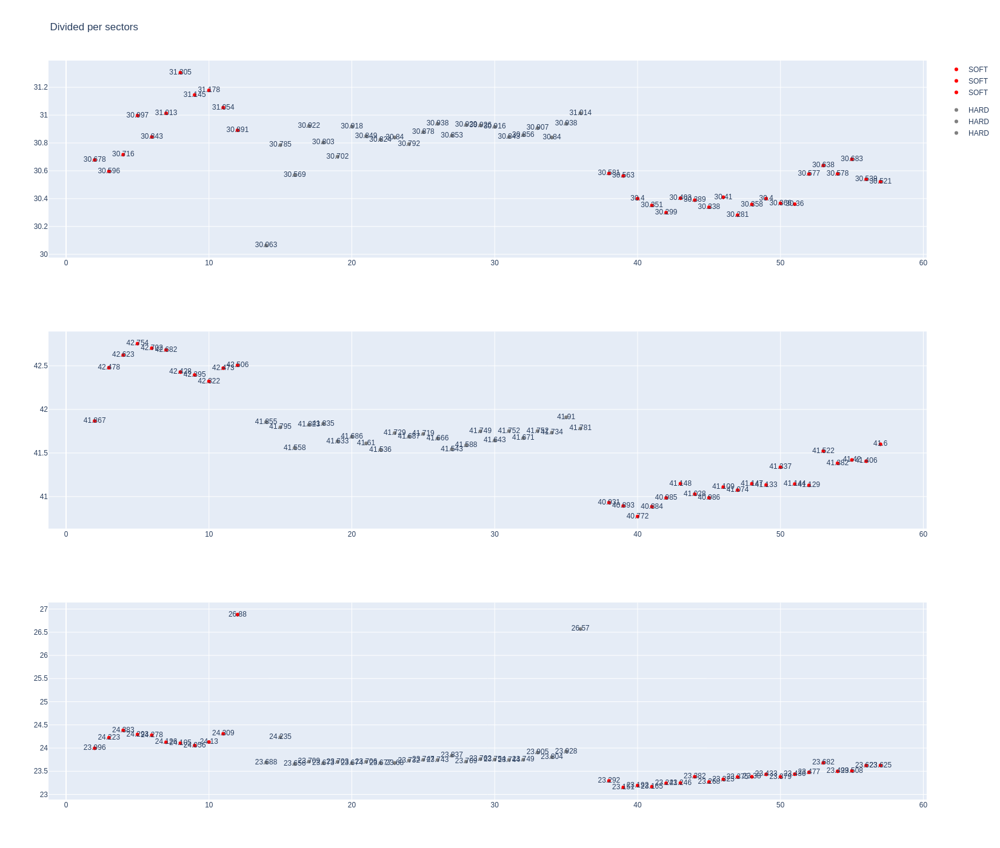

In [194]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [195]:
stintInformation.query('driver_number == 55 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1229,9472,1,16,1,11,SOFT,3
16,1229,9472,1,55,1,14,SOFT,3
27,1229,9472,2,16,12,34,HARD,0
36,1229,9472,2,55,15,35,HARD,0
52,1229,9472,3,16,35,58,HARD,0
55,1229,9472,3,55,36,58,HARD,0


In [196]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
27,Charles LECLERC,SOFT,2024-03-02T15:05:21.019000+00:00,2,31.166,41.864,23.832,96.862
46,Charles LECLERC,SOFT,2024-03-02T15:06:57.933000+00:00,3,31.223,42.856,23.983,98.062
66,Charles LECLERC,SOFT,2024-03-02T15:08:36.013000+00:00,4,30.958,42.784,24.010,97.752
86,Charles LECLERC,SOFT,2024-03-02T15:10:13.780000+00:00,5,31.192,42.872,24.067,98.131
106,Charles LECLERC,SOFT,2024-03-02T15:11:51.804000+00:00,6,30.936,42.751,24.095,97.782
126,Charles LECLERC,SOFT,2024-03-02T15:13:29.724000+00:00,7,31.008,43.761,24.188,98.957
146,Charles LECLERC,SOFT,2024-03-02T15:15:08.572000+00:00,8,31.200,42.753,24.183,98.136
166,Charles LECLERC,SOFT,2024-03-02T15:16:46.813000+00:00,9,31.147,42.533,24.164,97.844
186,Charles LECLERC,SOFT,2024-03-02T15:18:24.582000+00:00,10,30.988,42.534,24.362,97.884
203,Charles LECLERC,SOFT,2024-03-02T15:20:02.545000+00:00,11,32.241,42.647,26.849,101.737


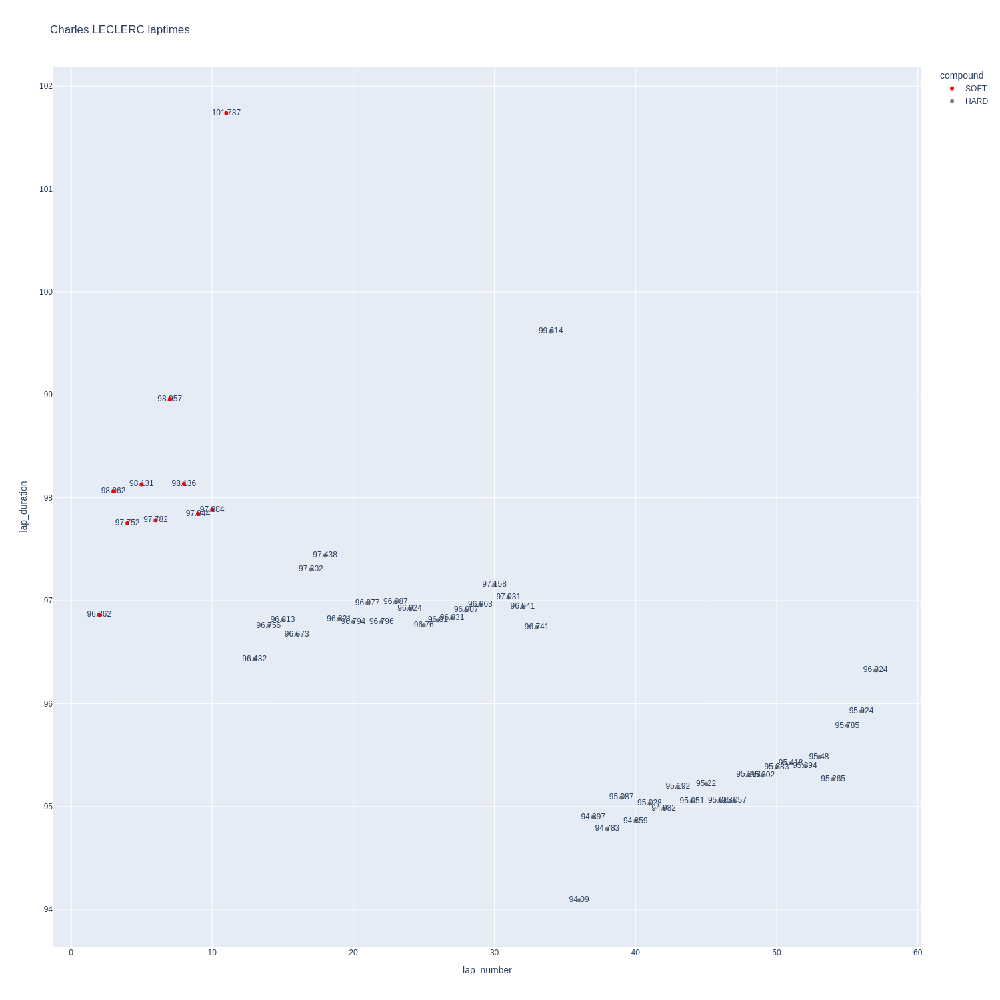

In [197]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

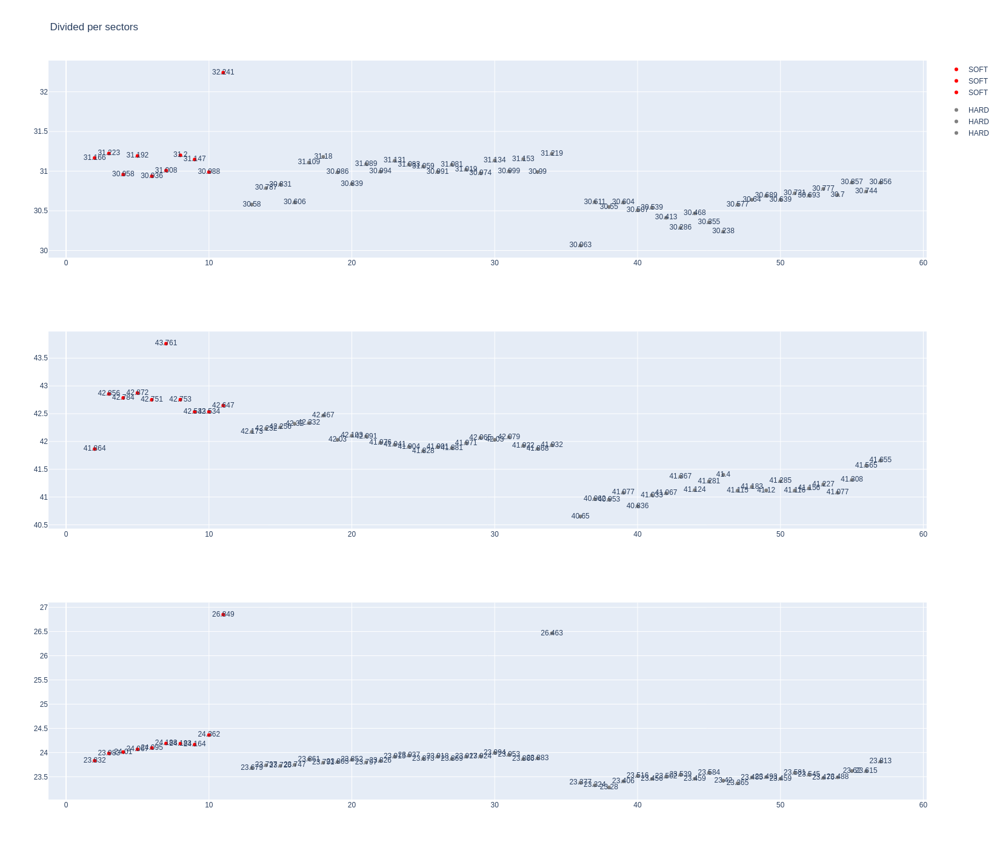

In [198]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [199]:
data = libraryDataF1.getinfolongruns(jointables,55,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
35,Carlos SAINZ,SOFT,2024-03-02T15:05:23.374000+00:00,2,30.974,42.366,23.896,97.236
55,Carlos SAINZ,SOFT,2024-03-02T15:07:00.599000+00:00,3,31.049,42.179,23.852,97.080
75,Carlos SAINZ,SOFT,2024-03-02T15:08:37.735000+00:00,4,30.957,42.373,23.934,97.264
95,Carlos SAINZ,SOFT,2024-03-02T15:10:14.948000+00:00,5,30.967,42.821,24.244,98.032
115,Carlos SAINZ,SOFT,2024-03-02T15:11:53.110000+00:00,6,30.879,42.803,24.059,97.741
135,Carlos SAINZ,SOFT,2024-03-02T15:13:30.813000+00:00,7,30.847,43.148,24.265,98.260
155,Carlos SAINZ,SOFT,2024-03-02T15:15:09.048000+00:00,8,31.341,42.701,24.141,98.183
175,Carlos SAINZ,SOFT,2024-03-02T15:16:47.231000+00:00,9,30.990,42.868,24.172,98.030
193,Carlos SAINZ,SOFT,2024-03-02T15:18:25.188000+00:00,10,30.819,42.638,24.151,97.608
211,Carlos SAINZ,SOFT,2024-03-02T15:20:02.878000+00:00,11,31.266,42.386,24.004,97.656


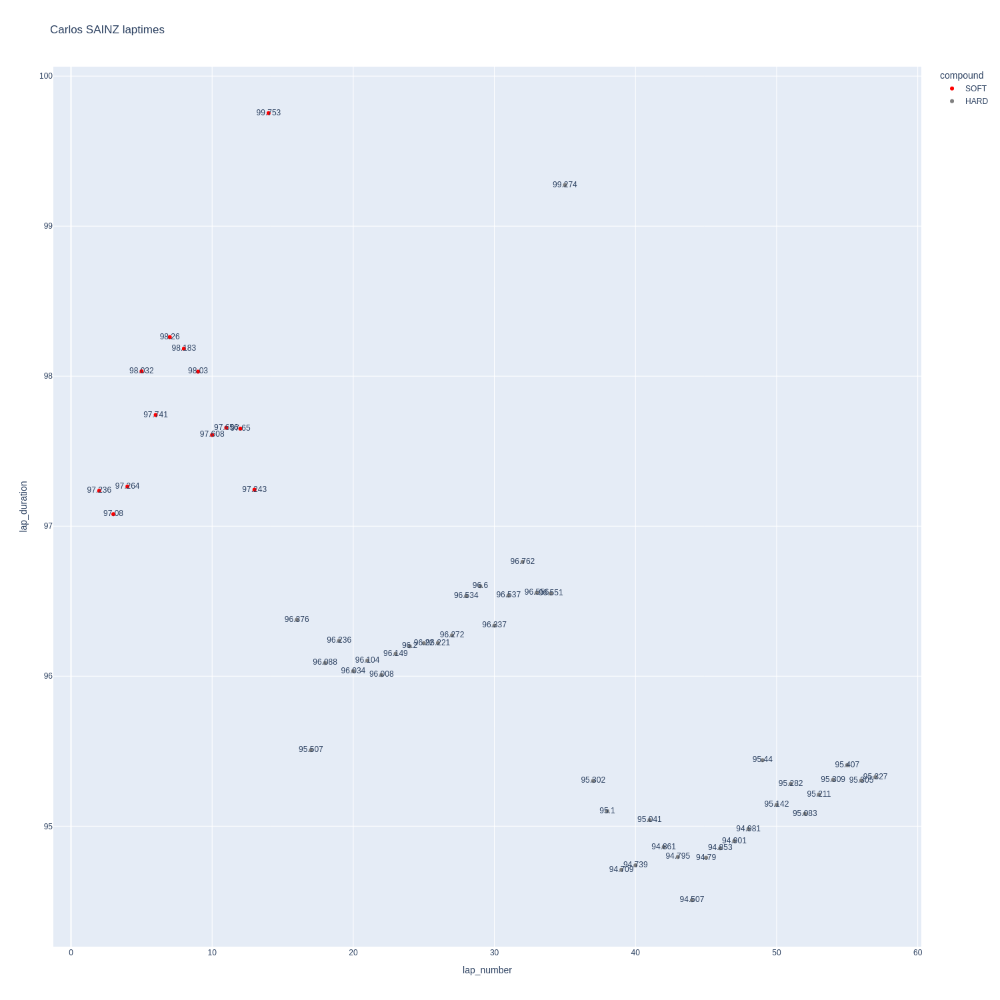

In [200]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

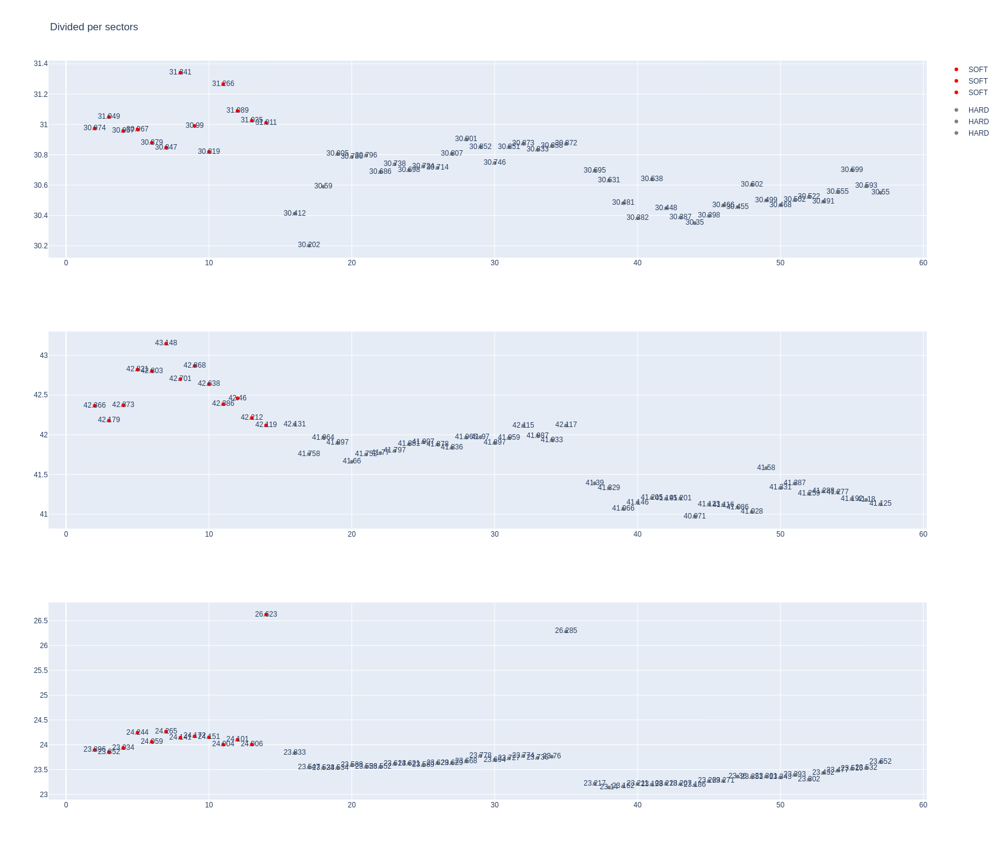

In [201]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [202]:
stintInformation.query('driver_number == 63 or driver_number == 44')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1229,9472,1,63,1,11,SOFT,3
10,1229,9472,1,44,1,12,SOFT,3
25,1229,9472,2,63,12,31,HARD,0
30,1229,9472,2,44,13,33,HARD,0
47,1229,9472,3,63,32,58,HARD,0
50,1229,9472,3,44,34,58,HARD,0


In [203]:
data = libraryDataF1.getinfolongruns(jointables,44,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
34,Lewis HAMILTON,SOFT,2024-03-02T15:05:25.792000+00:00,2,31.287,42.893,24.093,98.273
54,Lewis HAMILTON,SOFT,2024-03-02T15:07:04.200000+00:00,3,31.062,43.099,24.142,98.303
74,Lewis HAMILTON,SOFT,2024-03-02T15:08:42.487000+00:00,4,30.983,43.146,24.158,98.287
94,Lewis HAMILTON,SOFT,2024-03-02T15:10:20.703000+00:00,5,31.140,43.010,24.200,98.350
114,Lewis HAMILTON,SOFT,2024-03-02T15:11:59.143000+00:00,6,31.124,42.887,24.172,98.183
134,Lewis HAMILTON,SOFT,2024-03-02T15:13:37.347000+00:00,7,30.829,42.823,24.187,97.839
154,Lewis HAMILTON,SOFT,2024-03-02T15:15:15.137000+00:00,8,31.079,42.886,24.256,98.221
174,Lewis HAMILTON,SOFT,2024-03-02T15:16:53.452000+00:00,9,31.088,43.171,24.386,98.645
192,Lewis HAMILTON,SOFT,2024-03-02T15:18:32.076000+00:00,10,30.931,42.821,24.285,98.037
210,Lewis HAMILTON,SOFT,2024-03-02T15:20:09.948000+00:00,11,31.279,42.819,24.138,98.236


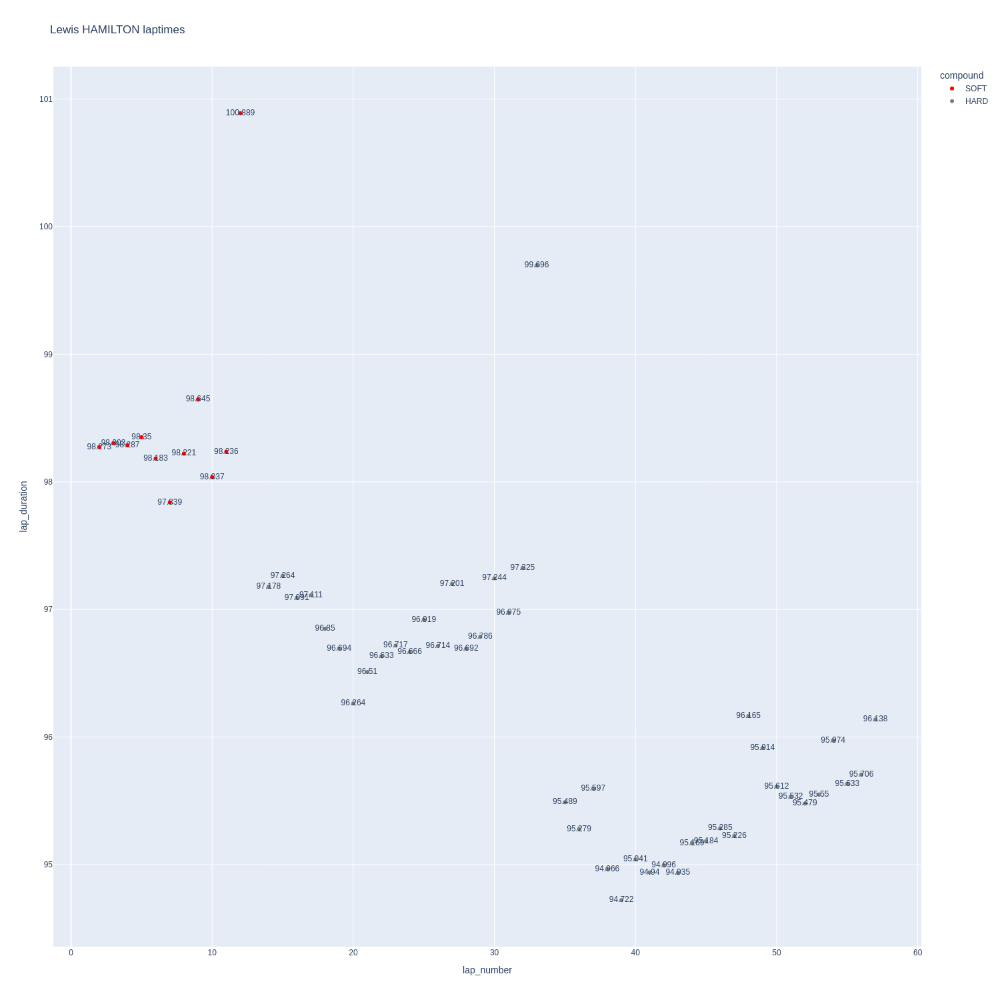

In [204]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

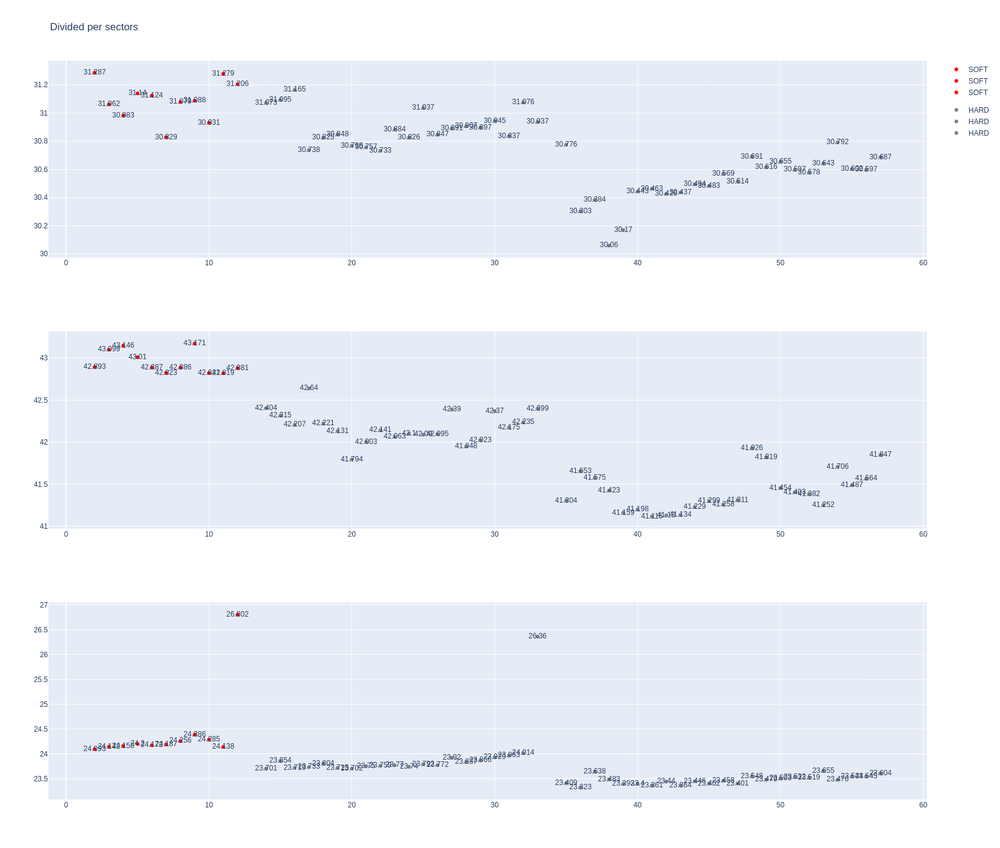

In [205]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [206]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
36,George RUSSELL,SOFT,2024-03-02T15:05:22.022000+00:00,2,30.829,42.038,23.768,96.635
56,George RUSSELL,SOFT,2024-03-02T15:06:58.696000+00:00,3,30.367,42.202,23.837,96.406
76,George RUSSELL,SOFT,2024-03-02T15:08:35.058000+00:00,4,31.135,42.609,23.994,97.738
96,George RUSSELL,SOFT,2024-03-02T15:10:12.768000+00:00,5,31.636,42.573,23.907,98.116
116,George RUSSELL,SOFT,2024-03-02T15:11:50.877000+00:00,6,31.360,42.508,23.916,97.784
136,George RUSSELL,SOFT,2024-03-02T15:13:28.623000+00:00,7,31.480,42.577,24.025,98.082
156,George RUSSELL,SOFT,2024-03-02T15:15:06.812000+00:00,8,31.238,42.646,23.978,97.862
176,George RUSSELL,SOFT,2024-03-02T15:16:44.698000+00:00,9,31.120,42.578,24.032,97.730
194,George RUSSELL,SOFT,2024-03-02T15:18:22.380000+00:00,10,31.247,42.538,23.997,97.782
212,George RUSSELL,SOFT,2024-03-02T15:20:00.058000+00:00,11,31.392,42.646,26.477,100.515


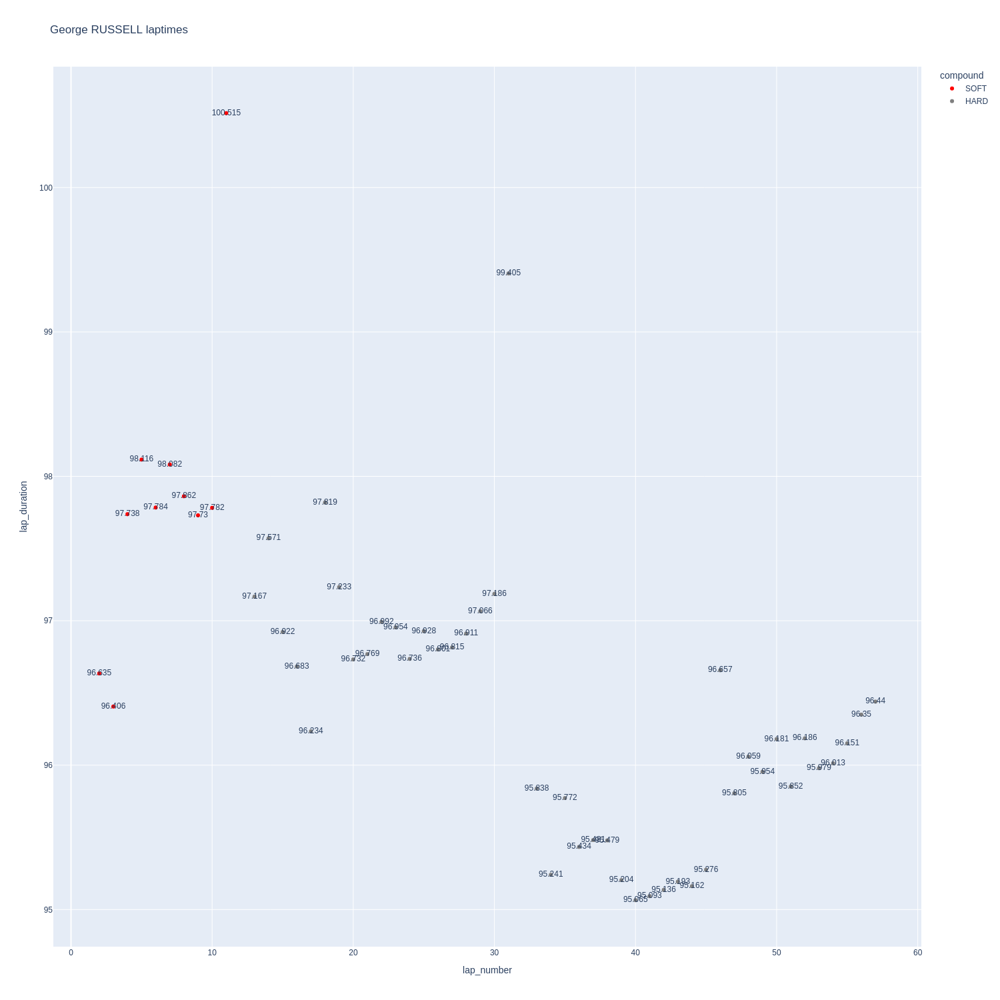

In [207]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

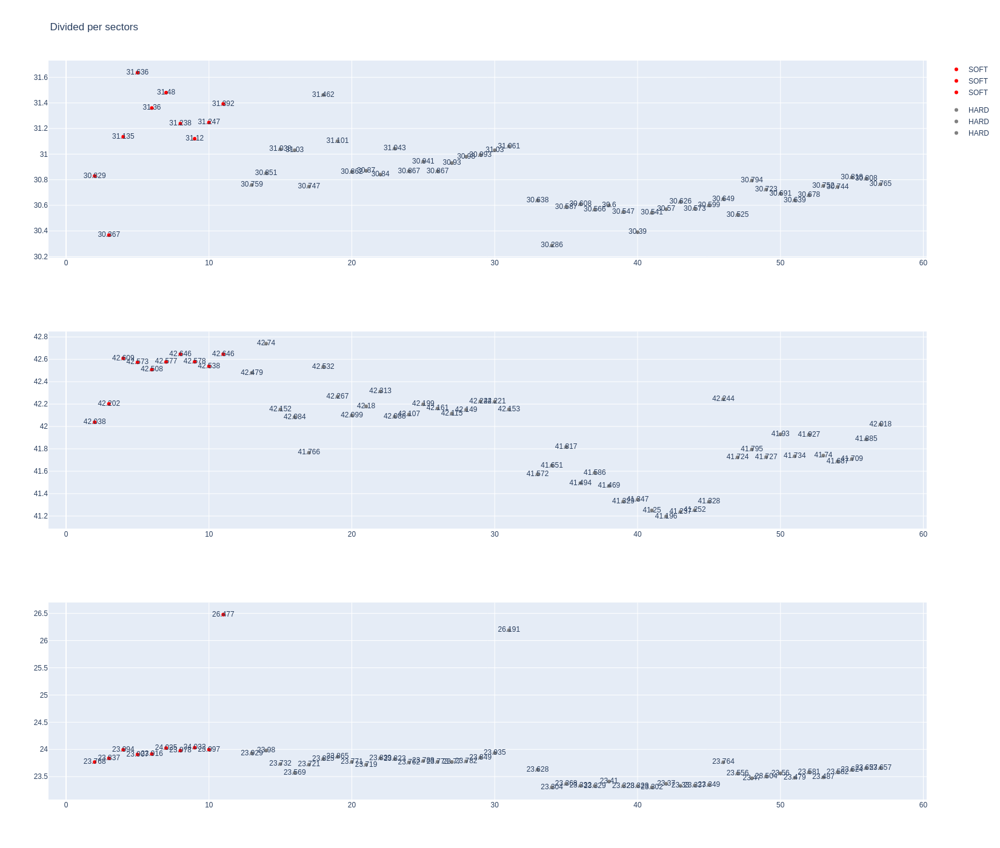

In [208]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [209]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1229,9472,1,81,1,12,SOFT,3
14,1229,9472,1,4,1,13,SOFT,3
31,1229,9472,2,81,13,34,HARD,0
33,1229,9472,2,4,14,33,HARD,0
49,1229,9472,3,4,34,58,HARD,0
53,1229,9472,3,81,35,58,HARD,0


In [210]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
23,Lando NORRIS,SOFT,2024-03-02T15:05:24.936000+00:00,2,31.353,42.618,24.039,98.010
42,Lando NORRIS,SOFT,2024-03-02T15:07:02.960000+00:00,3,31.112,42.476,24.199,97.787
62,Lando NORRIS,SOFT,2024-03-02T15:08:40.628000+00:00,4,31.115,42.193,24.142,97.450
82,Lando NORRIS,SOFT,2024-03-02T15:10:18.228000+00:00,5,31.258,42.379,24.157,97.794
102,Lando NORRIS,SOFT,2024-03-02T15:11:55.985000+00:00,6,31.027,42.622,24.247,97.896
122,Lando NORRIS,SOFT,2024-03-02T15:13:33.929000+00:00,7,31.074,42.514,24.272,97.860
142,Lando NORRIS,SOFT,2024-03-02T15:15:11.730000+00:00,8,31.171,42.688,24.275,98.134
162,Lando NORRIS,SOFT,2024-03-02T15:16:49.846000+00:00,9,31.051,42.721,24.292,98.064
182,Lando NORRIS,SOFT,2024-03-02T15:18:27.948000+00:00,10,31.019,42.563,24.354,97.936
199,Lando NORRIS,SOFT,2024-03-02T15:20:05.925000+00:00,11,31.163,42.740,24.269,98.172


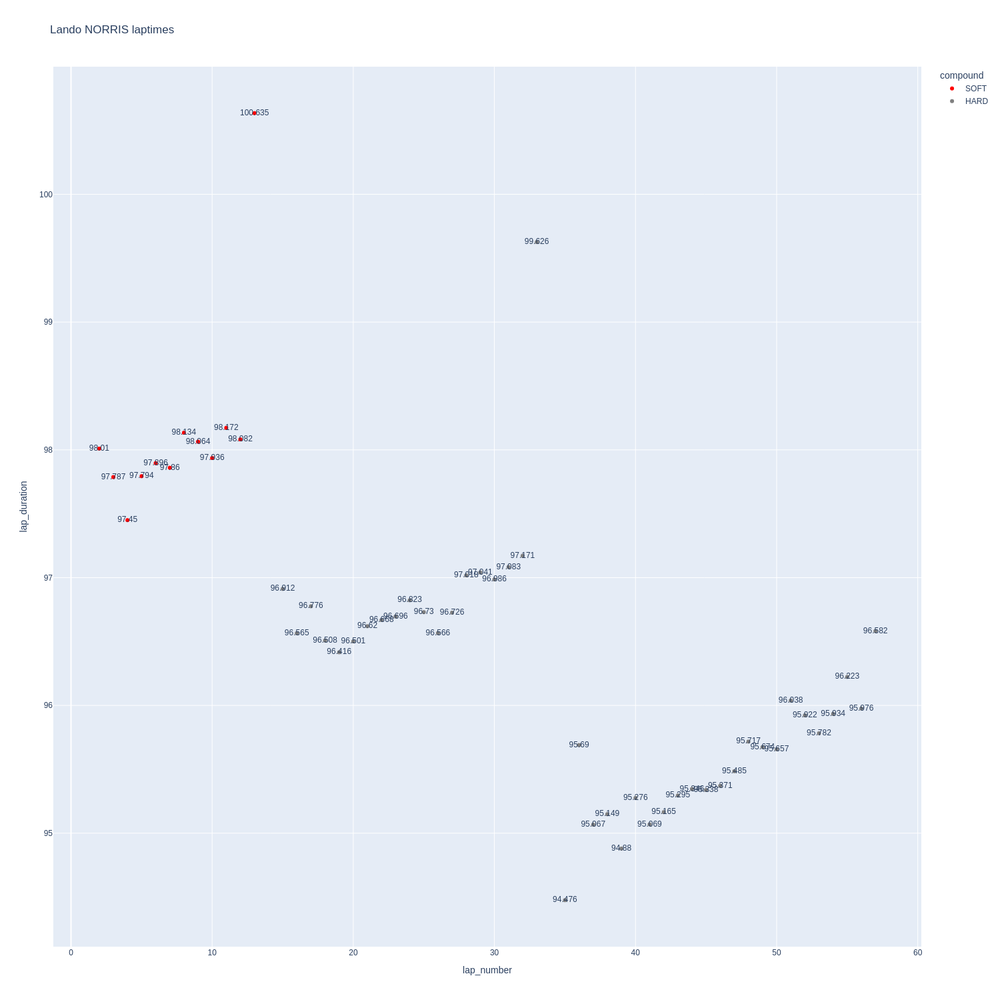

In [211]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

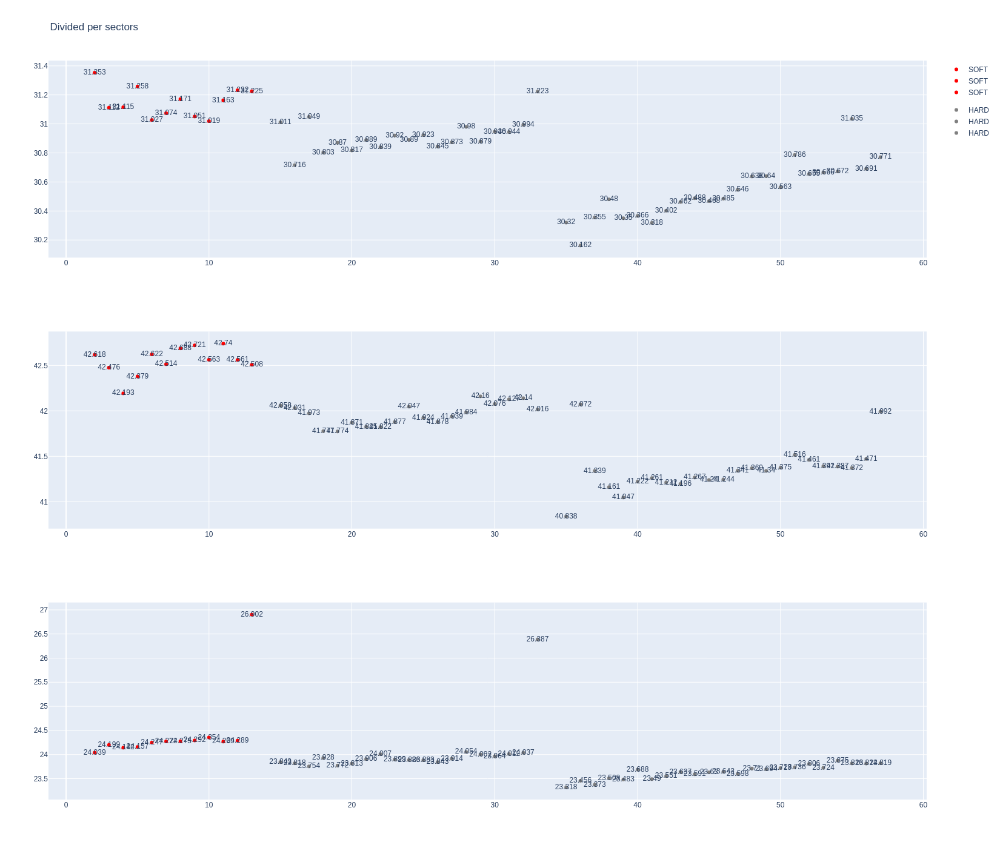

In [212]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [213]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
38,Oscar PIASTRI,SOFT,2024-03-02T15:05:25.300000+00:00,2,31.429,42.789,24.164,98.382
58,Oscar PIASTRI,SOFT,2024-03-02T15:07:03.737000+00:00,3,31.147,42.993,24.118,98.258
78,Oscar PIASTRI,SOFT,2024-03-02T15:08:42.010000+00:00,4,31.113,42.572,24.212,97.897
98,Oscar PIASTRI,SOFT,2024-03-02T15:10:19.912000+00:00,5,30.894,42.780,24.185,97.859
118,Oscar PIASTRI,SOFT,2024-03-02T15:11:57.638000+00:00,6,31.412,42.350,24.193,97.955
138,Oscar PIASTRI,SOFT,2024-03-02T15:13:35.738000+00:00,7,31.164,42.581,24.239,97.984
158,Oscar PIASTRI,SOFT,2024-03-02T15:15:13.609000+00:00,8,31.179,42.533,24.244,97.956
178,Oscar PIASTRI,SOFT,2024-03-02T15:16:51.643000+00:00,9,31.211,42.534,24.351,98.096
196,Oscar PIASTRI,SOFT,2024-03-02T15:18:29.706000+00:00,10,31.294,42.462,24.317,98.073
214,Oscar PIASTRI,SOFT,2024-03-02T15:20:07.846000+00:00,11,31.276,42.727,24.394,98.397


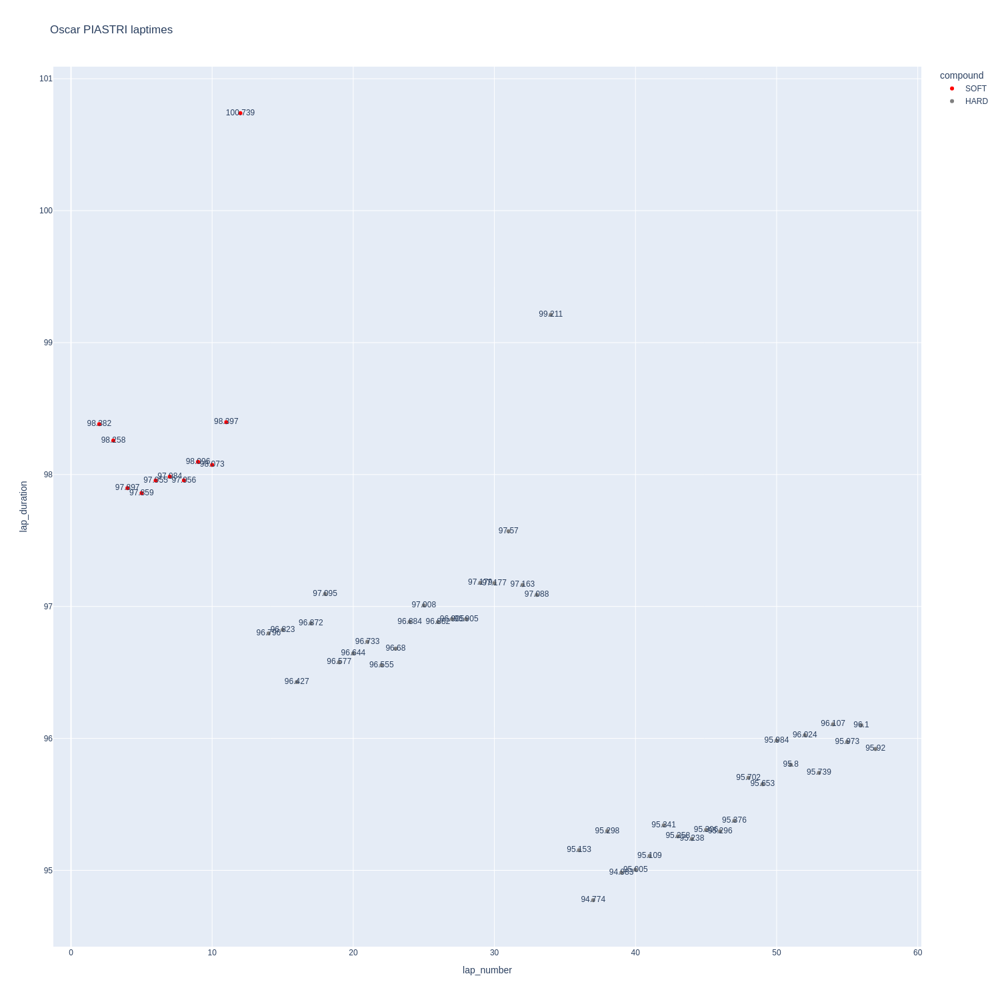

In [214]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

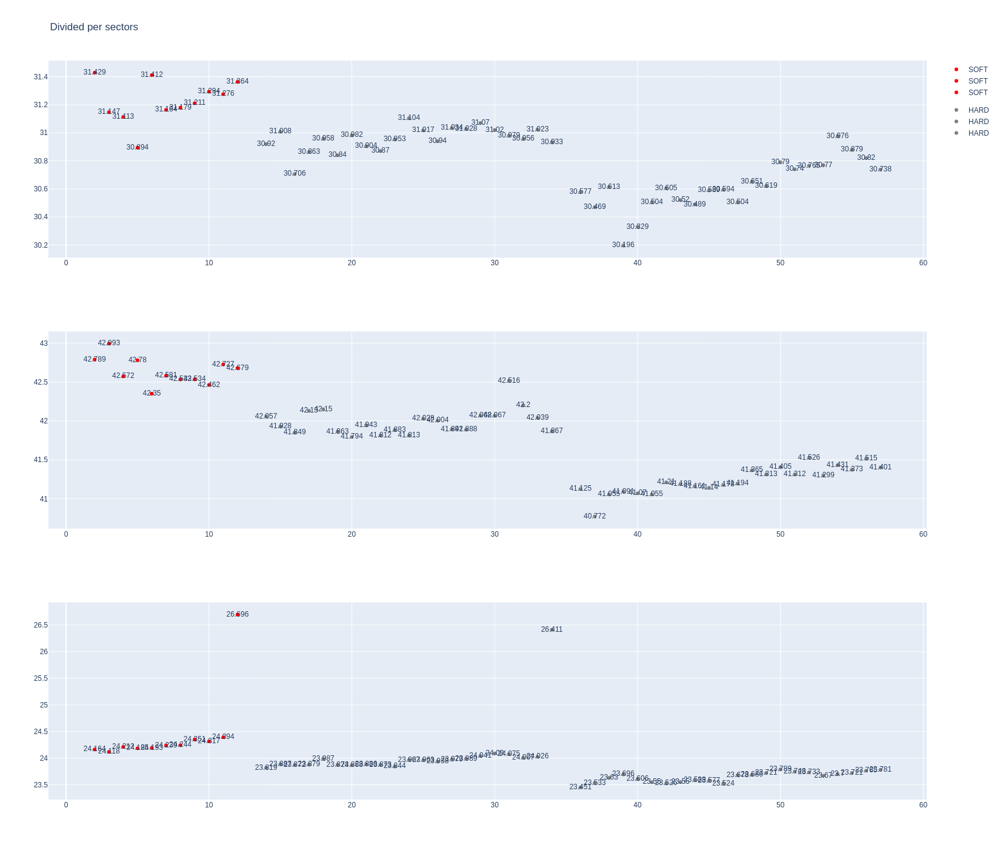

In [215]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [216]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1229,9472,1,18,1,9,SOFT,0
17,1229,9472,1,14,1,15,SOFT,3
21,1229,9472,2,18,10,27,HARD,0
38,1229,9472,2,14,16,41,HARD,0
41,1229,9472,3,18,28,58,HARD,0
61,1229,9472,3,14,42,58,HARD,0


In [217]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
26,Fernando ALONSO,SOFT,2024-03-02T15:05:24.398000+00:00,2,31.203,42.896,23.921,98.020
45,Fernando ALONSO,SOFT,2024-03-02T15:07:02.457000+00:00,3,32.068,42.719,24.259,99.046
65,Fernando ALONSO,SOFT,2024-03-02T15:08:41.450000+00:00,4,30.951,42.580,24.245,97.776
85,Fernando ALONSO,SOFT,2024-03-02T15:10:19.284000+00:00,5,32.063,42.806,24.423,99.292
105,Fernando ALONSO,SOFT,2024-03-02T15:11:58.534000+00:00,6,31.076,42.676,24.301,98.053
125,Fernando ALONSO,SOFT,2024-03-02T15:13:36.615000+00:00,7,30.905,42.700,24.403,98.008
145,Fernando ALONSO,SOFT,2024-03-02T15:15:14.725000+00:00,8,31.024,42.689,24.390,98.103
165,Fernando ALONSO,SOFT,2024-03-02T15:16:52.794000+00:00,9,31.464,43.036,24.396,98.896
185,Fernando ALONSO,SOFT,2024-03-02T15:18:31.590000+00:00,10,31.635,43.162,24.528,99.325
202,Fernando ALONSO,SOFT,2024-03-02T15:20:11.035000+00:00,11,31.043,42.972,24.539,98.554


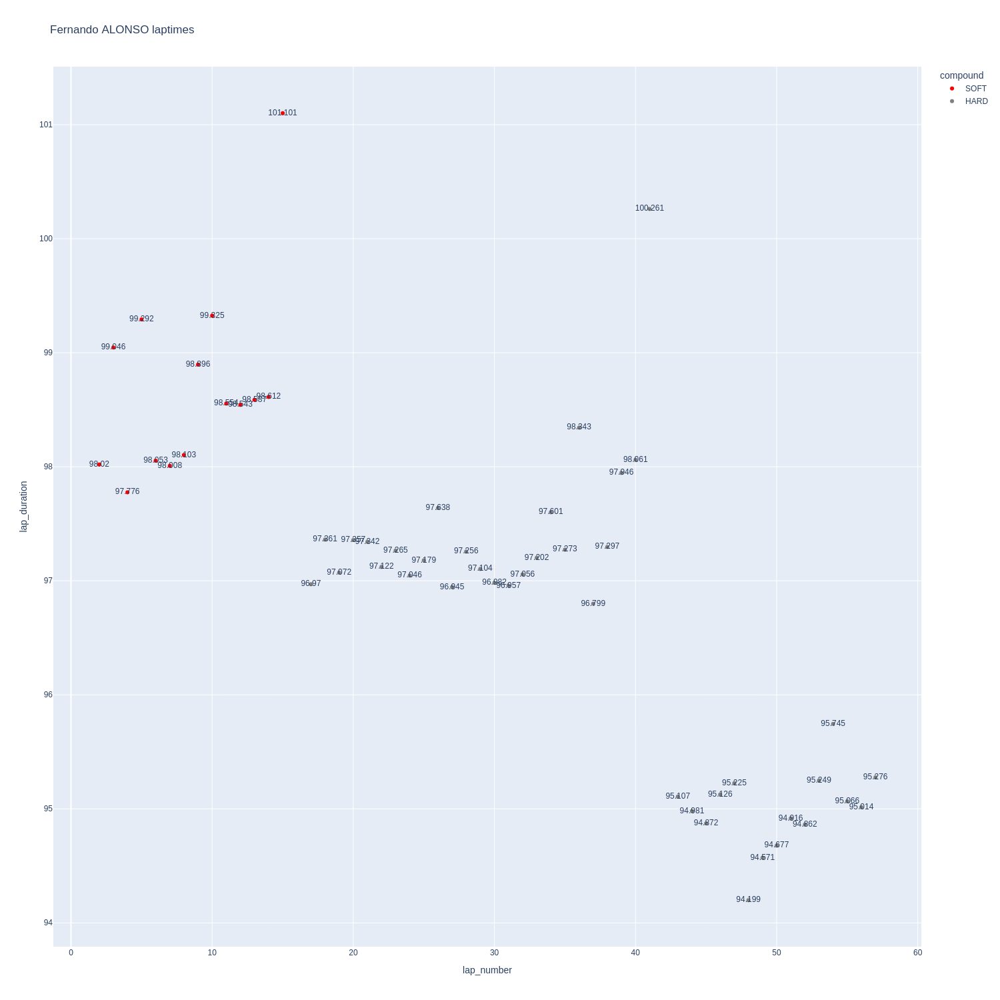

In [218]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

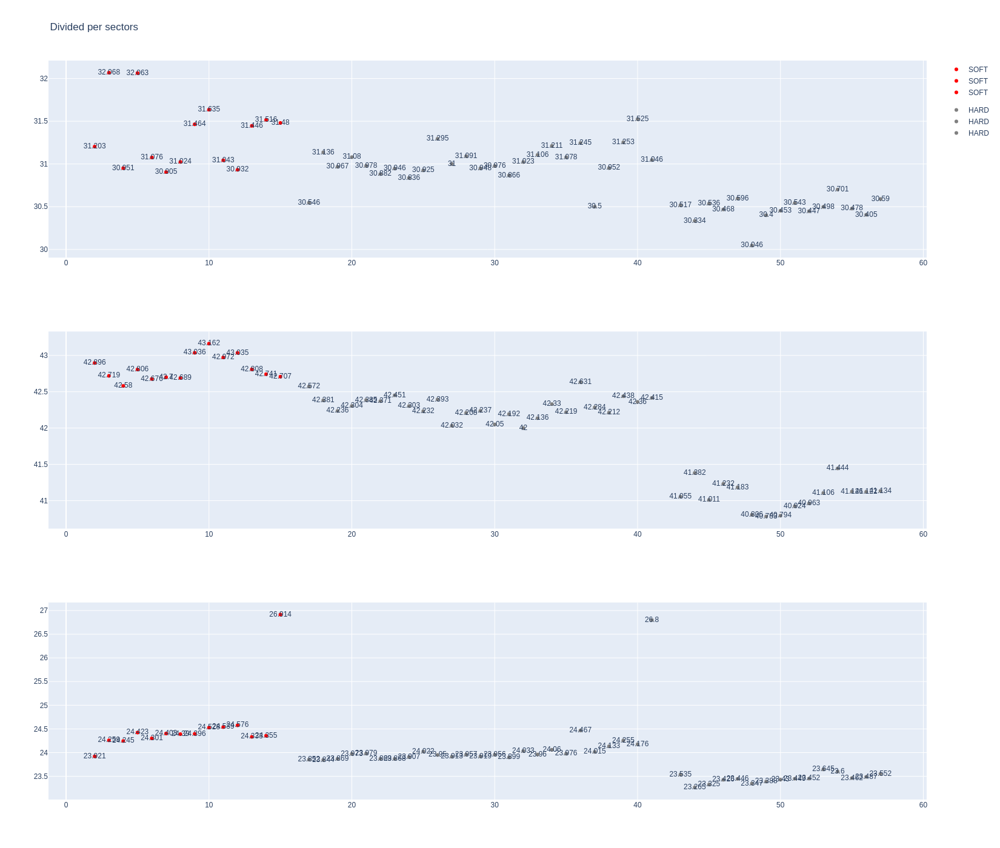

In [219]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [220]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
28,Lance STROLL,SOFT,2024-03-02T15:05:32.877000+00:00,2,31.319,42.653,24.015,97.987
47,Lance STROLL,SOFT,2024-03-02T15:07:11.091000+00:00,3,31.279,42.790,24.210,98.279
67,Lance STROLL,SOFT,2024-03-02T15:08:49.291000+00:00,4,30.944,43.227,24.193,98.364
87,Lance STROLL,SOFT,2024-03-02T15:10:27.632000+00:00,5,30.987,43.577,24.161,98.725
107,Lance STROLL,SOFT,2024-03-02T15:12:06.338000+00:00,6,31.554,43.188,24.183,98.925
127,Lance STROLL,SOFT,2024-03-02T15:13:45.354000+00:00,7,31.302,43.186,24.281,98.769
147,Lance STROLL,SOFT,2024-03-02T15:15:24.026000+00:00,8,30.963,43.370,24.524,98.857
167,Lance STROLL,SOFT,2024-03-02T15:17:02.856000+00:00,9,31.431,43.451,27.230,102.112
204,Lance STROLL,HARD,2024-03-02T15:20:42.802000+00:00,11,30.684,42.077,23.733,96.494
222,Lance STROLL,HARD,2024-03-02T15:22:19.385000+00:00,12,30.961,42.338,23.876,97.175


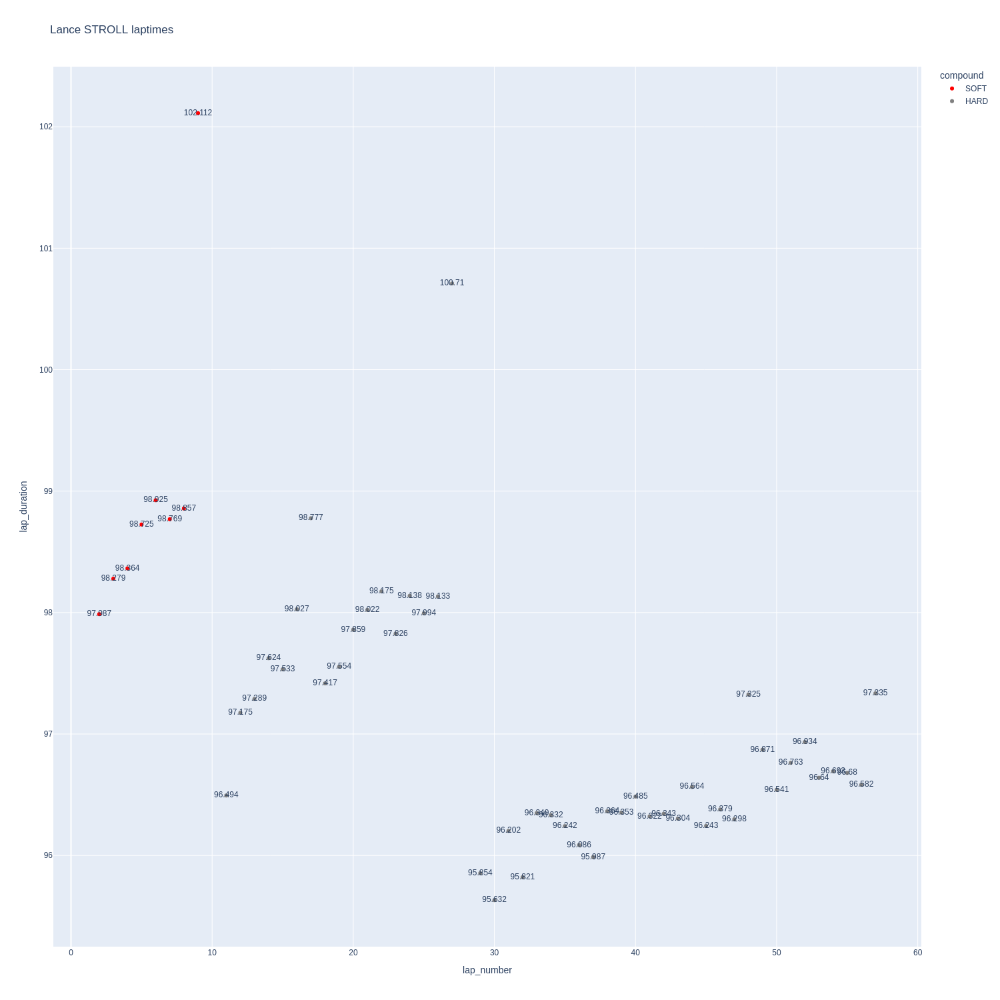

In [221]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

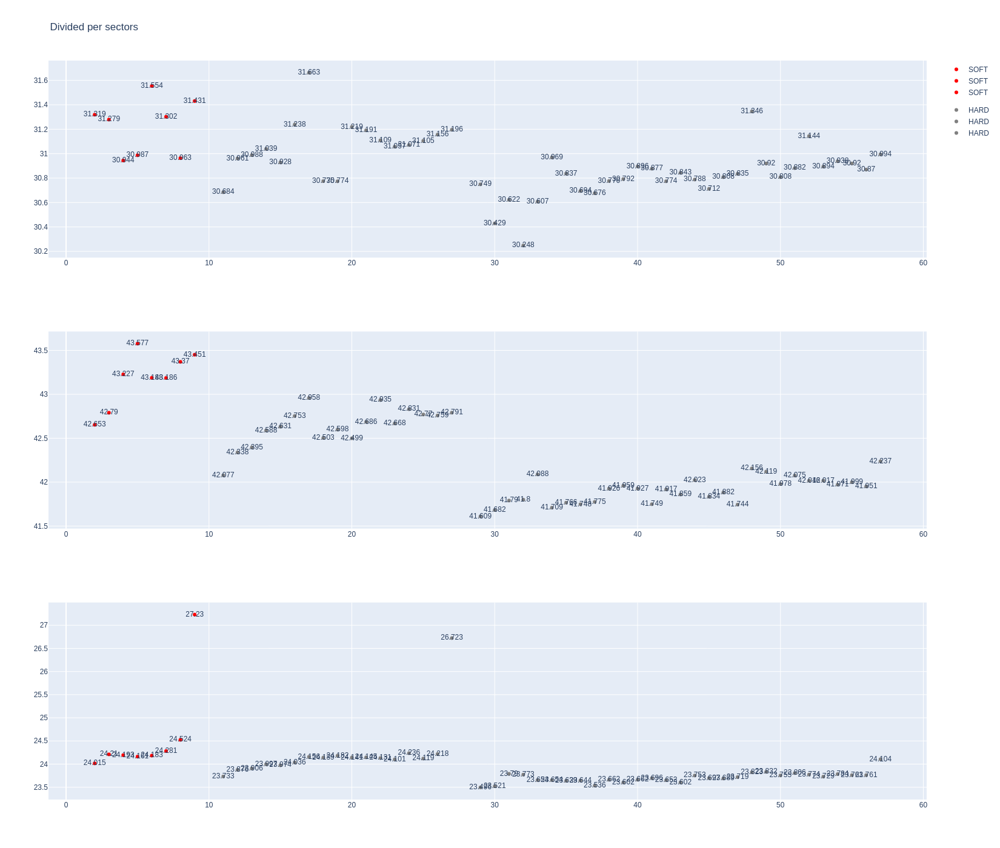

In [222]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [223]:
stintInformation.query('driver_number == 3 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
13,1229,9472,1,3,1,13,SOFT,3
15,1229,9472,1,22,1,14,SOFT,0
34,1229,9472,2,3,14,35,HARD,0
35,1229,9472,2,22,15,34,HARD,0
51,1229,9472,3,22,35,57,HARD,0
54,1229,9472,3,3,36,57,SOFT,0


In [224]:
data = libraryDataF1.getinfolongruns(jointables,3,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
22,Daniel RICCIARDO,SOFT,2024-03-02T15:05:28.518000+00:00,2,31.662,43.353,24.494,99.509
41,Daniel RICCIARDO,SOFT,2024-03-02T15:07:07.994000+00:00,3,30.965,43.320,24.475,98.760
61,Daniel RICCIARDO,SOFT,2024-03-02T15:08:46.663000+00:00,4,30.922,43.207,24.481,98.610
81,Daniel RICCIARDO,SOFT,2024-03-02T15:10:25.323000+00:00,5,30.980,43.200,24.524,98.704
101,Daniel RICCIARDO,SOFT,2024-03-02T15:12:03.968000+00:00,6,31.046,43.099,24.544,98.689
121,Daniel RICCIARDO,SOFT,2024-03-02T15:13:42.734000+00:00,7,31.372,43.289,24.532,99.193
141,Daniel RICCIARDO,SOFT,2024-03-02T15:15:21.929000+00:00,8,31.254,43.578,24.697,99.529
161,Daniel RICCIARDO,SOFT,2024-03-02T15:17:01.403000+00:00,9,31.173,43.519,24.646,99.338
181,Daniel RICCIARDO,SOFT,2024-03-02T15:18:40.795000+00:00,10,31.211,43.104,24.467,98.782
198,Daniel RICCIARDO,SOFT,2024-03-02T15:20:19.592000+00:00,11,31.472,43.080,24.481,99.033


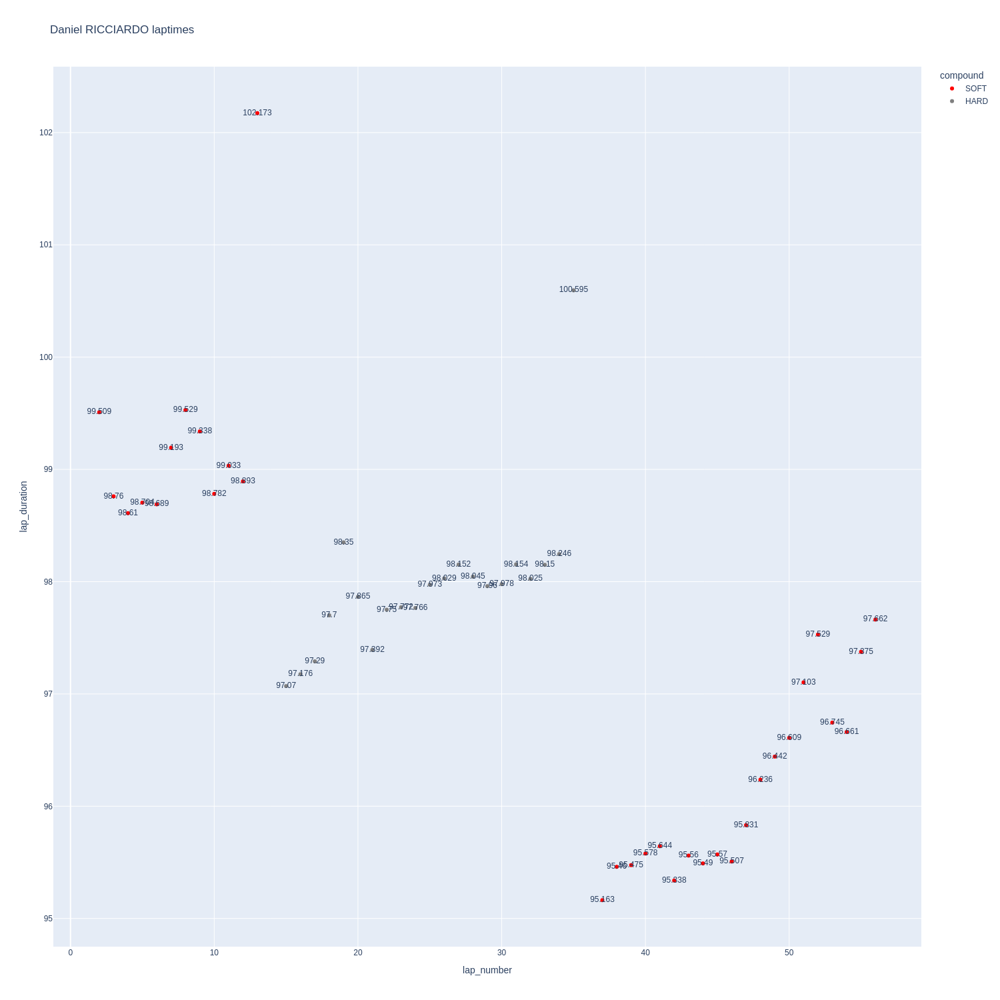

In [225]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

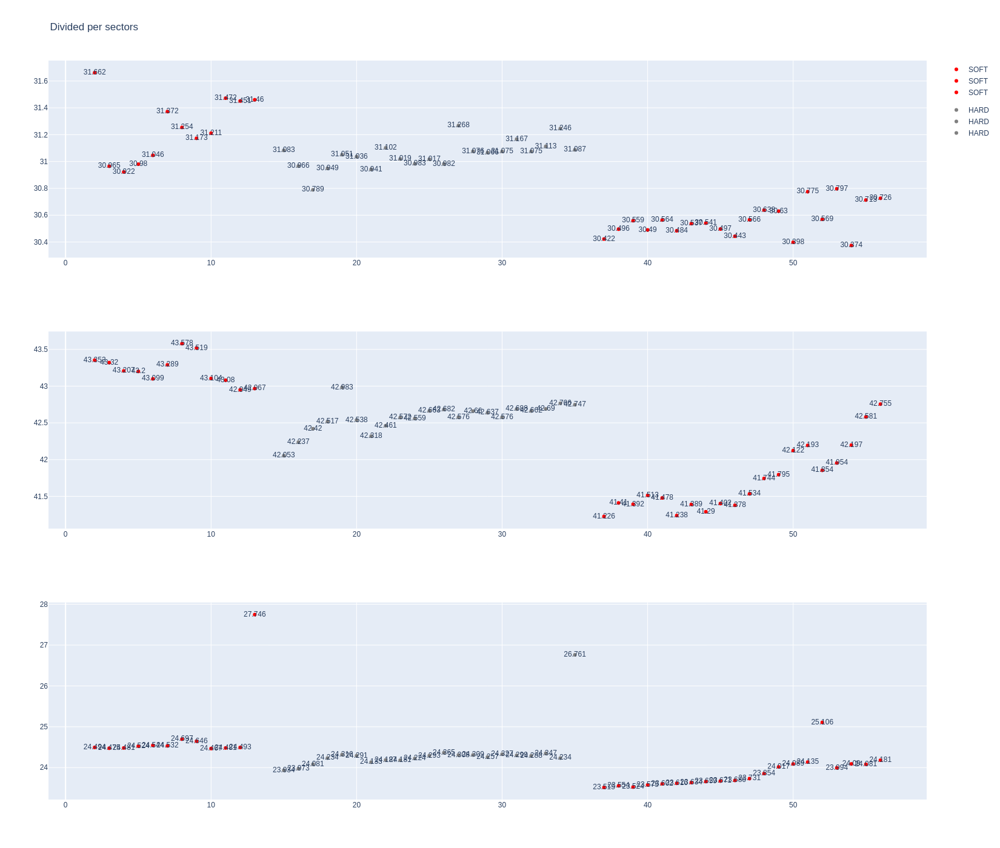

In [226]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [227]:
data = libraryDataF1.getinfolongruns(jointables,22,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
30,Yuki TSUNODA,SOFT,2024-03-02T15:05:26.188000+00:00,2,31.675,42.717,24.297,98.689
49,Yuki TSUNODA,SOFT,2024-03-02T15:07:04.993000+00:00,3,30.989,43.073,24.369,98.431
69,Yuki TSUNODA,SOFT,2024-03-02T15:08:43.327000+00:00,4,31.025,42.992,24.293,98.310
89,Yuki TSUNODA,SOFT,2024-03-02T15:10:21.674000+00:00,5,31.023,42.980,24.318,98.321
109,Yuki TSUNODA,SOFT,2024-03-02T15:12:00.082000+00:00,6,31.132,42.949,24.280,98.361
129,Yuki TSUNODA,SOFT,2024-03-02T15:13:38.399000+00:00,7,31.121,42.887,24.356,98.364
149,Yuki TSUNODA,SOFT,2024-03-02T15:15:16.764000+00:00,8,31.298,42.871,24.344,98.513
169,Yuki TSUNODA,SOFT,2024-03-02T15:16:55.234000+00:00,9,31.329,42.861,24.364,98.554
188,Yuki TSUNODA,SOFT,2024-03-02T15:18:33.869000+00:00,10,31.476,43.062,24.374,98.912
206,Yuki TSUNODA,SOFT,2024-03-02T15:20:12.682000+00:00,11,31.342,43.015,24.442,98.799


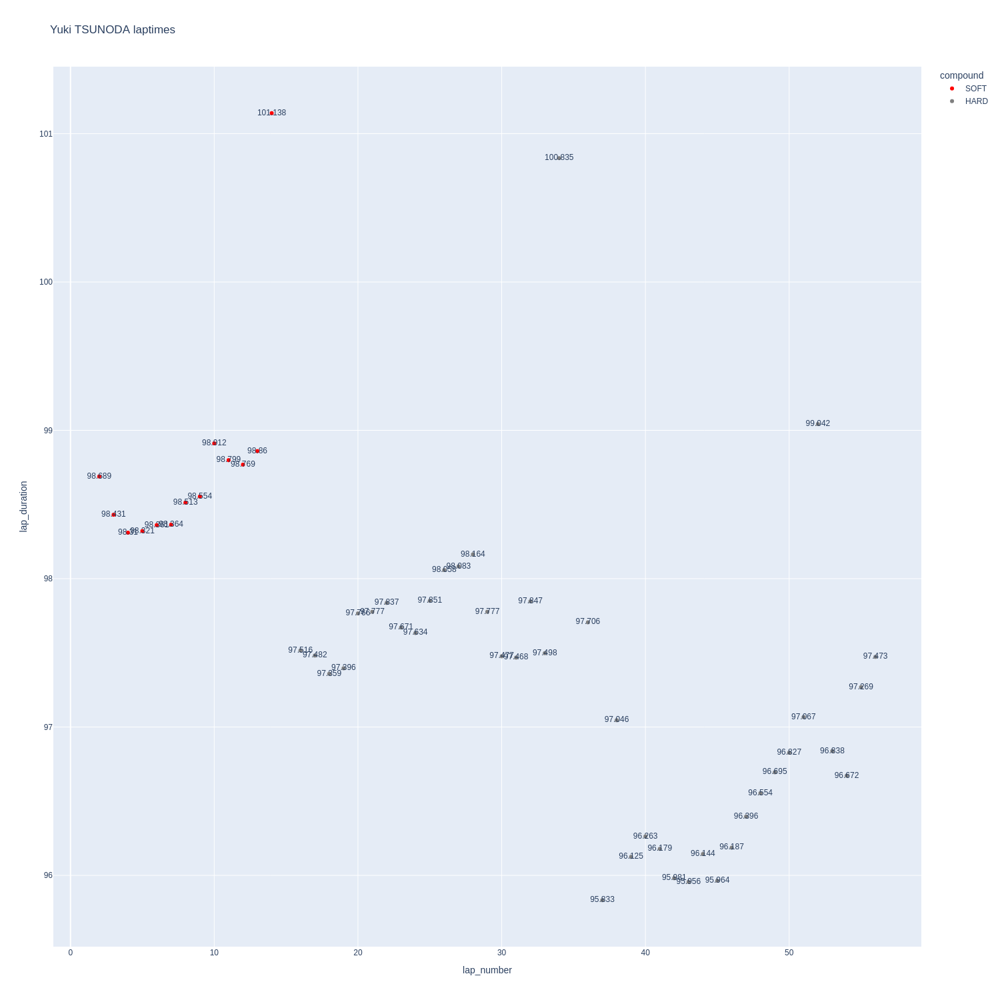

In [228]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

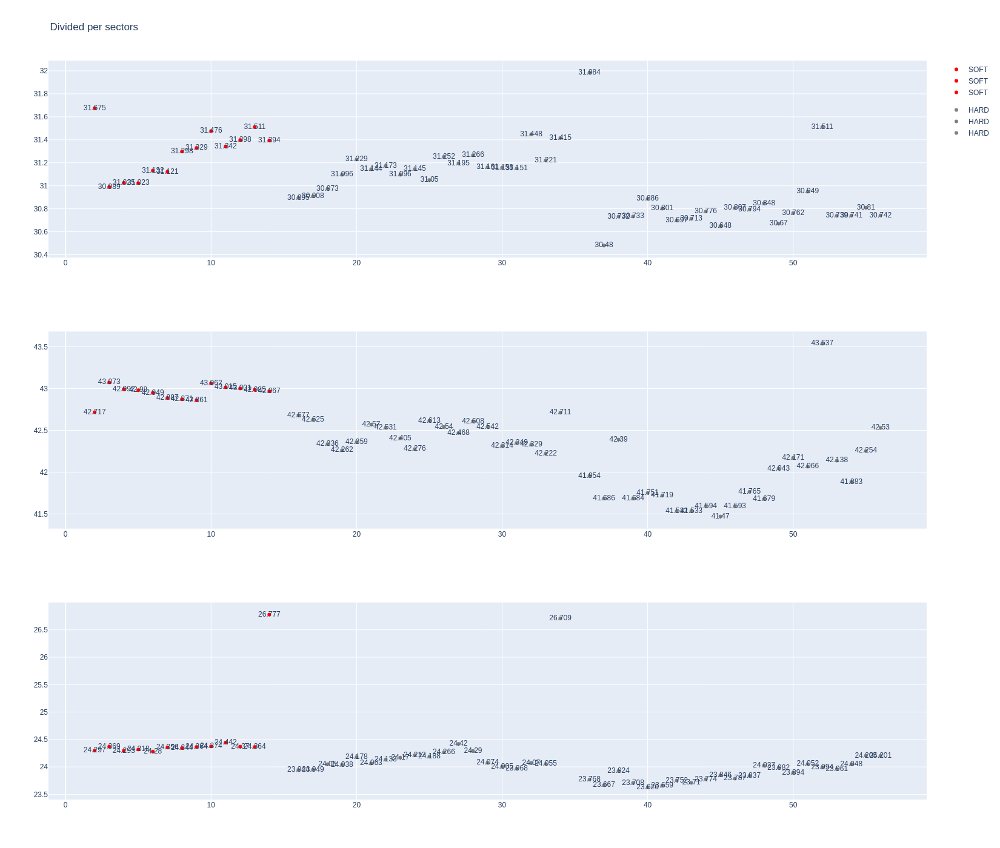

In [229]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [230]:
stintInformation.query('driver_number == 20 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1229,9472,1,27,1,1,SOFT,0
6,1229,9472,1,20,1,11,SOFT,0
20,1229,9472,2,27,2,20,HARD,0
26,1229,9472,2,20,12,32,HARD,0
40,1229,9472,3,27,21,41,HARD,0
48,1229,9472,3,20,33,57,HARD,0
60,1229,9472,4,27,42,57,SOFT,0


In [231]:
data = libraryDataF1.getinfolongruns(jointables,20,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
29,Kevin MAGNUSSEN,SOFT,2024-03-02T15:05:27.191000+00:00,2,31.591,43.075,24.245,98.911
48,Kevin MAGNUSSEN,SOFT,2024-03-02T15:07:06.129000+00:00,3,30.969,43.118,24.312,98.399
68,Kevin MAGNUSSEN,SOFT,2024-03-02T15:08:44.453000+00:00,4,30.993,42.992,24.512,98.497
88,Kevin MAGNUSSEN,SOFT,2024-03-02T15:10:22.918000+00:00,5,31.066,43.108,24.402,98.576
108,Kevin MAGNUSSEN,SOFT,2024-03-02T15:12:01.544000+00:00,6,30.952,43.041,24.536,98.529
128,Kevin MAGNUSSEN,SOFT,2024-03-02T15:13:40.046000+00:00,7,32.132,43.112,24.814,100.058
148,Kevin MAGNUSSEN,SOFT,2024-03-02T15:15:20.089000+00:00,8,31.557,43.072,24.543,99.172
168,Kevin MAGNUSSEN,SOFT,2024-03-02T15:16:59.332000+00:00,9,31.383,42.932,24.546,98.861
187,Kevin MAGNUSSEN,SOFT,2024-03-02T15:18:38.135000+00:00,10,31.307,42.925,24.515,98.747
205,Kevin MAGNUSSEN,SOFT,2024-03-02T15:20:16.971000+00:00,11,31.311,42.714,27.063,101.088


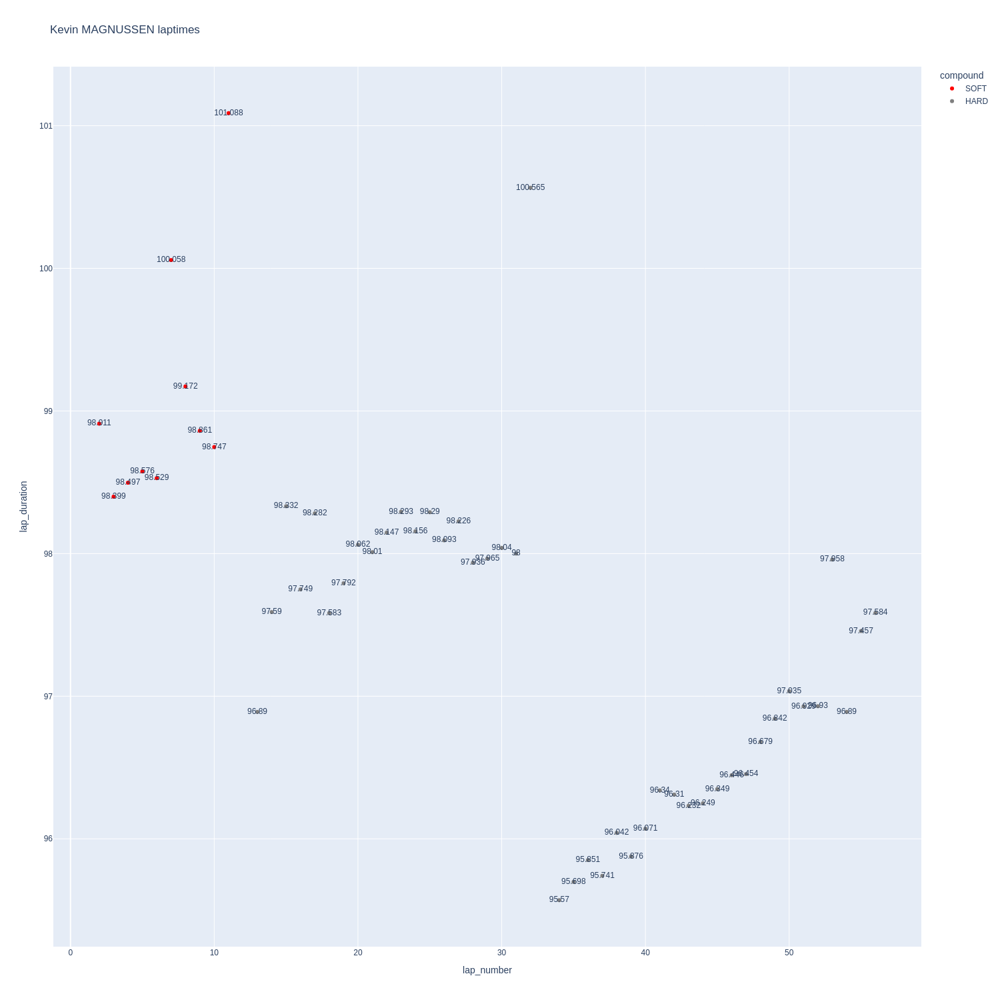

In [232]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

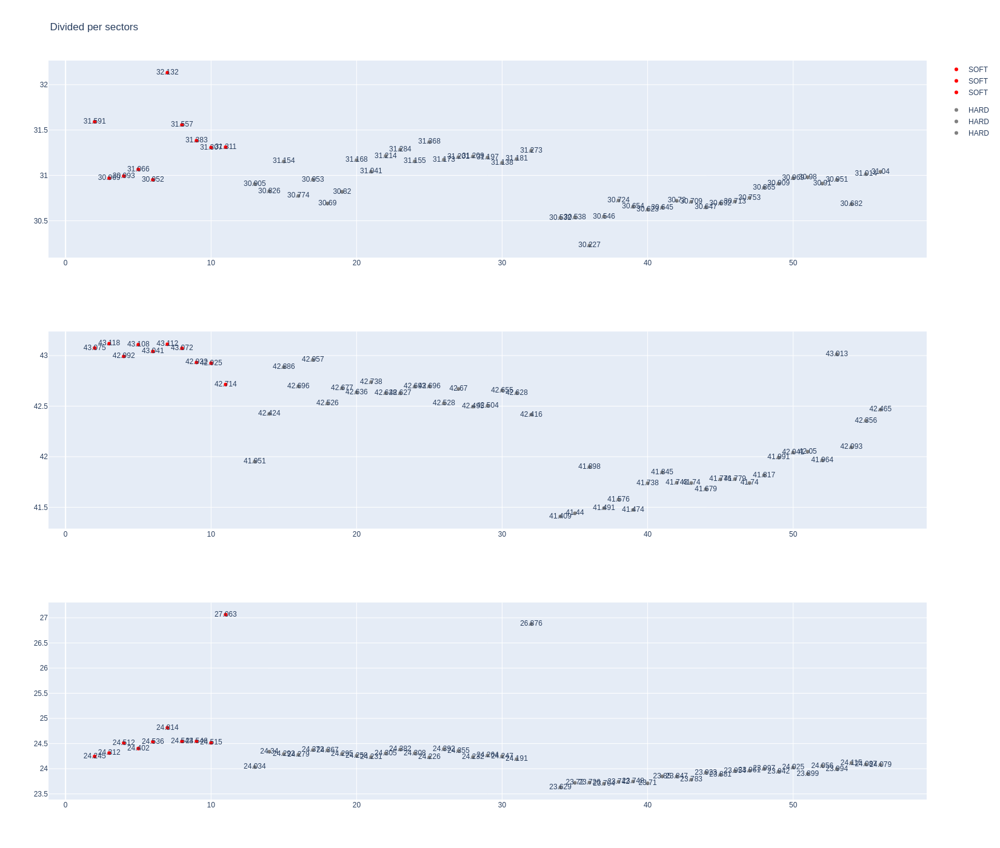

In [233]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [234]:
data = libraryDataF1.getinfolongruns(jointables,27,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
52,Nico HULKENBERG,HARD,2024-03-02T15:07:47.290000+00:00,3,30.970,42.434,23.913,97.317
72,Nico HULKENBERG,HARD,2024-03-02T15:09:24.588000+00:00,4,30.901,42.469,23.979,97.349
92,Nico HULKENBERG,HARD,2024-03-02T15:11:01.949000+00:00,5,30.928,42.706,24.029,97.663
112,Nico HULKENBERG,HARD,2024-03-02T15:12:39.609000+00:00,6,31.013,42.852,24.031,97.896
132,Nico HULKENBERG,HARD,2024-03-02T15:14:17.531000+00:00,7,30.976,42.750,23.956,97.682
152,Nico HULKENBERG,HARD,2024-03-02T15:15:55.237000+00:00,8,31.038,42.737,24.045,97.820
172,Nico HULKENBERG,HARD,2024-03-02T15:17:32.972000+00:00,9,31.041,42.691,24.151,97.883
190,Nico HULKENBERG,HARD,2024-03-02T15:19:10.914000+00:00,10,31.372,42.839,24.159,98.370
209,Nico HULKENBERG,HARD,2024-03-02T15:20:49.151000+00:00,11,31.000,42.573,24.065,97.638
226,Nico HULKENBERG,HARD,2024-03-02T15:22:26.890000+00:00,12,30.977,42.629,24.100,97.706


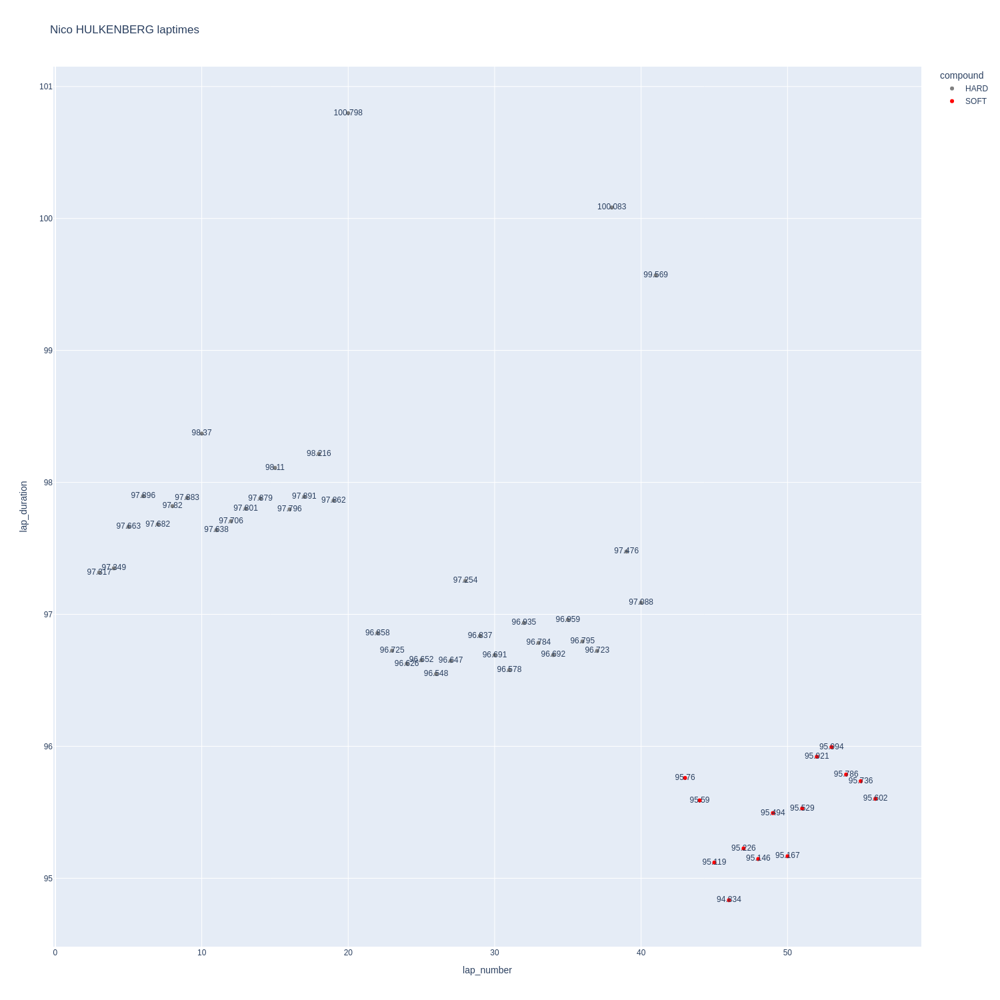

In [235]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

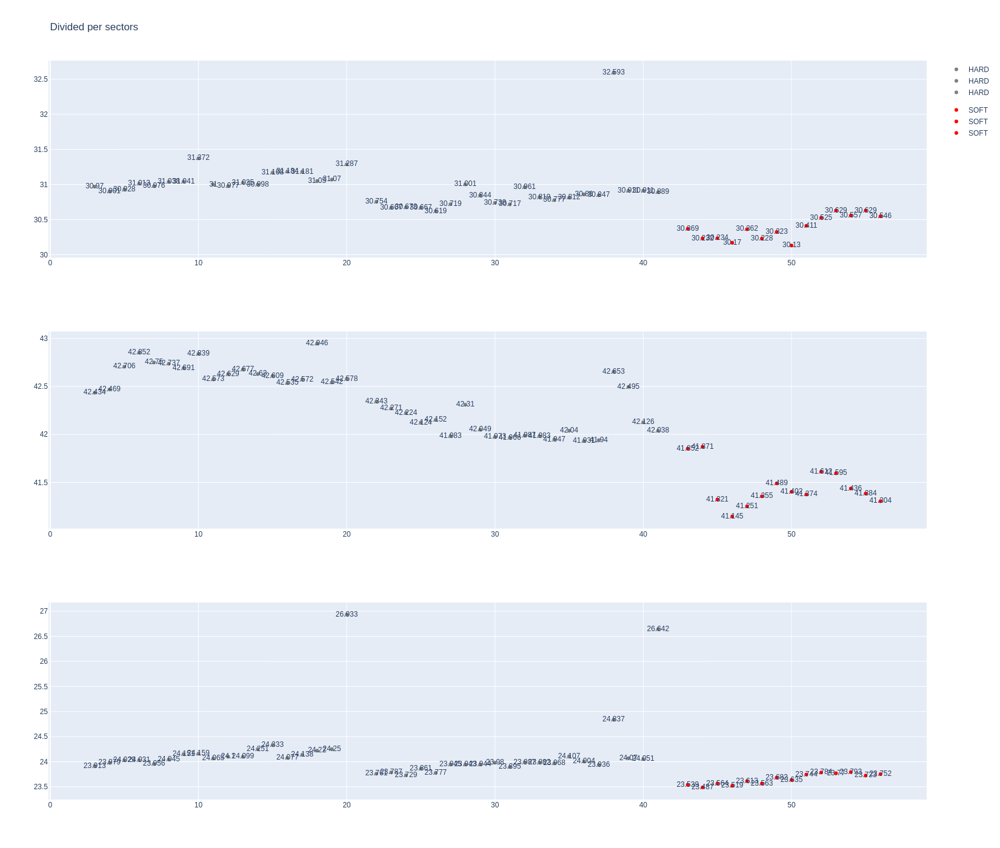

In [236]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [237]:
stintInformation.query('driver_number == 10 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1229,9472,1,31,1,10,SOFT,0
8,1229,9472,1,10,1,12,SOFT,0
24,1229,9472,2,31,11,30,HARD,0
29,1229,9472,2,10,13,31,HARD,0
44,1229,9472,3,31,31,57,HARD,0
46,1229,9472,3,10,32,43,HARD,0
62,1229,9472,4,10,44,57,SOFT,0


In [238]:
data =libraryDataF1.getinfolongruns(jointables,31,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
33,Esteban OCON,SOFT,2024-03-02T15:05:29.423000+00:00,2,32.005,42.719,24.370,99.094
53,Esteban OCON,SOFT,2024-03-02T15:07:08.536000+00:00,3,31.255,43.007,24.509,98.771
73,Esteban OCON,SOFT,2024-03-02T15:08:47.391000+00:00,4,31.246,42.915,24.464,98.625
93,Esteban OCON,SOFT,2024-03-02T15:10:25.925000+00:00,5,31.171,42.891,24.578,98.640
113,Esteban OCON,SOFT,2024-03-02T15:12:04.606000+00:00,6,31.245,42.978,24.651,98.874
133,Esteban OCON,SOFT,2024-03-02T15:13:43.401000+00:00,7,31.404,43.089,24.659,99.152
153,Esteban OCON,SOFT,2024-03-02T15:15:22.699000+00:00,8,31.252,43.382,24.788,99.422
173,Esteban OCON,SOFT,2024-03-02T15:17:01.994000+00:00,9,31.189,43.409,24.714,99.312
191,Esteban OCON,SOFT,2024-03-02T15:18:41.340000+00:00,10,31.308,42.956,27.378,101.642
227,Esteban OCON,HARD,2024-03-02T15:22:21.966000+00:00,12,31.175,42.399,24.025,97.599


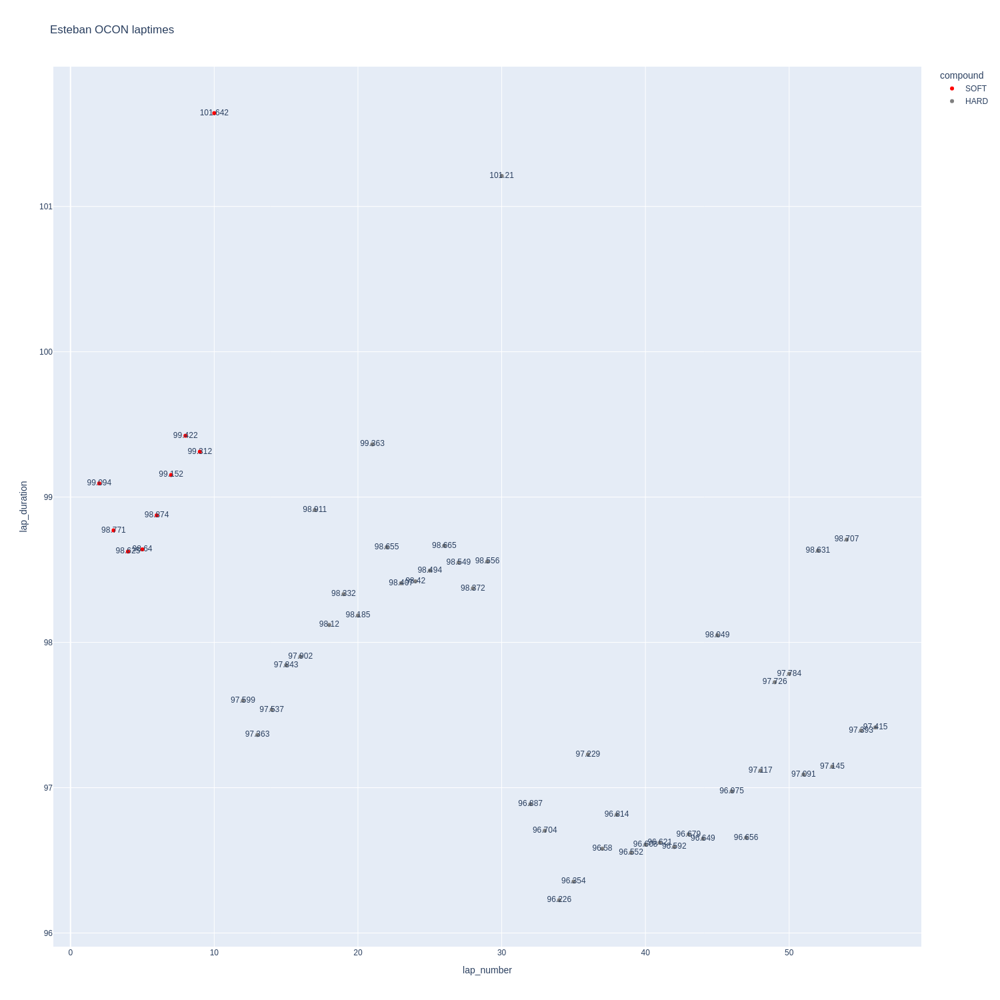

In [239]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

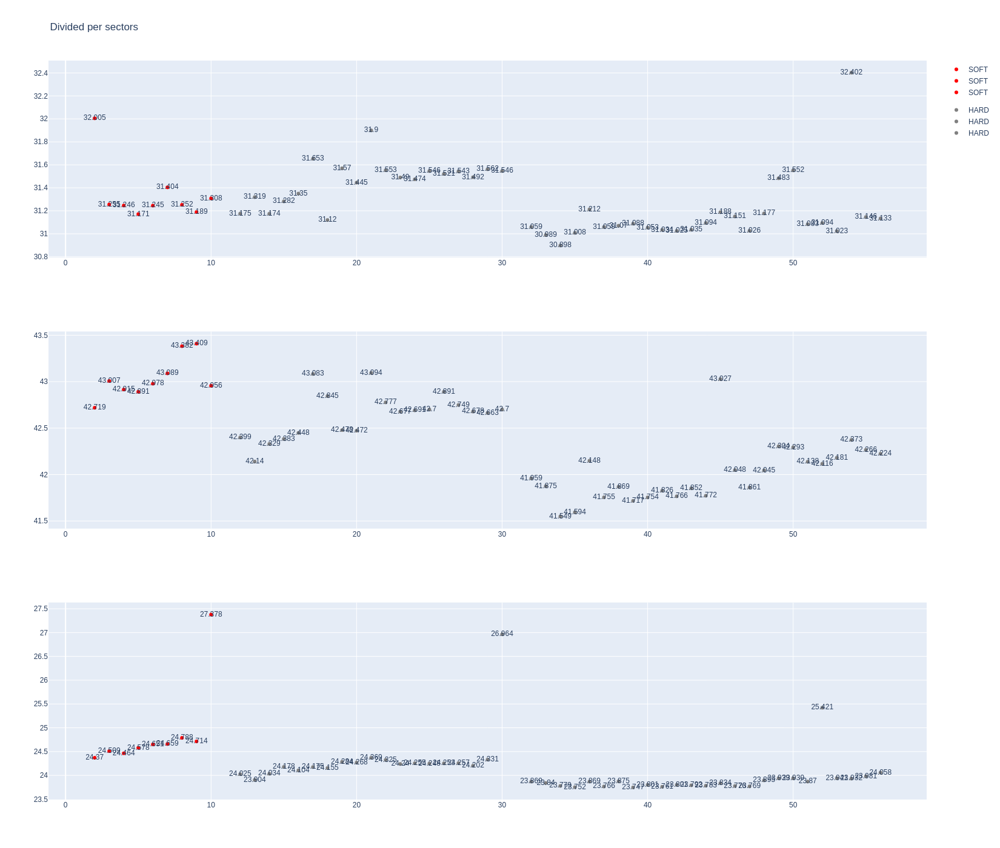

In [240]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [241]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
24,Pierre GASLY,SOFT,2024-03-02T15:05:30.020000+00:00,2,31.860,42.743,24.456,99.059
43,Pierre GASLY,SOFT,2024-03-02T15:07:09.187000+00:00,3,31.254,42.848,24.642,98.744
63,Pierre GASLY,SOFT,2024-03-02T15:08:47.834000+00:00,4,31.305,42.705,24.493,98.503
83,Pierre GASLY,SOFT,2024-03-02T15:10:26.498000+00:00,5,31.344,42.718,24.602,98.664
103,Pierre GASLY,SOFT,2024-03-02T15:12:05.094000+00:00,6,31.457,42.995,24.647,99.099
123,Pierre GASLY,SOFT,2024-03-02T15:13:44.100000+00:00,7,31.353,43.110,24.615,99.078
143,Pierre GASLY,SOFT,2024-03-02T15:15:23.253000+00:00,8,31.210,43.311,24.766,99.287
163,Pierre GASLY,SOFT,2024-03-02T15:17:02.598000+00:00,9,31.400,43.321,24.731,99.452
183,Pierre GASLY,SOFT,2024-03-02T15:18:42.035000+00:00,10,31.383,43.016,24.530,98.929
200,Pierre GASLY,SOFT,2024-03-02T15:20:20.748000+00:00,11,31.329,42.886,24.441,98.656


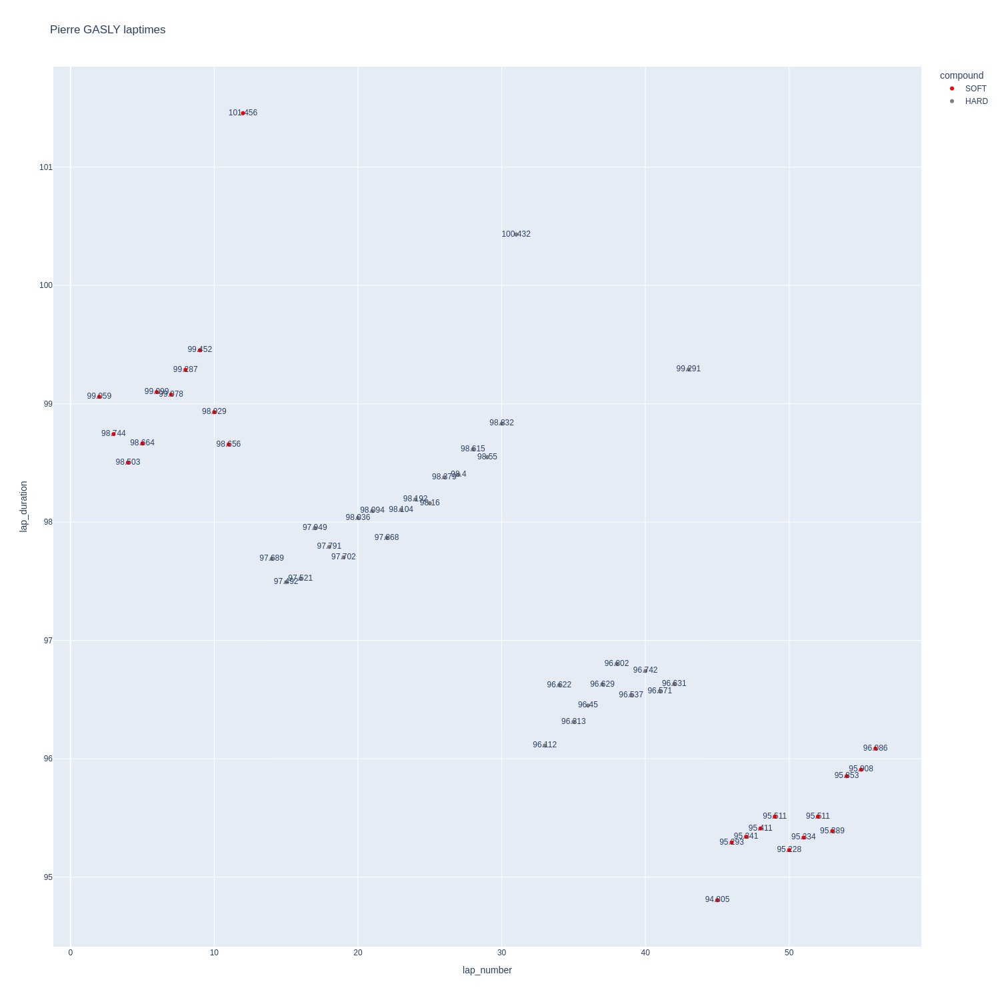

In [242]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

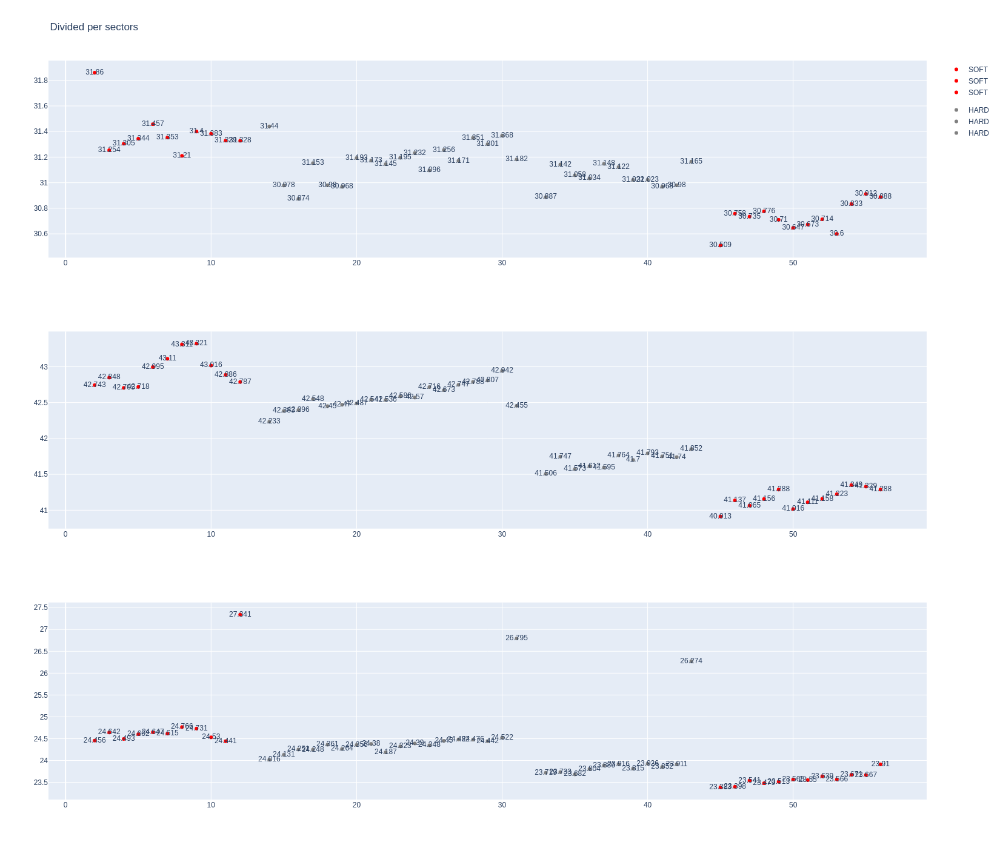

In [243]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [244]:
stintInformation.query('driver_number == 2 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1229,9472,1,2,1,10,SOFT,0
18,1229,9472,1,23,1,15,SOFT,0
23,1229,9472,2,2,11,28,HARD,0
37,1229,9472,2,23,16,36,HARD,0
42,1229,9472,3,2,29,40,HARD,0
56,1229,9472,3,23,37,57,HARD,0
59,1229,9472,4,2,41,56,SOFT,0


In [245]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
31,Alexander ALBON,SOFT,2024-03-02T15:05:26.586000+00:00,2,31.419,43.106,24.301,98.826
50,Alexander ALBON,SOFT,2024-03-02T15:07:05.531000+00:00,3,31.002,43.081,24.424,98.507
70,Alexander ALBON,SOFT,2024-03-02T15:08:44.072000+00:00,4,31.023,43.007,24.392,98.422
90,Alexander ALBON,SOFT,2024-03-02T15:10:22.387000+00:00,5,31.049,43.027,24.433,98.509
110,Alexander ALBON,SOFT,2024-03-02T15:12:00.934000+00:00,6,31.034,43.141,24.400,98.575
130,Alexander ALBON,SOFT,2024-03-02T15:13:39.536000+00:00,7,31.498,43.186,24.287,98.971
150,Alexander ALBON,SOFT,2024-03-02T15:15:18.421000+00:00,8,31.493,42.899,24.268,98.660
170,Alexander ALBON,SOFT,2024-03-02T15:16:57.147000+00:00,9,31.458,42.976,24.218,98.652
189,Alexander ALBON,SOFT,2024-03-02T15:18:35.817000+00:00,10,31.624,42.955,24.373,98.952
207,Alexander ALBON,SOFT,2024-03-02T15:20:14.778000+00:00,11,31.490,42.923,24.422,98.835


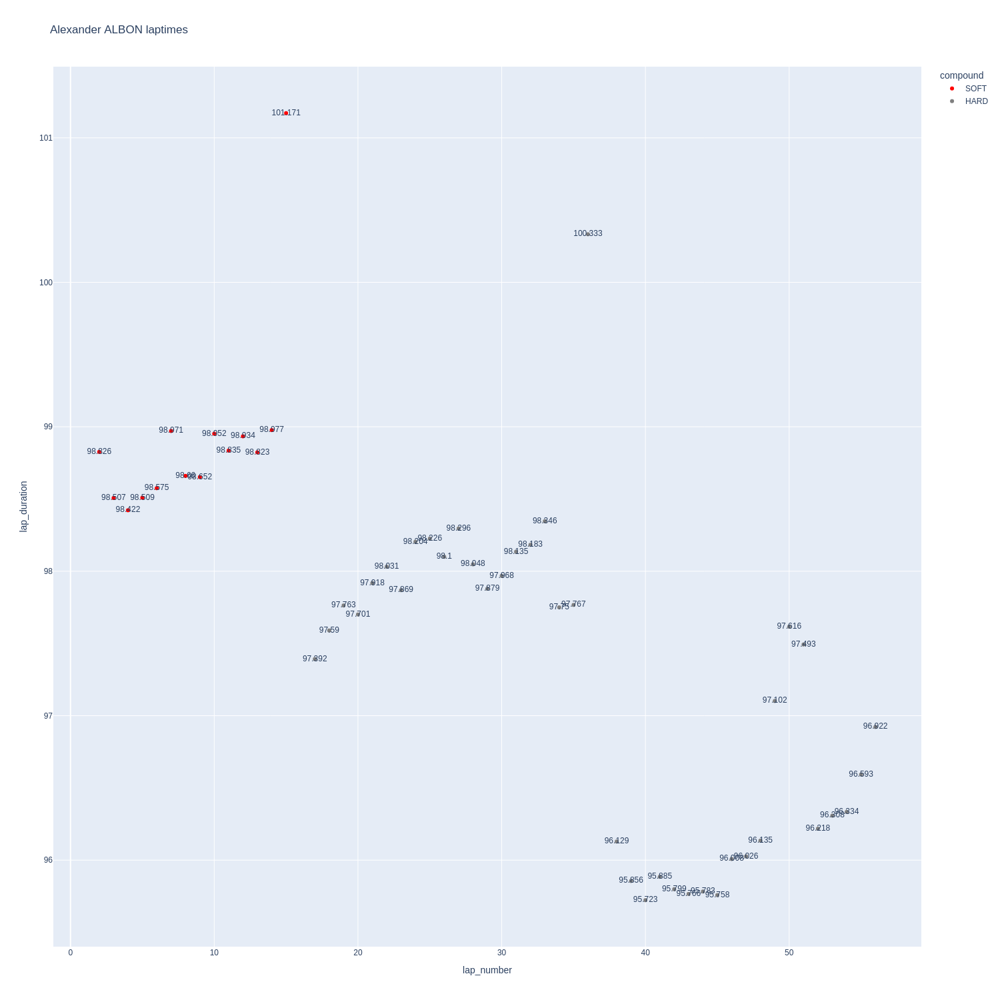

In [246]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

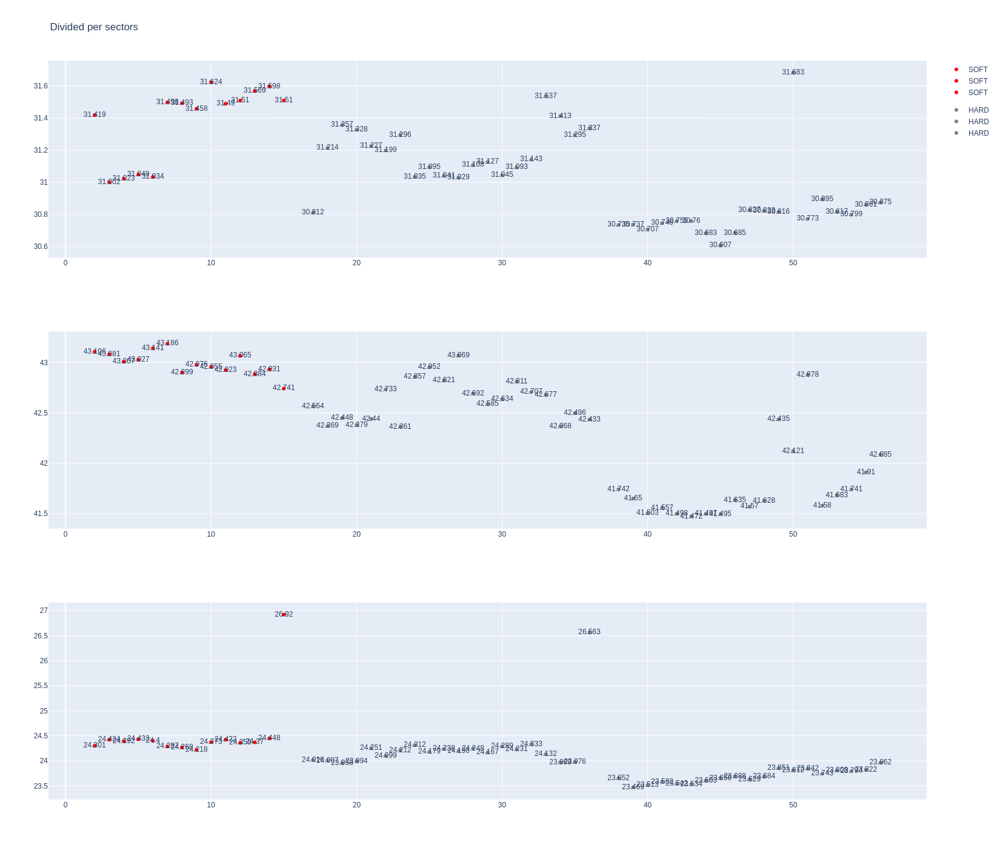

In [247]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [248]:
data= libraryDataF1.getinfolongruns(jointables,2,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,Logan SARGEANT,SOFT,2024-03-02T15:05:28.737000+00:00,2,31.096,43.005,24.380,98.481
40,Logan SARGEANT,SOFT,2024-03-02T15:07:07.169000+00:00,3,31.105,43.155,24.447,98.707
60,Logan SARGEANT,SOFT,2024-03-02T15:08:45.974000+00:00,4,31.044,42.904,24.442,98.390
80,Logan SARGEANT,SOFT,2024-03-02T15:10:24.343000+00:00,5,31.048,43.209,24.500,98.757
100,Logan SARGEANT,SOFT,2024-03-02T15:12:03.067000+00:00,6,31.037,42.981,24.564,98.582
120,Logan SARGEANT,SOFT,2024-03-02T15:13:41.625000+00:00,7,31.373,43.491,24.600,99.464
140,Logan SARGEANT,SOFT,2024-03-02T15:15:21.091000+00:00,8,31.566,43.336,24.678,99.580
160,Logan SARGEANT,SOFT,2024-03-02T15:17:00.723000+00:00,9,31.398,43.299,24.669,99.366
216,Logan SARGEANT,HARD,2024-03-02T15:23:34.319000+00:00,12,31.666,42.766,24.061,98.493
233,Logan SARGEANT,HARD,2024-03-02T15:25:12.827000+00:00,13,31.427,43.601,25.961,100.989


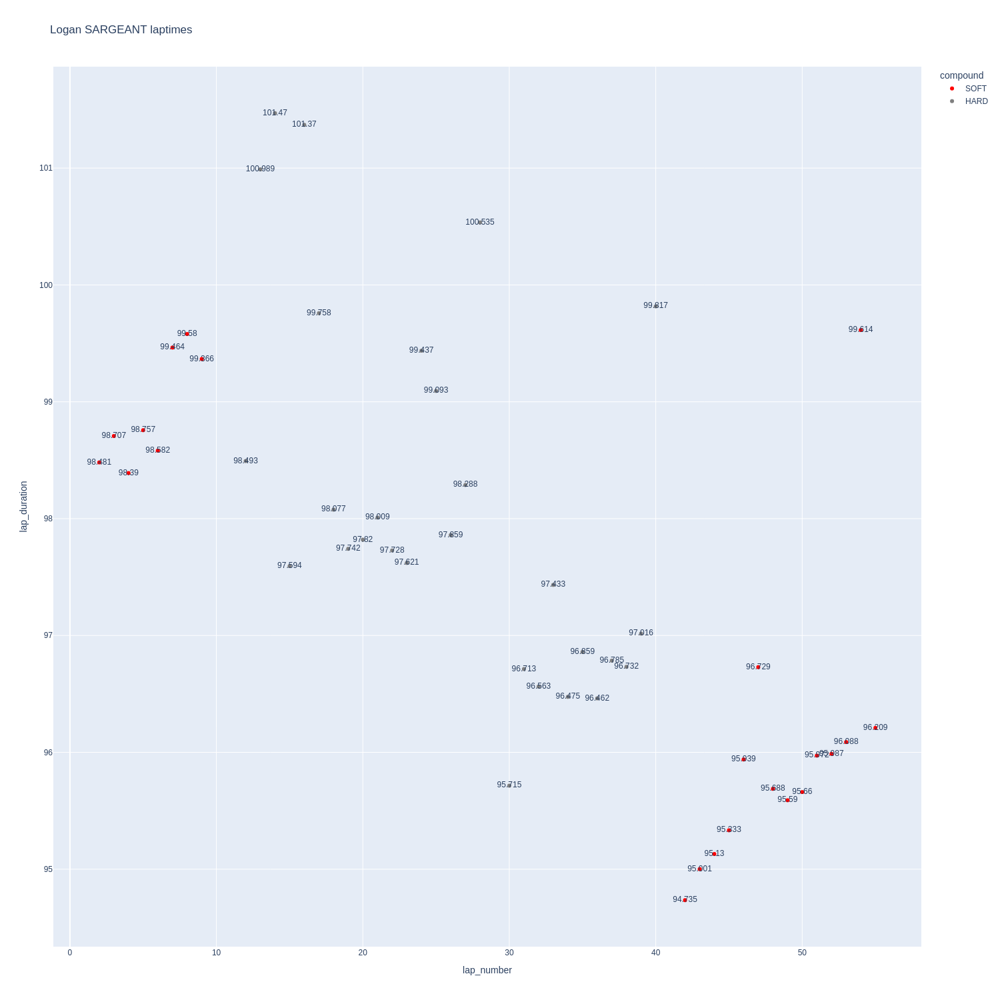

In [249]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

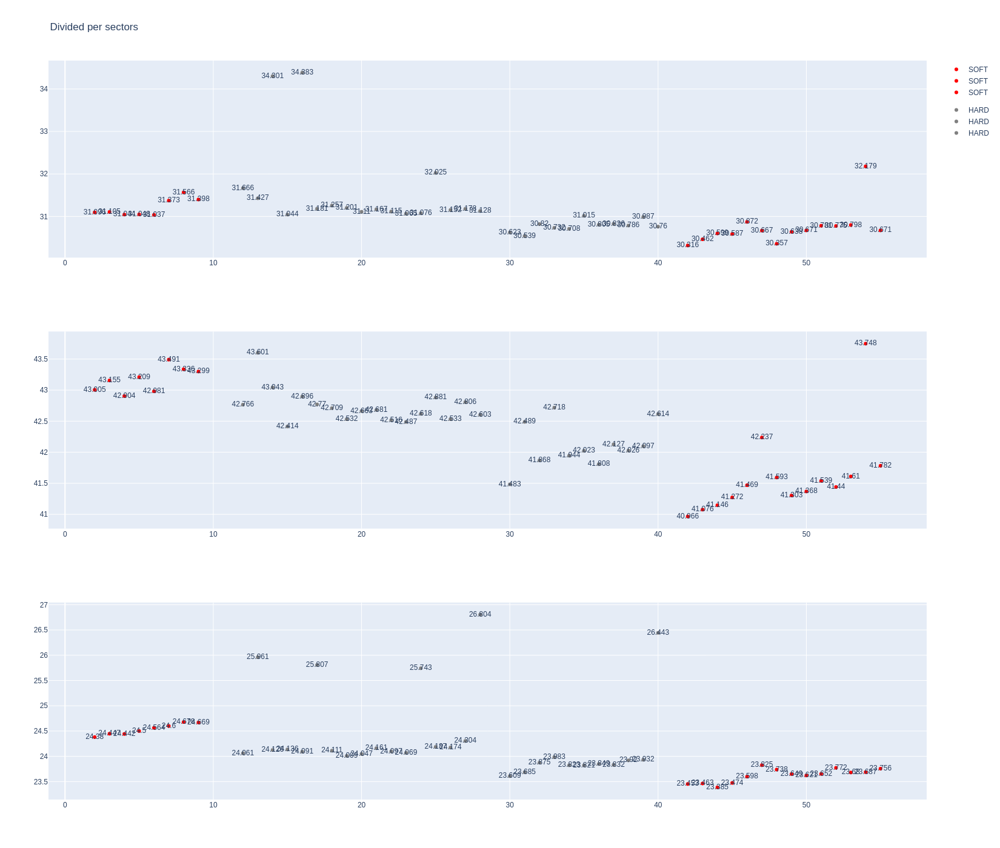

In [250]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [251]:
stintInformation.query('driver_number == 24 or driver_number == 77')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1229,9472,1,24,1,9,SOFT,0
11,1229,9472,1,77,1,12,SOFT,0
22,1229,9472,2,24,10,28,HARD,0
28,1229,9472,2,77,13,30,HARD,0
43,1229,9472,3,24,29,57,HARD,0
45,1229,9472,3,77,31,57,HARD,0


In [252]:
data = libraryDataF1.getinfolongruns(jointables,24,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
32,ZHOU Guanyu,SOFT,2024-03-02T15:05:27.553000+00:00,2,31.452,43.135,24.333,98.920
51,ZHOU Guanyu,SOFT,2024-03-02T15:07:06.448000+00:00,3,31.044,43.084,24.454,98.582
71,ZHOU Guanyu,SOFT,2024-03-02T15:08:45.105000+00:00,4,30.977,43.004,24.447,98.428
91,ZHOU Guanyu,SOFT,2024-03-02T15:10:23.479000+00:00,5,31.116,43.178,24.504,98.798
111,ZHOU Guanyu,SOFT,2024-03-02T15:12:02.417000+00:00,6,30.860,43.064,24.564,98.488
131,ZHOU Guanyu,SOFT,2024-03-02T15:13:40.801000+00:00,7,31.488,43.470,24.559,99.517
151,ZHOU Guanyu,SOFT,2024-03-02T15:15:20.426000+00:00,8,31.786,43.138,24.722,99.646
171,ZHOU Guanyu,SOFT,2024-03-02T15:16:59.925000+00:00,9,31.330,43.094,27.425,101.849
208,ZHOU Guanyu,HARD,2024-03-02T15:20:41.091000+00:00,11,30.815,41.738,23.812,96.365
225,ZHOU Guanyu,HARD,2024-03-02T15:22:17.447000+00:00,12,31.006,42.207,23.782,96.995


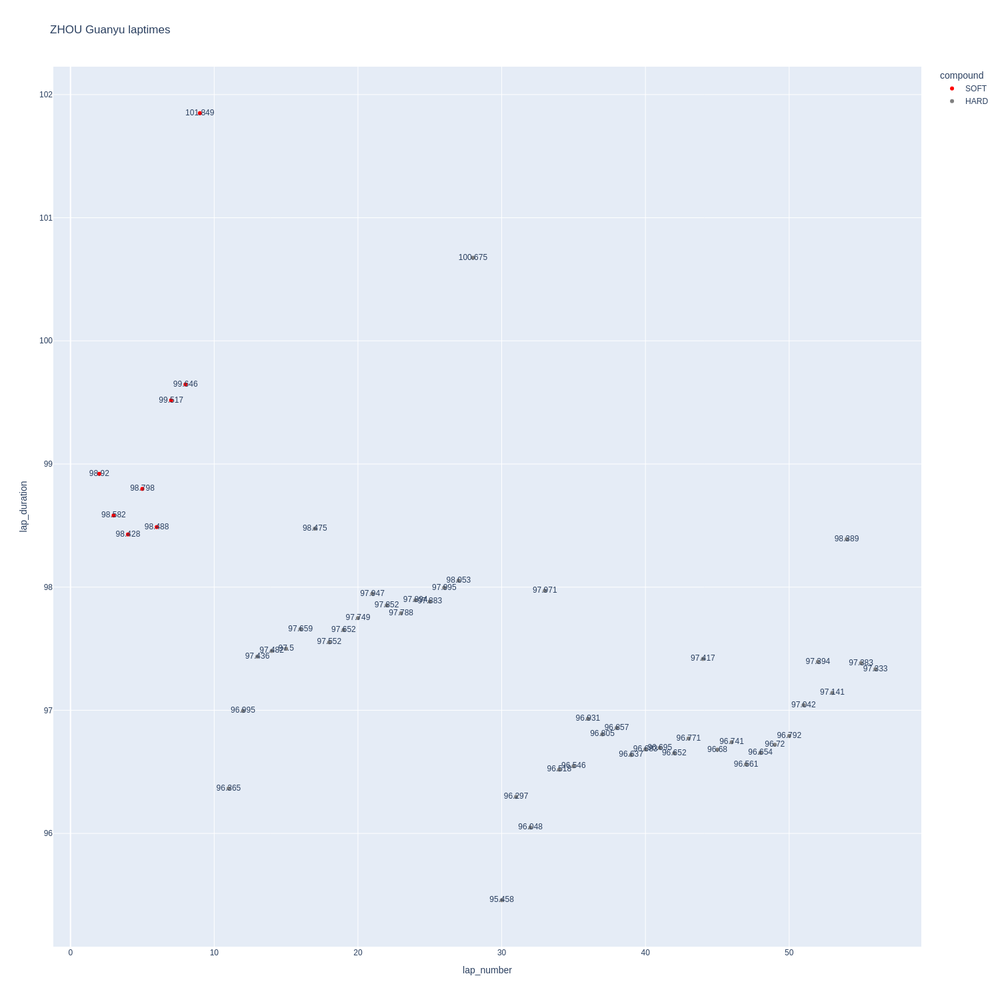

In [253]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

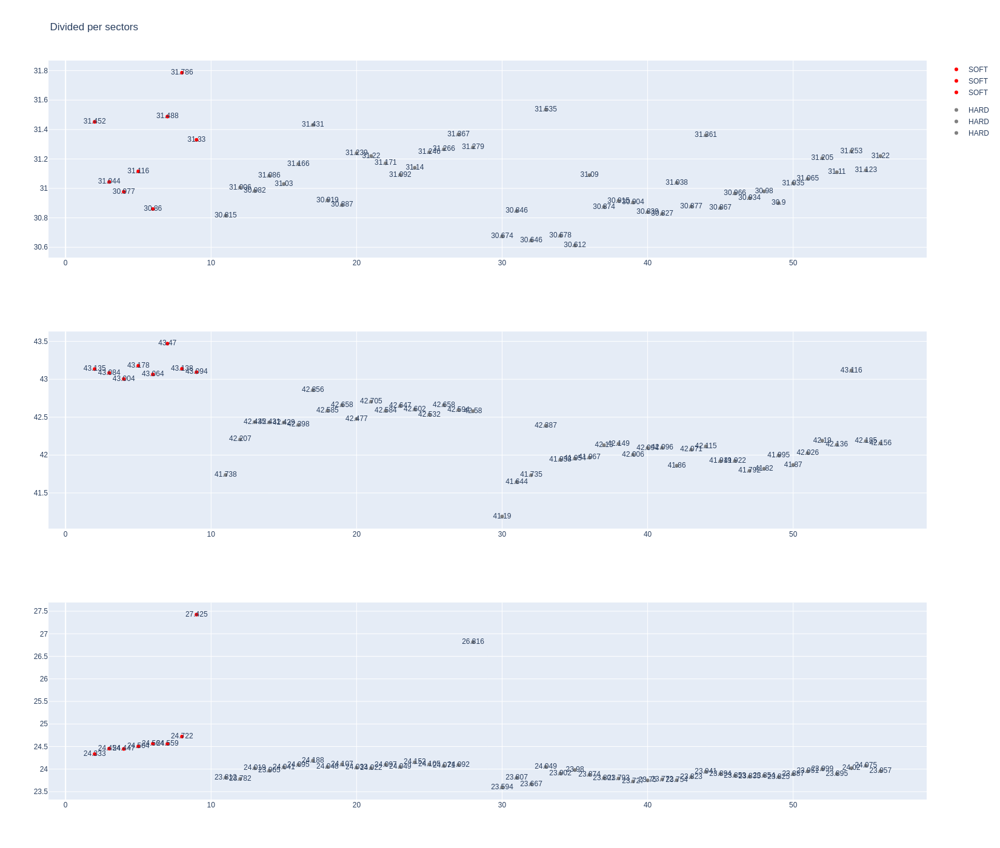

In [254]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [255]:
data = libraryDataF1.getinfolongruns(jointables,77,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
37,Valtteri BOTTAS,SOFT,2024-03-02T15:05:31.193000+00:00,2,31.351,42.663,24.245,98.259
57,Valtteri BOTTAS,SOFT,2024-03-02T15:07:09.750000+00:00,3,31.119,43.321,24.397,98.837
77,Valtteri BOTTAS,SOFT,2024-03-02T15:08:48.424000+00:00,4,31.127,43.121,24.395,98.643
97,Valtteri BOTTAS,SOFT,2024-03-02T15:10:27.119000+00:00,5,31.083,44.295,24.709,100.087
117,Valtteri BOTTAS,SOFT,2024-03-02T15:12:07.153000+00:00,6,31.184,43.504,24.518,99.206
137,Valtteri BOTTAS,SOFT,2024-03-02T15:13:46.456000+00:00,7,31.034,43.072,24.548,98.654
157,Valtteri BOTTAS,SOFT,2024-03-02T15:15:25.115000+00:00,8,30.959,43.356,24.653,98.968
177,Valtteri BOTTAS,SOFT,2024-03-02T15:17:04.011000+00:00,9,31.373,43.349,24.703,99.425
195,Valtteri BOTTAS,SOFT,2024-03-02T15:18:43.373000+00:00,10,31.409,43.189,24.514,99.112
213,Valtteri BOTTAS,SOFT,2024-03-02T15:20:22.466000+00:00,11,31.524,43.182,24.481,99.187


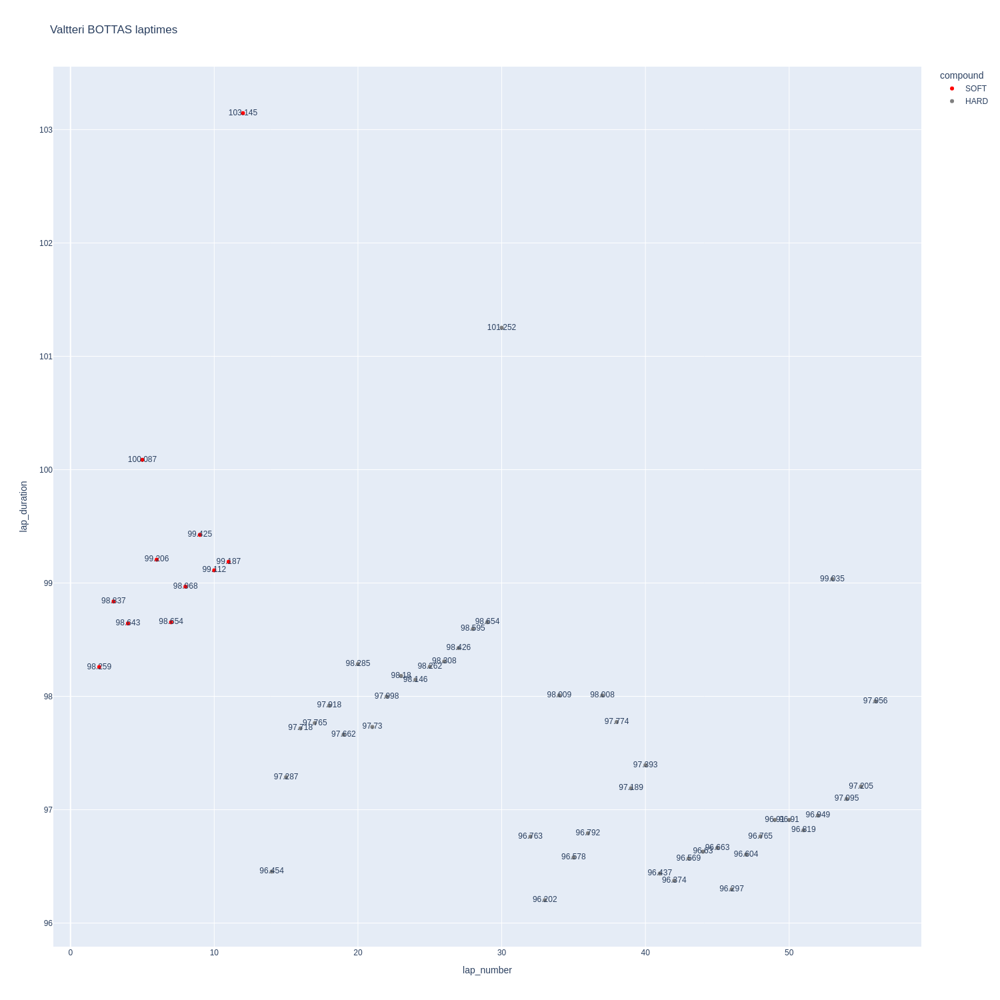

In [256]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

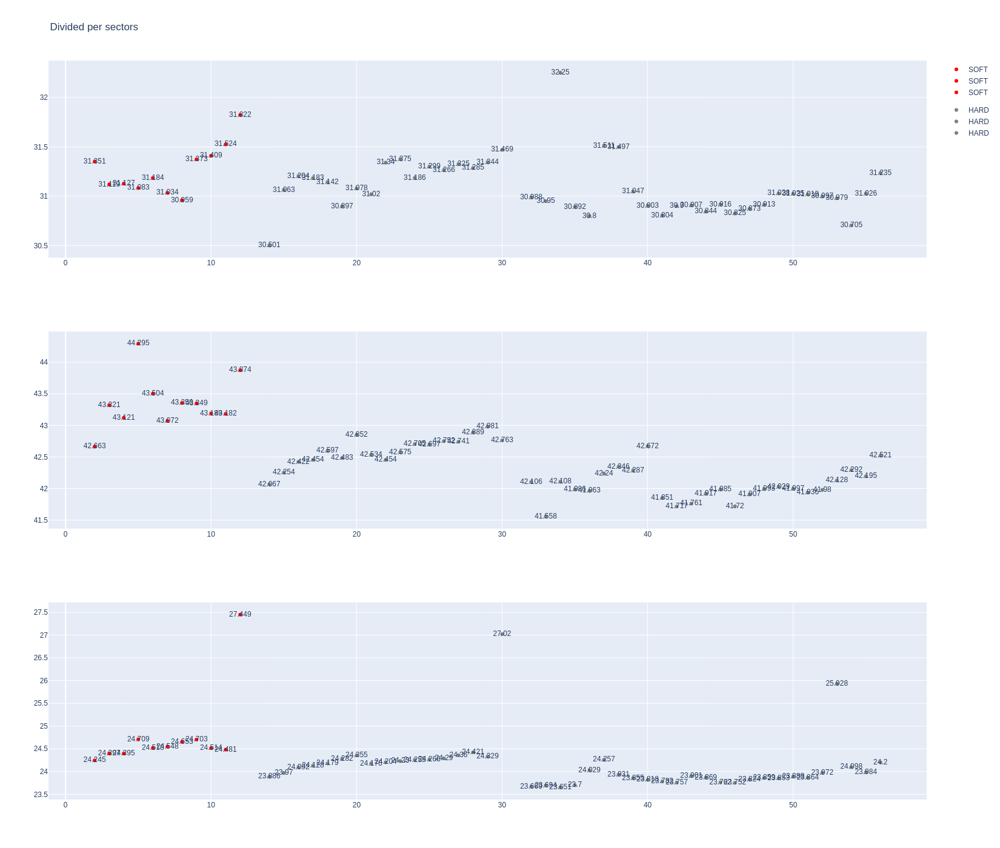

In [257]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [258]:
pit = libraryDataF1.obtain_information('pit',session_key=9472)

In [259]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration

,pit_duration
team_name,
Ferrari,24.075
Red Bull Racing,24.550
Mercedes,24.625
Aston Martin,24.675
RB,24.675
McLaren,24.775
Alpine,26.280
Williams,27.040
Haas F1 Team,27.180
